In [2]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt

from qick import *
from qick.helpers import gauss
from tqdm import tqdm_notebook as tqdm

import time
import os
import sys
sys.path.append('/home/xilinx/jupyter_notebooks/')
sys.path.append('C:\\_Lib\\python\\rfsoc\\rfsoc_multimode\\example_expts')
import scipy as sp
import json
from scipy.fft import fft, fftfreq

from slab.instruments import *
from slab.experiment import Experiment
from slab.datamanagement import SlabFile
from slab import get_next_filename, AttrDict

# Figure params
plt.rcParams['figure.figsize'] = [10,6]
plt.rcParams.update({'font.size': 14})

Warning serial library import failed.
Could not load InstrumentManagerWindow
Could not import QickInstrument, try install qick package
Could not load AD5780 dac 
Could not load labbrick
Could not load Autonics TM4 Driver


In [3]:
from slab.dsfit import *
import os
from scipy.interpolate import griddata
from numpy import mgrid, array, zeros,abs,pi,cos,transpose, linspace
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from tempfile import TemporaryFile
font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : 15}
import json
from h5py import File
from datetime import datetime
import time
from slab.datamanagement import SlabFile
import matplotlib.pyplot as plt
import numpy as np
import os
import json
from slab.dsfit import *
from scipy.optimize import curve_fit
import experiments.fitting as fitter

imported experiments.fitting
imported experiments.qram_protocol_timestepped
imported experiments.clifford_averager_program
imported experiments.qubit_cavity.photo_resolved_pulse_probe
imported experiments.qubit_cavity.small_chi_calibration
imported experiments.qubit_cavity.displace_ramsey
imported experiments.qubit_cavity.displace_amplitude_calibration
imported experiments.qubit_cavity.single_mode_wigner_tomography
imported experiments.qubit_cavity.test_opt
imported experiments.qubit_cavity.test_opt2
imported experiments.qubit_cavity.non_demolution_readout
imported experiments.qubit_cavity.qubit_cavity_opt
imported experiments.qubit_cavity.test_opt_ecd
imported experiments.qubit_cavity.ecd
imported experiments.qubit_cavity.ecd_read_spec
imported experiments.qubit_cavity.ecd_backup
imported experiments.qubit_cavity.single_mode_wigner_tomography - Copy


imported experiments.two_qubit.pulse_probe_coupling_spectroscopy
imported experiments.two_qubit.twoQ_state_tomography
imported experiments.two_qubit.length_rabi_pi_pulse_ZZ
imported experiments.two_qubit.twoqutrit_state_tomography
imported experiments.two_qubit.pulse_probe_EgGf_spectroscopy
imported experiments.two_qubit.amplitude_rabi_EgGf
imported experiments.two_qubit.length_rabi_EgGf
imported experiments.single_qubit.t2_echo
imported experiments.single_qubit.amplitude_rabi_ef
imported experiments.single_qubit.t1_cavity
imported experiments.single_qubit.rf_flux_modulation_general
imported experiments.single_qubit.rf_flux_spectroscopy
imported experiments.single_qubit.single_shot
imported experiments.single_qubit.cavity_readout_general - Copy
imported experiments.single_qubit.sideband_general
imported experiments.single_qubit.resonator_spectroscopy
imported experiments.single_qubit.randbench
imported experiments.single_qubit.rfsoc_tof_calibration
imported experiments.single_qubit.amp

# Fitting function

In [4]:
def fitamp_new(p1, p2):
    fitamparray = []
    fitfreqarray = []
    
    fitamparray_err = []
    fitfreqarray_err = []

    n_peaks = int(len(p1))
    for i in range(n_peaks):
        fitamparray.append(p1[i][1])
        fitfreqarray.append(p1[i][2])
        fitamparray_err.append(np.sqrt(np.diag(p2[i])[1]))
        fitfreqarray_err.append(np.sqrt(np.diag(p2[i])[2]))
        
    return fitamparray , fitfreqarray, fitamparray_err, fitfreqarray_err
def fitgeneral(xdata, ydata, fitfunc, fitparams, domain=None, showfit=False, showstartfit=False, showdata=True,
               label="", mark_data='bo', mark_fit='r-'):
    """Uses optimize.leastsq to fit xdata ,ydata using fitfunc and adjusting fit params"""
    # sort data
    order = np.argsort(xdata)
    xdata = xdata[order]
    ydata = ydata[order]
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
#    print 'minimum', np.min(fitdatay)
#    ymin=np.min(fitdatay)
    errfunc = lambda p, x, y: (fitfunc(p,x) - y) #there shouldn't be **2 # Distance to the target function
    startparams=fitparams # Initial guess for the parameters
    bestfitparams, success = optimize.leastsq(errfunc, startparams[:], args=(fitdatax,fitdatay))
    if showfit:
        if showdata:
            plt.plot(fitdatax,fitdatay,mark_data,label=label+" data")
        if showstartfit:
            plt.plot(fitdatax,fitfunc(startparams,fitdatax),label=label+" startfit")
        plt.plot(fitdatax,fitfunc(bestfitparams,fitdatax),mark_fit,label=label+" fit")
        if label!='': plt.legend()
        err=math.fsum(errfunc(bestfitparams,fitdatax,fitdatay))
        #print 'the best fit has an RMS of {0}'.format(err)
#    plt.t
#    plt.figtext()
    return bestfitparams

def fitexp(xdata,ydata,fitparams=None,domain=None,showfit=False,showstartfit=False,label=""):
    """Fit exponential decay (p[0]+p[1]*exp(-(x-p[2])/p[3]))"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
    if fitparams is None:    
        fitparams=[0.,0.,0.,0.]
        fitparams[0]=fitdatay[-1]
        fitparams[1]=fitdatay[0]-fitdatay[-1]
        fitparams[1]=fitdatay[0]-fitdatay[-1]
        fitparams[2]=fitdatax[0]
        fitparams[3]=(fitdatax[-1]-fitdatax[0])/5.
    #print fitparams
    p1 = fitgeneral(fitdatax, fitdatay, expfunc, fitparams, domain=None, showfit=showfit, showstartfit=showstartfit,
                    label=label)
    return p1 

def fitdecaysinnew(xdata,ydata,fitparams=None,domain=None,showfit=False,showstartfit=False,label=""):
    """Fits decaying sin wave of form: p[0]*np.sin*2(2.*pi*p[1]*x+p[2]*pi/180.)*np.e**(-1.*(x-p[5])/p[3])+p[4]"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
    if fitparams is None:    
        FFT=scipy.fft(fitdatay)
        fft_freqs=scipy.fftpack.fftfreq(len(fitdatay),fitdatax[1]-fitdatax[0])
        max_ind=np.argmax(abs(FFT[4:int(len(fitdatay)/2)]))+4
        fft_val=FFT[max_ind]
        
        fitparams=[0,0,0,0,0]
        fitparams[4]=np.mean(fitdatay)
        fitparams[0]=(max(fitdatay)-min(fitdatay))/2.#2*abs(fft_val)/len(fitdatay)
        fitparams[1]=fft_freqs[max_ind]
        fitparams[2]=(cmath.phase(fft_val)-np.pi/2.)*180./np.pi
        fitparams[3]=(max(fitdatax)-min(fitdatax))

        #fitparams[5]=fitdatax[0]
        
    decaysin3 = lambda p, x: p[0] * np.sin(2. * np.pi * p[1] * x + p[2] * np.pi / 180.) **2 * np.e ** (
    -1. * (x - fitdatax[0]) / p[3]) + p[4]
    # decaysin3 = lambda p, x: p[0] * np.sin(2. * np.pi * p[1] * x + p[2] - np.pi / 2.) * np.e ** (
    # -1. * (x - fitdatax[0]) / p[3]) + p[4]
    #print "fitparams: ",fitparams
    p1 = fitgeneral(fitdatax, fitdatay, decaysin3, fitparams, domain=None, showfit=showfit, showstartfit=showstartfit,
                    label=label)
    return p1 

def fitdecaysin(xdata,ydata,fitparams=None,domain=None,showfit=False,showstartfit=False,label=""):
    """Fits decaying sin wave of form: p[0]*np.sin(2.*pi*p[1]*x+p[2]*pi/180.)*np.e**(-1.*(x-p[5])/p[3])+p[4]"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
    if fitparams is None:    
        FFT=scipy.fft(fitdatay)
        fft_freqs=scipy.fftpack.fftfreq(len(fitdatay),fitdatax[1]-fitdatax[0])
        max_ind=np.argmax(abs(FFT[4:int(len(fitdatay)/2)]))+4
        fft_val=FFT[max_ind]
        
        fitparams=[0,0,0,0,0]
        fitparams[4]=np.mean(fitdatay)
        fitparams[0]=(max(fitdatay)-min(fitdatay))/2.#2*abs(fft_val)/len(fitdatay)
        fitparams[1]=fft_freqs[max_ind]
        fitparams[2]=(cmath.phase(fft_val)-np.pi/2.)*180./np.pi
        fitparams[3]=(max(fitdatax)-min(fitdatax))

        #fitparams[5]=fitdatax[0]
        
    decaysin3 = lambda p, x: p[0] * np.sin(2. * np.pi * p[1] * x + p[2] * np.pi / 180.) * np.e ** (
    -1. * (x - fitdatax[0]) / p[3]) + p[4]
    # decaysin3 = lambda p, x: p[0] * np.sin(2. * np.pi * p[1] * x + p[2] - np.pi / 2.) * np.e ** (
    # -1. * (x - fitdatax[0]) / p[3]) + p[4]
    #print "fitparams: ",fitparams
    p1 = fitgeneral(fitdatax, fitdatay, decaysin3, fitparams, domain=None, showfit=showfit, showstartfit=showstartfit,
                    label=label)
    return p1  

def fitsin(xdata,ydata,fitparams=None,domain=None,showfit=False,showstartfit=False,label=""):
    """Fits decaying sin wave of form: p[0]*np.sin(2.*pi*p[1]*x+p[2]*pi/180.)*np.e**(-1.*(x-p[5])/p[3])+p[4]"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
    if fitparams is None:    
        FFT=scipy.fft(fitdatay)
        fft_freqs=scipy.fftpack.fftfreq(len(fitdatay),fitdatax[1]-fitdatax[0])
        max_ind=np.argmax(abs(FFT[4:int(len(fitdatay)/2)]))+4
        fft_val=FFT[max_ind]
        
        fitparams=[0,0,0,0]
        fitparams[3]=np.mean(fitdatay)
        fitparams[0]=(max(fitdatay)-min(fitdatay))/2.#2*abs(fft_val)/len(fitdatay)
        fitparams[1]=fft_freqs[max_ind]
        fitparams[2]=(cmath.phase(fft_val)-np.pi/2.)*180./np.pi

        #fitparams[5]=fitdatax[0]
        
    decaysin3 = lambda p, x: p[0] * np.sin(2. * np.pi * p[1] * x + p[2] * np.pi / 180.) + p[3]
    # decaysin3 = lambda p, x: p[0] * np.sin(2. * np.pi * p[1] * x + p[2] - np.pi / 2.) * np.e ** (
    # -1. * (x - fitdatax[0]) / p[3]) + p[4]
    #print "fitparams: ",fitparams
    p1 = fitgeneral(fitdatax, fitdatay, decaysin3, fitparams, domain=None, showfit=showfit, showstartfit=showstartfit,
                    label=label)
    return p1  

def fitdisplacement(xdata,ydata,fitparams=None,domain=None,showfit=False,showstartfit=False,label=""):
    """Fits decaying sin wave of form: p[0]*(p[1]/((x-p[2])^2+p[1]^2))+p[3]*(p[4]/((x-p[5])^2+p[4]^2))+p[6]*(p[7]/((x-p[8])^2+p[7]^2))+p[9]"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
    if fitparams is None:    
        FFT=scipy.fft(fitdatay)
        fft_freqs=scipy.fftpack.fftfreq(len(fitdatay),fitdatax[1]-fitdatax[0])
        max_ind=np.argmax(abs(FFT[4:int(len(fitdatay)/2)]))+4
        fft_val=FFT[max_ind]
        
        fitparams=[0,0,0,0,0,0,0]
        # fitparams[4]=np.mean(fitdatay)
        # fitparams[0]=(max(fitdatay)-min(fitdatay))/2.#2*abs(fft_val)/len(fitdatay)
        # fitparams[1]=fft_freqs[max_ind]
        # fitparams[2]=(cmath.phase(fft_val)-np.pi/2.)*180./np.pi
        # fitparams[3]=(max(fitdatax)-min(fitdatax))

        #fitparams[5]=fitdatax[0]
        
    dis3 = lambda p, x: p[0] * (p[1]/((x-p[2])**2)+p[1]**2)+ p[3] * (p[4]/((x-p[5])**2)+p[4]**2)+p[6]
    #print "fitparams: ",fitparams
    p1 = fitgeneral(fitdatax, fitdatay, dis3, fitparams, domain=None, showfit=showfit, showstartfit=showstartfit,
                    label=label)
    return p1  


def fitmultidecaysin(xdata,ydata, T1, T2, fitparams=None,domain=None,showfit=False,showstartfit=False,label=""):
    """Fits decaying sin wave of multiple frequencies form: p[0]+Sum(p[3+2*n]*exp(-kn*x)*cos(p[1]+2*p[2]*n*x)+p[3+2*n+1])"""
    if domain is not None:
        fitdatax,fitdatay = selectdomain(xdata,ydata,domain)
    else:
        fitdatax=xdata
        fitdatay=ydata
    if fitparams is None:    
        FFT=scipy.fft(fitdatay)
        fft_freqs=scipy.fftpack.fftfreq(len(fitdatay),fitdatax[1]-fitdatax[0])
        max_ind=np.argmax(abs(FFT[4:int(len(fitdatay)/2)]))+4
        fft_val=FFT[max_ind]
        
        fitparams=[0,0,0,0,0]
        fitparams[4]=np.mean(fitdatay)
        fitparams[0]=(max(fitdatay)-min(fitdatay))/2.#2*abs(fft_val)/len(fitdatay)
        fitparams[1]=fft_freqs[max_ind]
        fitparams[2]=(cmath.phase(fft_val)-np.pi/2.)*180./np.pi
        fitparams[3]=(max(fitdatax)-min(fitdatax))

        #fitparams[5]=fitdatax[0]
        
    decaysin3 = lambda p, x: p[0] * np.sin(2. * np.pi * p[1] * x + p[2] * np.pi / 180.) * np.e ** (
    -1. * (x - fitdatax[0]) / p[3]) + p[4]
    # decaysin3 = lambda p, x: p[0] * np.sin(2. * np.pi * p[1] * x + p[2] - np.pi / 2.) * np.e ** (
    # -1. * (x - fitdatax[0]) / p[3]) + p[4]
    #print "fitparams: ",fitparams
    p1 = fitgeneral(fitdatax, fitdatay, decaysin3, fitparams, domain=None, showfit=showfit, showstartfit=showstartfit,
                    label=label)
    return p1  

In [5]:
def fitamp(p1, p2):
    fitamparray = []
    fitfreqarray = []
    
    fitamparray_err = []
    fitfreqarray_err = []

    n_peaks = int((len(p1)-1)/3)
    for i in range(n_peaks):
        fitamparray.append(p1[3*i+1])
        fitfreqarray.append(p1[3*i+2])
        fitamparray_err.append(np.sqrt(np.diag(p2)[3*i+1]))
        fitfreqarray_err.append(np.sqrt(np.diag(p2)[3*i+2]))
        
    return fitamparray , fitfreqarray, fitamparray_err, fitfreqarray_err
def gaussfuncsum_with_baseline(x, *args):
    """p[0]+p[1]/(1+(x-p[2])**2/p[3]**2)"""
    y = 0 
    p = args
#     print(len(p))
    for ii in range(N):
        y = y + p[3*ii+1]*np.exp(-(x-p[3*ii+2])**2/(2*p[3*ii+3]**2))
    y += p[0]
    return y

def fitgausssum_with_baseline(xdata, ydata, fitparams=None):
    """fit lorentzian:
        returns [offset,amplitude,center,hwhm]"""
    fitdatax = xdata
    fitdatay = ydata        
    popt, pcov = curve_fit(gaussfuncsum_with_baseline, fitdatax, fitdatay, p0=fitparams, maxfev = 50000)

    return popt, pcov
def gauss_baseline(x, *p):
    return p[0] + p[1]*np.exp(-(x-p[2])**2/(2*p[3]**2))
def coherent_state(n, alpha):
    return np.exp(-abs(alpha)**2)*abs(alpha)**(2*n)/scipy.special.factorial(n)
def number_splitting(x, y, n=0, plot=False):
    """Fits an individual Gaussian around each number peak and returns an array
    of the peak values and frequency with error bars.
    'x': in units of χ so please pass it correctly, >0

    """
    # number of peaks
    num_peaks = int(max(x)+1)
    
    fitdata = {}
    peaks = []
    freqs = []
    peaks_err = []
    freqs_err = []
    if plot:
        fig, axs = plt.subplots(1, 1, dpi=300)
        plt.tight_layout()
        axs.set_xlabel(r'$n$', fontsize=20)
        axs.set_ylabel(r'$P_{e}$', fontsize=20)
        axs.grid(True, which='major', axis='both', color='grey', linestyle='--', linewidth=0.4)
        plt.tick_params(direction='in', length=6, width=2, colors='k', \
            grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=True, top=True, left=True)
    
    for ind in range(num_peaks-n):
#         fitdata['n%.i'%ind] = {}
        """Fits the peak with a Gaussian spanning 1 unit of χ"""
        min_ind, max_ind =  np.argmin(abs(x-ind-0.5)), np.argmin(abs(x-ind+0.5))

        x_domain = x[min_ind:max_ind]
        y_domain = y[min_ind:max_ind]
        
        a = (y_domain[0] + y_domain[-1])/2
        b = (np.max(y_domain) - np.min(y_domain))
        c = x_domain[np.argmax(y_domain)]
        d = (np.max(x_domain) - np.min(x_domain))/4
        p = [a, b, c, d]
        popt, pcov = curve_fit(gauss_baseline, x_domain, y_domain, p0=(a, b, c, d))
        if plot:
            axs.plot(x_domain, y_domain, 'ks')
            axs.plot(x_domain, gauss_baseline(x_domain, *popt), 'r')
        
        freqs.append(popt[2])
        freqs_err.append(np.sqrt(np.diag(pcov)[2]))
        peaks.append(popt[1])
        peaks_err.append(np.sqrt(np.diag(pcov)[1]))
        
    fitdata['freq'] = freqs
    fitdata['peak'] = peaks
    fitdata['freq_err'] = freqs_err
    fitdata['peak_err'] = peaks_err
    if plot:
        plt.show()
    """Note: Don't forget to scale the returned frequency values with χ """
    return fitdata

def fitcoherentstate(peak_val, peak_val_err=0):
    xdata = np.arange(len(peak_val))
    ydata = np.array(peak_val)
    if peak_val_err:
        ydata_err = np.array(peak_val_err)
        popt, pcov = curve_fit(coherent_state, xdata, ydata, sigma=ydata_err)
    else:
        popt, pcov = curve_fit(coherent_state, xdata, ydata)

    return popt[0], np.sqrt(pcov[0][0])

# Analysis function

In [6]:
def parity_measurement_avg_plot(xpts, ydata, ylimit=[-20,10]):
    plt.figure(figsize = (10,4))
    plt.title("Parity measurement")
    plt.plot(xpts,ydata)
    plt.xlabel("Readout")
    plt.ylabel("Measurement counts")
    plt.ylim(ylimit)
def parity_measurement_plot(xpts, ydata, ylimit=[-20,10]):
    plt.figure(figsize = (10,4))
    plt.title("Parity measurement")
    plt.plot(xpts,ydata)
    plt.xlabel("Readout")
    plt.ylabel("Measurement counts")
    plt.ylim(ylimit)
def custom_average(arr1d,avg_count):
    if avg_count>1:
        arr1d = np.mean(arr1d.reshape((avg_count, int(len(arr1d)/avg_count))), axis=0)
    return arr1d
def hist_gef(data=None, plot=True, ran=1.0):
    ig = data[0]
    qg = data[1]
    ie = data[2]
    qe = data[3]
    i_f = data[4]
    qf = data[5]

    numbins = 200

    xg, yg = np.median(ig), np.median(qg)
    xe, ye = np.median(ie), np.median(qe)
    xf, yf = np.median(i_f), np.median(qf)

    if plot == True:
        fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(16, 4))
        fig.tight_layout()

        axs[0].scatter(ig, qg, label='g', color='b', marker='*')
        axs[0].scatter(ie, qe, label='e', color='r', marker='*')
        axs[0].scatter(i_f, qf, label='f', color='g', marker='*')
        axs[0].scatter(xg, yg, color='k', marker='o')
        axs[0].scatter(xe, ye, color='k', marker='o')
        axs[0].scatter(xf, yf, color='k', marker='o')
        axs[0].set_xlabel('I (a.u.)')
        axs[0].set_ylabel('Q (a.u.)')
        axs[0].legend(loc='upper right')
        axs[0].set_title('Unrotated')
        axs[0].axis('equal')
    """Compute the rotation angle"""
    theta_ge = -np.arctan2((ye - yg), (xe - xg))
    theta_ef = -np.arctan2((yf - ye), (xf - xe))
    theta = theta_ge
    if plot:
        print(theta_ge, theta_ef)
#     theta_gf = -np.arctan2((yf - yg), (xf - xg))
    """Rotate the IQ data"""
    ig_new = ig * np.cos(theta) - qg * np.sin(theta)
    qg_new = ig * np.sin(theta) + qg * np.cos(theta)
    ie_new = ie * np.cos(theta) - qe * np.sin(theta)
    qe_new = ie * np.sin(theta) + qe * np.cos(theta)
    if_new = i_f * np.cos(theta) - qf * np.sin(theta)
    qf_new = i_f * np.sin(theta) + qf * np.cos(theta)

    """New means of each blob"""
    xg, yg = np.median(ig_new), np.median(qg_new)
    xe, ye = np.median(ie_new), np.median(qe_new)
    xf, yf = np.median(if_new), np.median(qf_new)

    # print(xg, xe)

    xlims = [xg - ran, xg + ran]
    ylims = [yg - ran, yg + ran]

    if plot == True:
        axs[1].scatter(ig_new, qg_new, label='g', color='b', marker='*')
        axs[1].scatter(ie_new, qe_new, label='e', color='r', marker='*')
        axs[1].scatter(if_new, qf_new, label='f', color='g', marker='*')
        axs[1].scatter(xg, yg, color='k', marker='o')
        axs[1].scatter(xe, ye, color='k', marker='o')
        axs[1].scatter(xf, yf, color='k', marker='o')
        axs[1].set_xlabel('I (a.u.)')
        axs[1].legend(loc='lower right')
        axs[1].set_title('Rotated')
        axs[1].axis('equal')

        """X and Y ranges for histogram"""

        ng, binsg = np.histogram(ig_new, bins=numbins, range=xlims)
        ne, binse = np.histogram(ie_new, bins=numbins, range=xlims)
        nf, binsf = np.histogram(if_new, bins=numbins, range=xlims)
        
        state1_hist_cumsum = np.cumsum(ng)
        state2_hist_cumsum = np.cumsum(ne)
        state3_hist_cumsum = np.cumsum(nf)
        
        axs[2].set_title("Histogram: ")
        axs[2].plot(binsg[:-1],ng, 'b', label='|g>')
        axs[2].plot(binse[:-1],ne, 'r', label='|e>')
        axs[2].plot(binse[:-1],nf, 'g', label='|f>')
#         axs[2].plot(state3_bins[:-1],state3_hist, 'g', label=expt_cfg['states'][state3_ind])
        axs[2].legend()
    #        axs[2].set_xlabel('I(a.u.)')

    else:
        ng, binsg = np.histogram(ig_new, bins=numbins, range=xlims)
        ne, binse = np.histogram(ie_new, bins=numbins, range=xlims)
        nf, binsf = np.histogram(if_new, bins=numbins, range=xlims)

    """Compute the fidelity using overlap of the histograms"""
    contrast_ge = np.abs(((np.cumsum(ng) - np.cumsum(ne)) / (0.5 * ng.sum() + 0.5 * ne.sum())))
    tind_ge = contrast_ge.argmax()
    threshold_ge = binsg[tind_ge]
    fid_ge = contrast_ge[tind_ge]
    
    contrast_ef = np.abs(((np.cumsum(ne) - np.cumsum(nf)) / (0.5 * ne.sum() + 0.5 * nf.sum())))
    tind_ef = contrast_ef.argmax()
    threshold_ef = binse[tind_ef]
    fid_ef = contrast_ef[tind_ef]
    
    contrast_gf = np.abs(((np.cumsum(ng) - np.cumsum(nf)) / (0.5 * ng.sum() + 0.5 * nf.sum())))
    tind_gf = contrast_gf.argmax()
    threshold_gf = binsg[tind_gf]
    fid_gf = contrast_gf[tind_gf]
    # axs[2].set_title(f"Fidelity = {fid*100:.2f}%")
    fid = [fid_ge, fid_ef, fid_gf]
    threshold = [threshold_ge, threshold_ef, threshold_gf]

    return fid, threshold, theta
    
def histogram_analysis(data1, plot=True):
    fid, threshold, angle = hist_gef(data=[data1['g_i'], data1['g_q'], data1['e_i'], data1['e_q'], data1['f_i'], data1['f_q']], plot=plot, ran=200)

    
    if plot:
        plt.tight_layout()
        plt.show()
        print("fidelity:", fid)
        print("angle:", -angle*180/np.pi)
        print("threshold:", threshold)
    return fid, -angle*180/np.pi, threshold
                           
                            
        
def plot_echo(x_time, y_data, pi_length=50, t1=1000, t2=1000, hlines=None, vlines=None):
    plt.figure(figsize = (10,4))
    plt.title("Echo of qubit" )
    y = y_data
    plt.plot(x_time,y_data)
    fitguess = [max(y)/2-min(y)/2, 1/(2*pi_length), 0, t2, max(y)/2+min(y)/2]
    fitdata = fitdecaysin(x_time[:],y_data[:],fitparams = fitguess,showfit=True)
    # plt.text(0.8, 0.8, "Decay = %.3f us" \
    #          %(fitdata[3]), fontsize=12)
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='g', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='g', ls='--')
    print("Oscillation frequency: %s MHz" %str(fitdata[1]))
    print('Dephasing Time: %s us' %(fitdata[3]))
    
def plot_t1(x_time, y_data,T1guess=10):
    plt.figure(figsize = (10,4))
    plt.title("T1 experiment" )
    plt.plot(x_time,y_data)
    fitguess = [min(y_data), max(y_data)-min(y_data),0,T1guess]
    fitdata = fitexp(x_time, y_data, fitparams=fitguess, showfit=True)
    plt.text(max(x_time)/2+min(x_time)/2, max(y_data)/2+min(y_data)/2, "Decay = %.2f us"%(fitdata[3]), fontsize=12)
    print('Decay Time: %s us' %(fitdata[3]))
def plot_cavity_temp(amp_x, signal_y1, signal_y2, pi_length=100, t1=1000, vlines=None, hlines=None):
    plt.figure(figsize = (10,4))
    plt.title("Cavity temperature")
    plt.plot(amp_x,signal_y1,color='b')
    plt.plot(amp_x,signal_y2,color='r')
    plt.xlabel("Gain")
    y = signal_y1
    fitguess = [max(y)/2-min(y)/2, 1/(2*pi_length), 0, t1, max(y)/2+min(y)/2]
    fitdata = fitdecaysin(amp_x,signal_y1,fitparams = fitguess,showfit=True)
#         plt.ylim(-0.1,1.1)
    pi_length = (90.0-fitdata[2])/(360.0*fitdata[1])
    pi_length1 = pi_length
    if pi_length1>0:
        while pi_length1>0:
            pi_length1 -=abs(180/360.0/fitdata[1])
        pi_length1 += abs(180/360.0/fitdata[1])
    else:
        while pi_length1<0:
            pi_length1 +=abs(180/360.0/fitdata[1])
    pi_length11 = pi_length1 +abs(180/360.0/fitdata[1])
    comparea = fitdata[0]*np.sin(2*np.pi*fitdata[1]*pi_length1+fitdata[2]*np.pi/180)*np.exp(-(pi_length1-amp_x[0])/fitdata[3])+fitdata[4]
    compareb = fitdata[0]*np.sin(2*np.pi*fitdata[1]*pi_length11+fitdata[2]*np.pi/180)*np.exp(-(pi_length11-amp_x[0])/fitdata[3])+fitdata[4]
    if abs(compareb)>abs(comparea): pi_length1 = pi_length11
    hpi_length = pi_length1-abs(180/360.0/fitdata[1])/2
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='g', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='g', ls='--')
    print('Oscillation amp1 is:',fitdata[0])
    y = signal_y2
    fitguess = [max(y)/2-min(y)/2, 1/(2*pi_length), 0, t1, max(y)/2+min(y)/2]
    fitdata = fitdecaysin(amp_x,signal_y2,fitparams = fitguess,showfit=True)
#         plt.ylim(-0.1,1.1)
    pi_length = (90.0-fitdata[2])/(360.0*fitdata[1])
    pi_length1 = pi_length
    if pi_length1>0:
        while pi_length1>0:
            pi_length1 -=abs(180/360.0/fitdata[1])
        pi_length1 += abs(180/360.0/fitdata[1])
    else:
        while pi_length1<0:
            pi_length1 +=abs(180/360.0/fitdata[1])
    pi_length11 = pi_length1 +abs(180/360.0/fitdata[1])
    comparea = fitdata[0]*np.sin(2*np.pi*fitdata[1]*pi_length1+fitdata[2]*np.pi/180)*np.exp(-(pi_length1-amp_x[0])/fitdata[3])+fitdata[4]
    compareb = fitdata[0]*np.sin(2*np.pi*fitdata[1]*pi_length11+fitdata[2]*np.pi/180)*np.exp(-(pi_length11-amp_x[0])/fitdata[3])+fitdata[4]
    if abs(compareb)>abs(comparea): pi_length1 = pi_length11
    hpi_length = pi_length1-abs(180/360.0/fitdata[1])/2
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='g', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='g', ls='--')
    print('Oscillation amp2 is:',fitdata[0])
def plot_amp_rabi(amp_x, signal_y, pi_length=100, t1=1000, vlines=None, hlines=None):
    plt.figure(figsize = (10,4))
    plt.title("Amplitude Rabi")
    plt.plot(amp_x,signal_y)
    plt.xlabel("Gain")
    y = signal_y
    fitguess = [max(y)/2-min(y)/2, 1/(2*pi_length), 0, t1, max(y)/2+min(y)/2]
    fitdata = fitdecaysin(amp_x,signal_y,fitparams = fitguess,showfit=True)
#         plt.ylim(-0.1,1.1)
    pi_length = (90.0-fitdata[2])/(360.0*fitdata[1])
    pi_length1 = pi_length
    if pi_length1>0:
        while pi_length1>0:
            pi_length1 -=abs(180/360.0/fitdata[1])
        pi_length1 += abs(180/360.0/fitdata[1])
    else:
        while pi_length1<0:
            pi_length1 +=abs(180/360.0/fitdata[1])
    pi_length11 = pi_length1 +abs(180/360.0/fitdata[1])
    comparea = fitdata[0]*np.sin(2*np.pi*fitdata[1]*pi_length1+fitdata[2]*np.pi/180)*np.exp(-(pi_length1-amp_x[0])/fitdata[3])+fitdata[4]
    compareb = fitdata[0]*np.sin(2*np.pi*fitdata[1]*pi_length11+fitdata[2]*np.pi/180)*np.exp(-(pi_length11-amp_x[0])/fitdata[3])+fitdata[4]
    if abs(compareb)>abs(comparea): pi_length1 = pi_length11
    hpi_length = pi_length1-abs(180/360.0/fitdata[1])/2
    print('auto pi_len: %.2f' %(pi_length1))
    print('auto pi/2_len: %.2f' %(hpi_length))
    print('pi len: %.2f or %.2f or %.2f or %.2f' %(pi_length, (270.0-fitdata[2])/(360.0*fitdata[1]), 2*pi_length-(270.0-fitdata[2])/(360.0*fitdata[1]), 2*(270.0-fitdata[2])/(360.0*fitdata[1])-pi_length))
    print('pi/2 len: %.2f or %.2f' %(pi_length-1/fitdata[1]/4, (270.0-fitdata[2])/(360.0*fitdata[1])-1/fitdata[1]/4))
#         plt.axvline(1*pi_length)
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='g', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='g', ls='--')
#     print('Oscillation rate is:',1000*fitdata[1],'MHz')
    print('Oscillation amp is:',fitdata[0])
#     print('Decay Time: %s ns' %(fitdata[3]))

def plot_length_rabi(len_x, signal_y, pi_length=100, t1=1000, vlines=None, hlines=None):
    plt.figure(figsize = (10,4))
    plt.title("Length Rabi")
    plt.plot(len_x,signal_y)
    plt.xlabel("Time(us)")
    y = signal_y
    fitguess = [max(y)/2-min(y)/2, 1/(2*pi_length), 0, t1, max(y)/2+min(y)/2]
    fitdata = fitdecaysin(len_x,signal_y,fitparams = fitguess,showfit=True)
#         plt.ylim(-0.1,1.1)
    pi_length = (90.0-fitdata[2])/(360.0*fitdata[1])
    pi_length1 = pi_length
    if pi_length1>0:
        while pi_length1>0:
            pi_length1 -=abs(180/360.0/fitdata[1])
        pi_length1 += abs(180/360.0/fitdata[1])
    else:
        while pi_length1<0:
            pi_length1 +=abs(180/360.0/fitdata[1])
    pi_length11 = pi_length1 +abs(180/360.0/fitdata[1])
    comparea = fitdata[0]*np.sin(2*np.pi*fitdata[1]*pi_length1+fitdata[2]*np.pi/180)*np.exp(-(pi_length1-len_x[0])/fitdata[3])+fitdata[4]
    compareb = fitdata[0]*np.sin(2*np.pi*fitdata[1]*pi_length11+fitdata[2]*np.pi/180)*np.exp(-(pi_length11-len_x[0])/fitdata[3])+fitdata[4]
    if abs(compareb)>abs(comparea): pi_length1 = pi_length11
    hpi_length = pi_length1-abs(180/360.0/fitdata[1])/2
    print('auto pi_len: %.5f' %(pi_length1))
    print('auto pi/2_len: %.5f' %(hpi_length))
    print('pi len: %.5f or %.5f or %.5f or %.5f' %(pi_length, (270.0-fitdata[2])/(360.0*fitdata[1]), 2*pi_length-(270.0-fitdata[2])/(360.0*fitdata[1]), 2*(270.0-fitdata[2])/(360.0*fitdata[1])-pi_length))
    print('pi/2 len: %.5f or %.5f' %(pi_length-1/fitdata[1]/4, (270.0-fitdata[2])/(360.0*fitdata[1])-1/fitdata[1]/4))
#         plt.axvline(1*pi_length)
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='g', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='g', ls='--')
    print('Oscillation rate is:',fitdata[1],'MHz')
    print('Oscillation amp is:',fitdata[0])
    print('Decay Time: %s us' %(fitdata[3]))
    
def plot_length_sideband(len_x, signal_y, pi_length=100, t1=1000, vlines=None, hlines=None):
    plt.figure(figsize = (10,4))
    plt.title("Length sideband")
    plt.plot(len_x,signal_y)
    plt.xlabel("Time(us)")
    y = signal_y
    fitguess = [max(y)/2-min(y)/2, 1/(2*pi_length), 0, t1, max(y)/2+min(y)/2]
    fitdata = fitdecaysin(len_x,signal_y,fitparams = fitguess,showfit=True)
#         plt.ylim(-0.1,1.1)
    pi_length = (90.0-fitdata[2])/(360.0*fitdata[1])
    pi_length1 = pi_length
    if pi_length1>0:
        while pi_length1>0:
            pi_length1 -=abs(180/360.0/fitdata[1])
        pi_length1 += abs(180/360.0/fitdata[1])
    else:
        while pi_length1<0:
            pi_length1 +=abs(180/360.0/fitdata[1])
    pi_length11 = pi_length1 +abs(180/360.0/fitdata[1])
    comparea = fitdata[0]*np.sin(2*np.pi*fitdata[1]*pi_length1+fitdata[2]*np.pi/180)*np.exp(-(pi_length1-len_x[0])/fitdata[3])+fitdata[4]
    compareb = fitdata[0]*np.sin(2*np.pi*fitdata[1]*pi_length11+fitdata[2]*np.pi/180)*np.exp(-(pi_length11-len_x[0])/fitdata[3])+fitdata[4]
    if abs(compareb)>abs(comparea): pi_length1 = pi_length11
    hpi_length = pi_length1-abs(180/360.0/fitdata[1])/2
    print('auto pi_len: %.5f' %(pi_length1))
    print('auto pi/2_len: %.5f' %(hpi_length))
    print('pi len: %.5f or %.5f or %.5f or %.5f' %(pi_length, (270.0-fitdata[2])/(360.0*fitdata[1]), 2*pi_length-(270.0-fitdata[2])/(360.0*fitdata[1]), 2*(270.0-fitdata[2])/(360.0*fitdata[1])-pi_length))
    print('pi/2 len: %.5f or %.5f' %(pi_length-1/fitdata[1]/4, (270.0-fitdata[2])/(360.0*fitdata[1])-1/fitdata[1]/4))
#         plt.axvline(1*pi_length)
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='g', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='g', ls='--')
    print('Oscillation rate is:',fitdata[1],'MHz')
    print('Oscillation amp is:',fitdata[0])
    print('Decay Time: %s us' %(fitdata[3]))

def plot_ramsey(x_length, y_data, freq, ramsey_freq, pi_length=100, t2=1000, t1=1000, vline=None, hline=None):
    plt.figure(figsize = (10,4))
    plt.title("Ramsey of qubit " )
    plt.plot(x_length,y_data)
    if vline is not None: plt.axvline(vline, color='g', ls='--')
    if hline is not None: plt.axhline(hline, color='g', ls='--')
    fitguess = [max(y_data)/2-min(y_data)/2, 1/(2*pi_length), 0, t2, \
                max(y_data)/2+min(y_data)/2]
    fitdata = fitdecaysin(x_length,y_data,fitparams = fitguess,showfit=True)
    
    qubit_freq=freq
    print(fitdata)
    real_qubit_freq=qubit_freq + ramsey_freq - fitdata[1]
    possible_qubit_freq=qubit_freq + ramsey_freq + fitdata[1]
    # plt.text(0.3, 0.3, "Decay = %.3f us"%(fitdata[3]), fontsize=12)
    print('====qubit information====' )
    print('original qubit frequency:' + str(qubit_freq)+ " MHz")
    print('Ramsey frequency:' +str(ramsey_freq))
    print('Dephasing Time: %s us' %(fitdata[3]))
    print("Oscillation frequency: %s MHz" %str(fitdata[1]))
    print("Suggested qubit frequency: %s MHz" %str(real_qubit_freq))
    print("possible qubit frequency: %s MHz"%str(possible_qubit_freq))
def qubit_temp_analysis(xpts, rabiy1, rabiy2, freq, pi_length=[100,100], t1=[10,10]):
    def temperature_q(nu, rat):
        Kb = 1.38e-23
        h = 2 * np.pi * 1.054e-34
        return h * nu / (Kb * np.log(1 / rat))

    def occupation_q(nu, T):
        Kb = 1.38e-23
        h = 2 * np.pi * 1.054e-34
        return 1 / (np.exp(h * nu / (Kb * T)) + 1)
    rabi_amp1 = 0
    plt.figure(figsize = (10,4))
    plt.title("Rabi1")
    plt.plot(xpts,rabiy1)
    plt.xlabel("Time(us)")
    y = rabiy1
    fitguess = [max(y)/2-min(y)/2, 1/(2*pi_length[0]), 0, t1[0], max(y)/2+min(y)/2]
    fitdata = fitdecaysin(xpts,y,fitparams = fitguess,showfit=True)
    rabi_amp1 = fitdata[0]
    print('Rabi amp1 : %.5f' %(rabi_amp1))
    
    rabi_amp2 = 0
    plt.figure(figsize = (10,4))
    plt.title("Rabi2")
    plt.plot(xpts,rabiy2)
    plt.xlabel("Time(us)")
    y = rabiy2
    fitguess = [max(y)/2-min(y)/2, 1/(2*pi_length[1]), 0, t1[1], max(y)/2+min(y)/2]
    fitdata = fitdecaysin(xpts,y,fitparams = fitguess,showfit=True)
    rabi_amp2= fitdata[0]
    print('Rabi amp2 : %.5f' %(rabi_amp2))
    
    nu_q = freq
    ratio = abs(rabi_amp2 / rabi_amp1)
    print("ge contrast ratio from I data = ", ratio)
    print("Qubit Temp:", 1e3 * temperature_q(nu_q * 1e6, ratio), " mK")
    print("Qubit Excited State Occupation:", occupation_q(nu_q, temperature_q(nu_q, ratio)))

def plot_sideband_sweep(x_timelist, y_freqlist, z_datalist, hlines=None, vlines=None, title="Sideband Sweep"):
    plt.figure(figsize = (15,6))
    plt.subplot(111,xlabel='Time (us)',ylabel='Drive freq (MHz)')
    plt.title(title)
    plt.pcolormesh(x_timelist,y_freqlist[:z_datalist.shape[0]],z_datalist)
    cbar = plt.colorbar()
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='r', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='r', ls='--')

def plot_rfmodulation_sweep(x_timelist, y_freqlist, z_datalist, hlines=None, vlines=None, title="Sideband Sweep",vmin=None, vmax=None):
    plt.figure(figsize = (15,6))
    plt.subplot(111,xlabel='RF frequency (MHz)',ylabel='Flux quanta')
    plt.title(title)
    plt.pcolormesh(x_timelist,y_freqlist[:z_datalist.shape[0]],z_datalist, vmin=vmin, vmax=vmax)
    cbar = plt.colorbar()
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='r', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='r', ls='--')

def plot_cavity_sweep(x_timelist, y_freqlist, z_datalist, hlines=None, vlines=None, title="Sideband Sweep"):
    plt.figure(figsize = (15,6))
    plt.subplot(111,xlabel='Freq (MHz)',ylabel='Flux quanta')
    plt.title(title)
    plt.pcolormesh(x_timelist,y_freqlist[:z_datalist.shape[0]],z_datalist)
    cbar = plt.colorbar()
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='r', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='r', ls='--')

def plot_RF_sweep(x_timelist, y_freqlist, z_datalist, hlines=None, vlines=None, title="2D RF modulation sweep"):
    plt.figure(figsize = (15,6))
    plt.subplot(111,xlabel='RF modulation (MHz)',ylabel='Cavity Readout freq (MHz)')
    plt.title(title)
    plt.pcolormesh(x_timelist,y_freqlist[:z_datalist.shape[0]],z_datalist)
    cbar = plt.colorbar()
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='r', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='r', ls='--')

def plot_RF_sweep_new(x_timelist, y_freqlist, z_datalist, hlines=None, vlines=None, title="2D RF modulation sweep"):
    plt.figure(figsize = (15,6))
    plt.subplot(111,xlabel='Cavity Readout freq (MHz)',ylabel='RF Modulation (MHz)')
    plt.title(title)
    plt.pcolormesh(x_timelist,y_freqlist[:z_datalist.shape[0]],z_datalist)
    cbar = plt.colorbar()
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='r', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='r', ls='--')

def plot_spectroscopy(xdata, g_data, e_data=None, fitparams=None, title="Readout"):
    fitparams=fitparams
    data1 = {}
    data1['fit'], data1['fit_err'] = fitter.fithanger(xdata, g_data, fitparams=fitparams)
    f0, Qi, Qe, phi, scale, a0, slope = data1['fit']
    print('f0 at |g>:', f0)
    
    if not(e_data is None): 
        data2 = {}
        data2['fit'], data2['fit_err'] = fitter.fithanger(xdata, e_data, fitparams=fitparams)
        f0, Qi, Qe, phi, scale, a0, slope = data2['fit']
        print('f0 at |e>:', f0)
    plt.figure(figsize=(10,4))
    plt.subplot(111, title=title,  ylabel="Amps [ADC units]")
    plt.plot(xdata, g_data,'.',label='Qubit |g>', color='r')
    plt.plot(xdata, fitter.hangerS21func_sloped(xdata, *data1["fit"]), '--', color='r', label='Fit |g>')
    if not(e_data is None): 
        plt.plot(xdata, e_data,'.',label='Qubit |e>', color='b')
        plt.plot(xdata, fitter.hangerS21func_sloped(xdata, *data2["fit"]), '--', color='b', label='Fit |e>')
    plt.legend()
    # plt.plot(xdata, fitter.fithanger(xdata, *data["fit"]))

def plot_spectroscopy1(xdata, g_data, e_data=None, fitparams=None, title="Readout", e_separation=501):
    fitparams=fitparams
    data1 = {}
    data1['fit'], data1['fit_err'] = fitter.fithanger(xdata, g_data, fitparams=fitparams)
    f0, Qi, Qe, phi, scale, a0, slope = data1['fit']
    print('f0 at |g>:', f0)
    ## separate |e> data into two parts, individually fit peaks
    if not(e_data is None): 
        data2_e1 = {}
        data2_e2 = {}
        data2_e1['fit'], data2_e1['fit_err'] = fitter.fithanger(xdata[0:e_separation], e_data[0:e_separation], fitparams=fitparams)
        f0, Qi, Qe, phi, scale, a0, slope = data2_e1['fit']
        print('f0 at |e>:', f0)
        data2_e2['fit'], data2_e2['fit_err'] = fitter.fithanger(xdata[e_separation:-1], e_data[e_separation:-1], fitparams=fitparams)
        f0, Qi, Qe, phi, scale, a0, slope = data2_e2['fit']
        print('f0 at |e>:', f0)
    plt.figure(figsize=(10,4))
    plt.subplot(111, title=title,  ylabel="Amps [ADC units]")
    plt.plot(xdata, g_data,'.',label='Qubit |g>', color='r')
    plt.plot(xdata, fitter.hangerS21func_sloped(xdata, *data1["fit"]), '--', color='r', label='Fit |g>')
    if not(e_data is None): 
        plt.plot(xdata[0:e_separation], e_data[0:e_separation],'.',label='Qubit |e>', color='b')
        plt.plot(xdata[0:e_separation], fitter.hangerS21func_sloped(xdata[0:e_separation], *data2_e1["fit"]), '--', color='b', label='Fit |e>')
        plt.plot(xdata[e_separation:-1], e_data[e_separation:-1],'.',color='g')
        plt.plot(xdata[e_separation:-1], fitter.hangerS21func_sloped(xdata[e_separation:-1], *data2_e2["fit"]), '--', color='g')
    plt.legend()
    # plt.plot(xdata, fitter.fithanger(xdata, *data["fit"]))


def plot_pulse_spectroscopy( data=None, fit=True, signs=[1,1,1], fitparams = None, **kwargs):
    #if data is None:
    data=data 

    # if 'mixer_freq' in cfg.hw.soc.dacs.qubit:
    #     xpts = cfg.hw.soc.dacs.qubit.mixer_freq + data['xpts'][1:-1]
    # else: 
    
    xpts = data['xpts'][1:-1]
    xdata = xpts #redundancy

    #Fit parameters
    signs=[1,1,1]
    data['fit_amps'], data['fit_err_amps'] = fitter.fitlor(xdata, signs[0]*data['amps'][1:-1])
    data['fit_avgi'], data['fit_err_avgi'] = fitter.fitlor(xdata, signs[1]*data['avgi'][1:-1])
    data['fit_avgq'], data['fit_err_avgq'] = fitter.fitlor(xdata, signs[2]*data['avgq'][1:-1])
        

    plt.figure(figsize=(9, 11))
    plt.subplot(311, title=f"Qubit  Spectroscopy", ylabel="Amplitude [ADC units]")
    plt.plot(xpts, data["amps"][1:-1],'o-')
    if fit:
        plt.plot(xpts, signs[0]*fitter.lorfunc(data["xpts"][1:-1], *data["fit_amps"]))
        print(f'Found peak in amps at [MHz] {data["fit_amps"][2]}, HWHM {data["fit_amps"][3]}')

    plt.subplot(312, ylabel="I [ADC units]")
    plt.plot(xpts, data["avgi"][1:-1],'o-')
    if fit:
        plt.plot(xpts, signs[1]*fitter.lorfunc(data["xpts"][1:-1], *data["fit_avgi"]))
        print(f'Found peak in I at [MHz] {data["fit_avgi"][2]}, HWHM {data["fit_avgi"][3]}')
    plt.subplot(313, xlabel="Pulse Frequency (MHz)", ylabel="Q [ADC units]")
    plt.plot(xpts, data["avgq"][1:-1],'o-')
    # plt.axvline(3476, c='k', ls='--')
    # plt.axvline(3376+50, c='k', ls='--')
    # plt.axvline(3376, c='k', ls='--')
    if fit:
        plt.plot(xpts, signs[2]*fitter.lorfunc(data["xpts"][1:-1], *data["fit_avgq"]))
        # plt.axvline(3593.2, c='k', ls='--')
        print(f'Found peak in Q at [MHz] {data["fit_avgq"][2]}, HWHM {data["fit_avgq"][3]}')

    plt.tight_layout()
    plt.show()

In [7]:
def plot_ramsey_displacement(x_length, y_data, fitparam=[0, -0.34, 177, 15.2, 7], vline=None, hline=None):    # fit=[omega0, chi, qubit_T2, cavity_T1, number of fock states]
    plt.figure(figsize = (10,4))
    plt.title("Ramsey of displaced qubit" )
    plt.plot(x_length,y_data)
    if vline is not None: plt.axvline(vline, color='g', ls='--')
    if hline is not None: plt.axhline(hline, color='g', ls='--')
    fitguess = [max(y_data)/2-min(y_data)/2, 1/(2*pi_length), 0, t2, \
                max(y_data)/2+min(y_data)/2]
    fitdata = fitmultidecaysin(x_length,y_data,fitparams = fitguess,showfit=True)
    
    qubit_freq=freq
    print(fitdata)
    real_qubit_freq=qubit_freq + ramsey_freq - fitdata[1]
    possible_qubit_freq=qubit_freq + ramsey_freq + fitdata[1]
    # plt.text(0.3, 0.3, "Decay = %.3f us"%(fitdata[3]), fontsize=12)
    print('====qubit information====' )
    print('original qubit frequency:' + str(qubit_freq)+ " MHz")
    print('Ramsey frequency:' +str(ramsey_freq))
    print('Dephasing Time: %s us' %(fitdata[3]))
    print("Oscillation frequency: %s MHz" %str(fitdata[1]))
    print("Suggested qubit frequency: %s MHz" %str(real_qubit_freq))
    print("possible qubit frequency: %s MHz"%str(possible_qubit_freq))

def plot_sideband_rabi(len_x, signal_y, pi_length=100, t1=1000, vlines=None, hlines=None, title='sideband rabi'):
    plt.figure(figsize = (10,4))
    plt.title(title)
    plt.plot(len_x,signal_y)
    plt.xlabel("Time(us)")
    plt.ylabel("ADC level")
    y = signal_y
    fitguess = [max(y)-min(y), 1/(2*pi_length), 0, t1, min(y)]
    fitdata = fitdecaysinnew(len_x,signal_y,fitparams = fitguess,showfit=True)
#         plt.ylim(-0.1,1.1)
    now_omega = fitdata[1]*2
    pi_length = (90.0-fitdata[2])/(360.0*now_omega)
    pi_length1 = pi_length
    if pi_length1>0:
        while pi_length1>0:
            pi_length1 -=abs(180/360.0/now_omega)
        pi_length1 += abs(180/360.0/now_omega)
    else:
        while pi_length1<0:
            pi_length1 +=abs(180/360.0/now_omega)
    pi_length11 = pi_length1 +abs(180/360.0/now_omega)
    comparea = fitdata[0]*np.sin(2*np.pi*now_omega*pi_length1+fitdata[2]*np.pi/180)*np.exp(-(pi_length1-len_x[0])/fitdata[3])+fitdata[4]
    compareb = fitdata[0]*np.sin(2*np.pi*now_omega*pi_length11+fitdata[2]*np.pi/180)*np.exp(-(pi_length11-len_x[0])/fitdata[3])+fitdata[4]
    if abs(compareb)>abs(comparea): pi_length1 = pi_length11
    hpi_length = pi_length1-abs(180/360.0/now_omega)/2
    print('auto pi_len: %.5f' %(pi_length1))
    print('auto pi/2_len: %.5f' %(hpi_length))
    print('pi len: %.5f or %.5f or %.5f or %.5f' %(pi_length, (270.0-fitdata[2])/(360.0*now_omega), 2*pi_length-(270.0-fitdata[2])/(360.0*now_omega), 2*(270.0-fitdata[2])/(360.0*now_omega)-pi_length))
    print('pi/2 len: %.5f or %.5f' %(pi_length-1/now_omega/4, (270.0-fitdata[2])/(360.0*now_omega)-1/fitdata[1]/4))
#         plt.axvline(1*pi_length)
    if vlines is not None:
        for vline in vlines:
            plt.axvline(vline, color='g', ls='--')
    if hlines is not None:
        for hline in hlines:
            plt.axhline(hline, color='g', ls='--')
    print('Oscillation rate is:',now_omega,'MHz')
    print('Oscillation amp is:',fitdata[0])
    print('Decay Time: %s us' %(fitdata[3]))

In [8]:
def fitamp(p1, p2):
    fitamparray = []
    fitfreqarray = []
    
    fitamparray_err = []
    fitfreqarray_err = []

    n_peaks = int((len(p1)-1)/3)
    for i in range(n_peaks):
        fitamparray.append(p1[3*i+1])
        fitfreqarray.append(p1[3*i+2])
        fitamparray_err.append(np.sqrt(np.diag(p2)[3*i+1]))
        fitfreqarray_err.append(np.sqrt(np.diag(p2)[3*i+2]))
        
    return fitamparray , fitfreqarray, fitamparray_err, fitfreqarray_err
def gaussfuncsum_with_baseline(x, *args):
    """p[0]+p[1]/(1+(x-p[2])**2/p[3]**2)"""
    y = 0 
    p = args
#     print(len(p))
    for ii in range(N):
        y = y + p[3*ii+1]*np.exp(-(x-p[3*ii+2])**2/(2*p[3*ii+3]**2))
    y += p[0]
    return y

def fitgausssum_with_baseline(xdata, ydata, fitparams=None):
    """fit lorentzian:
        returns [offset,amplitude,center,hwhm]"""
    fitdatax = xdata
    fitdatay = ydata        
    popt, pcov = curve_fit(gaussfuncsum_with_baseline, fitdatax, fitdatay, p0=fitparams, maxfev = 50000)

    return popt, pcov
def gauss_baseline(x, *p):
    return p[0] + p[1]*np.exp(-(x-p[2])**2/(2*p[3]**2))
def coherent_state(n, alpha):
    return np.exp(-abs(alpha)**2)*abs(alpha)**(2*n)/scipy.special.factorial(n)
def number_splitting(x, y, n=0, plot=False):
    """Fits an individual Gaussian around each number peak and returns an array
    of the peak values and frequency with error bars.
    'x': in units of χ so please pass it correctly, >0

    """
    # number of peaks
    num_peaks = int(max(x)+1)
    
    fitdata = {}
    peaks = []
    freqs = []
    peaks_err = []
    freqs_err = []
    if plot:
        fig, axs = plt.subplots(1, 1, dpi=300)
        plt.tight_layout()
        axs.set_xlabel(r'$n$', fontsize=20)
        axs.set_ylabel(r'$P_{e}$', fontsize=20)
        axs.grid(True, which='major', axis='both', color='grey', linestyle='--', linewidth=0.4)
        plt.tick_params(direction='in', length=6, width=2, colors='k', \
            grid_color='grey', grid_alpha=0.5, labelsize=20, labelbottom=True, right=True, top=True, left=True)
    
    for ind in range(num_peaks-n):
#         fitdata['n%.i'%ind] = {}
        """Fits the peak with a Gaussian spanning 1 unit of χ"""
        min_ind, max_ind =  np.argmin(abs(x-ind-0.5)), np.argmin(abs(x-ind+0.5))

        x_domain = x[min_ind:max_ind]
        y_domain = y[min_ind:max_ind]
        
        a = (y_domain[0] + y_domain[-1])/2
        b = (np.max(y_domain) - np.min(y_domain))
        c = x_domain[np.argmax(y_domain)]
        d = (np.max(x_domain) - np.min(x_domain))/4
        p = [a, b, c, d]
        popt, pcov = curve_fit(gauss_baseline, x_domain, y_domain, p0=(a, b, c, d))
        if plot:
            axs.plot(x_domain, y_domain, 'ks')
            axs.plot(x_domain, gauss_baseline(x_domain, *popt), 'r')
        
        freqs.append(popt[2])
        freqs_err.append(np.sqrt(np.diag(pcov)[2]))
        peaks.append(popt[1])
        peaks_err.append(np.sqrt(np.diag(pcov)[1]))
        
    fitdata['freq'] = freqs
    fitdata['peak'] = peaks
    fitdata['freq_err'] = freqs_err
    fitdata['peak_err'] = peaks_err
    if plot:
        plt.show()
    """Note: Don't forget to scale the returned frequency values with χ """
    return fitdata

def fitcoherentstate(peak_val, peak_val_err=0):
    xdata = np.arange(len(peak_val))
    ydata = np.array(peak_val)
    if peak_val_err:
        ydata_err = np.array(peak_val_err)
        popt, pcov = curve_fit(coherent_state, xdata, ydata, sigma=ydata_err)
    else:
        popt, pcov = curve_fit(coherent_state, xdata, ydata)

    return popt[0], np.sqrt(pcov[0][0])

# Experiment

In [9]:
"""Reopen saved data"""
def prev_data(expt_path, filename):
    temp_data_file = expt_path+'/'+filename
    with SlabFile(temp_data_file) as a:
        attrs = dict()
        for key in list(a.attrs):
            attrs.update({key:json.loads(a.attrs[key])})
        keys = list(a)
        temp_data = dict()
        for key in keys:
            temp_data.update({key:np.array(a[key])})
        # print(f'Extracted data and attrs {list(a.attrs)}')
    return temp_data, attrs

expt_path='H:\\Shared drives\\multimode\\Multimode\\experiment\\240507\\data'
print('Data are extracted from', expt_path)

Data are extracted from H:\Shared drives\multimode\Multimode\experiment\240507\data


## Readout spectroscopy

In [10]:
temp_data1, attrs1 = prev_data(expt_path, '00000_ResonatorSpectroscopyExperiment.h5')  # |g>
plot_spectroscopy(temp_data1['xpts'], temp_data1['amps'], e_data=None, title="Readout ", fitparams=[748, 1000, 1000, None, None, None, None])

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = 'H:\Shared drives\multimode\Multimode\experiment\240507\data/00000_ResonatorSpectroscopyExperiment.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

[8057.1, 5000, 1000, 0, 0.005695906148662614, 0.00287196181077992, -7.790831759237956e-05]
Attempted to init fitparam 0 to 8057.1, which is out of bounds 745.7 to 750.6500000000001. Instead init to 748.1750000000001
[7.48505559e+02 1.21083065e+03 3.30343226e+03 1.00829857e-01
 7.13982702e-09 2.90146193e-03 9.07123042e-05]
f0 at |g>: 748.5055587363863
[748.1750000000001, 5000, 1000, 0, 0.005695906148662614, 0.00287196181077992, -7.790831759237956e-05]
Attempted to init fitparam 5 to 0.00287196181077992, which is out of bounds 3.807455411997267 to 3.8767856317942884. Instead init to 3.8421205218957777
f0 at |e>: 748.1750000000001


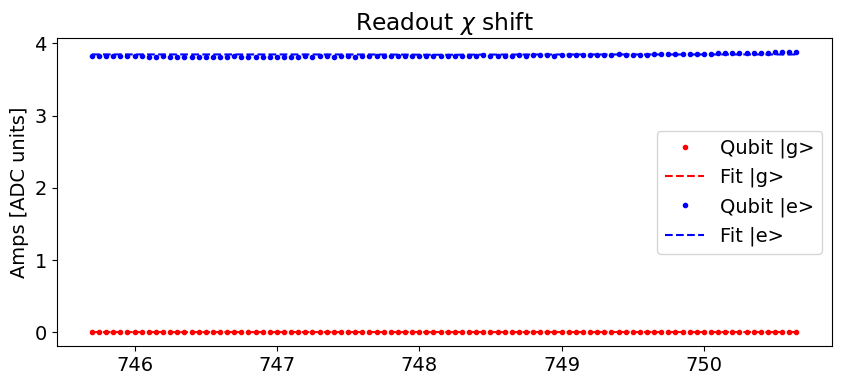

In [ ]:
temp_data1, attrs1 = prev_data(expt_path, '00002_ResonatorSpectroscopy.h5')  # |g>
temp_data2, attrs2 = prev_data(expt_path, '00003_ResonatorSpectroscopy.h5')  # |e>
plot_spectroscopy(temp_data1['xpts'], temp_data1['amps'], e_data=temp_data2['amps'], title="Readout $\chi$ shift", fitparams=[8057.1, None, None, None, None, None, None])

### No cavity drive vs cavity drive

In [44]:
def plot_spectroscopy_sweep(xdata, g_data_list, fitparams=None, legend = [], title="Readout"):
    fitparams=fitparams
    data1 = {}
    plt.figure(figsize=(15,8))
    plt.subplot(111, title=title,  ylabel="Amps [ADC units]", xlabel='Freq (MHz)')
    ax = plt.gca()
    count = 0
    for g_data in g_data_list:
        data1['fit'], data1['fit_err'] = fitter.fithanger(xdata, g_data, fitparams=fitparams)
        f0, Qi, Qe, phi, scale, a0, slope = data1['fit']
        color = next(ax._get_lines.prop_cycler)['color']
    
        plt.plot(xdata, g_data,'.',color = color, label=legend[count])
        plt.plot(xdata, fitter.hangerS21func_sloped(xdata, *data1["fit"]), '-', color = color)
        count +=1
    plt.legend()

[748.02, 5000, 1000, 0, 8.406545361117857, 5.87464727140112, -0.22977481170301853]
[ 7.48223689e+02 -9.52221265e+02  1.27902748e+05  6.47441110e-01
  1.11753422e+03  1.27702385e+01  1.44651805e-01]
[748.02, 5000, 1000, 0, 8.406545361117857, 5.87464727140112, -0.22977481170301853]
[ 7.48312239e+02 -8.14131075e+02  1.00674416e+05  8.81239244e-01
  8.46956638e+02  1.14418334e+01  2.23189498e-01]
[748.02, 5000, 1000, 0, 8.406545361117857, 5.87464727140112, -0.22977481170301853]
[ 7.48327156e+02 -7.86136871e+02  6.75930647e+04  8.71151635e-01
  5.66649671e+02  1.11899191e+01  2.11929587e-01]
[748.02, 5000, 1000, 0, 8.406545361117857, 5.87464727140112, -0.22977481170301853]
[ 7.48459385e+02 -6.95295700e+02  4.03902194e+04  8.85153804e-01
  3.06818060e+02  9.93948331e+00  1.27289211e-01]
[748.02, 5000, 1000, 0, 8.406545361117857, 5.87464727140112, -0.22977481170301853]
[ 7.48428466e+02 -6.96407731e+02  4.67389638e+04  7.47209240e-01
  3.27271399e+02  9.44418334e+00  3.34717364e-02]
[748.02, 5

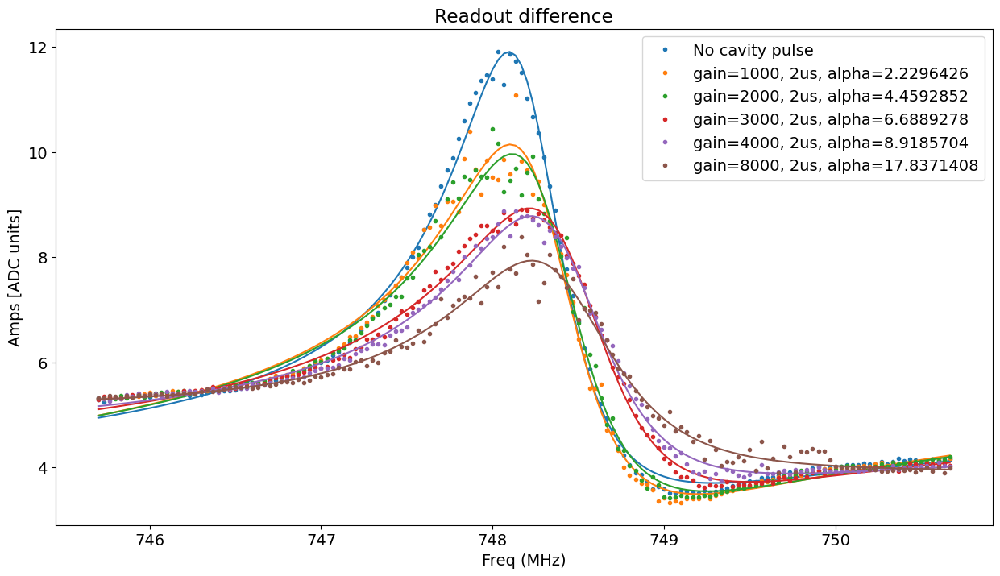

In [54]:
temp_data1, attrs1 = prev_data(expt_path, '00004_ResonatorSpectroscopy.h5')  # 0us, 0
temp_data6, attrs6 = prev_data(expt_path, '00010_ResonatorSpectroscopy.h5')  # 2us, 1000
temp_data2, attrs2 = prev_data(expt_path, '00011_ResonatorSpectroscopy.h5')  # 2us, 2000
temp_data3, attrs3 = prev_data(expt_path, '00012_ResonatorSpectroscopy.h5')  # 2us, 3000
temp_data4, attrs4 = prev_data(expt_path, '00008_ResonatorSpectroscopy.h5')  # 2us, 4000
temp_data5, attrs5 = prev_data(expt_path, '00009_ResonatorSpectroscopy.h5')  # 2us, 8000
g_data_list = [temp_data1['amps'], temp_data6['amps'], temp_data2['amps'], temp_data3['amps'], temp_data4['amps'], temp_data5['amps']]
legend = ['No cavity pulse', 'gain=1000, 2us, alpha=2.2296426', 'gain=2000, 2us, alpha=4.4592852', 'gain=3000, 2us, alpha=6.6889278', 'gain=4000, 2us, alpha=8.9185704', 'gain=8000, 2us, alpha=17.8371408']
plot_spectroscopy_sweep(temp_data1['xpts'], g_data_list, title="Readout difference", legend=legend,fitparams=[748.02, None, None, None, None, None, None])

[748.02, 5000, 1000, 0, 12.336975702851156, 10.132106100626636, -0.3386040615044682]
[ 7.48127673e+02 -4.08320972e+02  5.94575848e+02  1.62292056e+00
  5.75731751e+00  2.17399957e+01  3.63635967e-01]
[748.02, 5000, 1000, 0, 12.336975702851156, 10.132106100626636, -0.3386040615044682]
[ 7.48138536e+02 -4.04487453e+02  5.99863412e+02  1.61645656e+00
  5.79708259e+00  2.11487893e+01  3.59364006e-01]
[748.02, 5000, 1000, 0, 12.336975702851156, 10.132106100626636, -0.3386040615044682]
[ 7.48163980e+02 -3.84439517e+02  5.76909815e+02  1.63081684e+00
  5.63585027e+00  2.04529152e+01  3.55775272e-01]
[748.02, 5000, 1000, 0, 12.336975702851156, 10.132106100626636, -0.3386040615044682]
[ 7.48156656e+02 -3.40914056e+02  4.86185691e+02  1.70662570e+00
  4.49445850e+00  1.97572792e+01  2.99679393e-01]
[748.02, 5000, 1000, 0, 12.336975702851156, 10.132106100626636, -0.3386040615044682]
[ 7.48156040e+02 -3.23738553e+02  4.56731989e+02  1.76919734e+00
  4.49597614e+00  2.01987072e+01  3.58089980e-01]


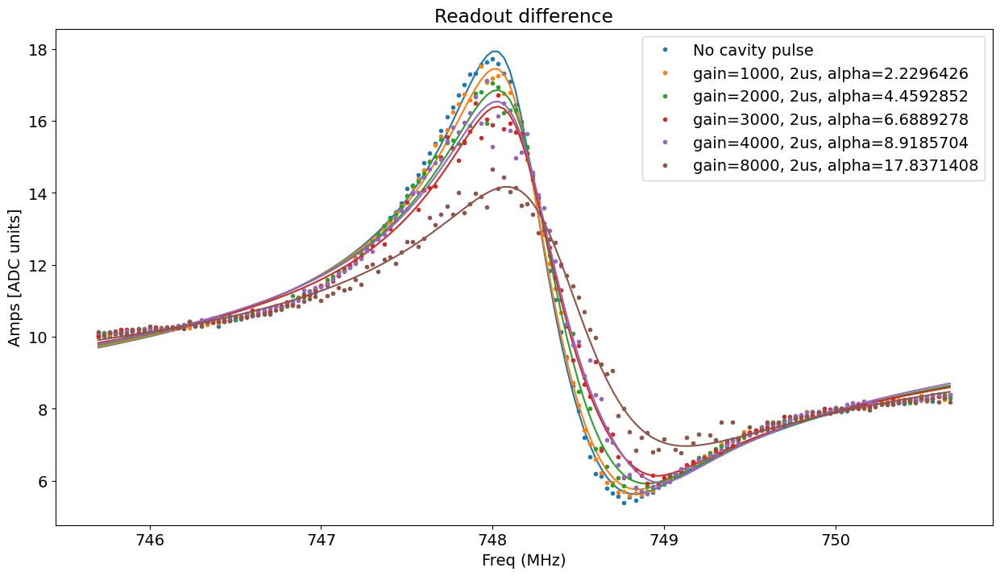

In [55]:
temp_data1, attrs1 = prev_data(expt_path, '00021_ResonatorSpectroscopy.h5')  # 0us, 0
temp_data6, attrs6 = prev_data(expt_path, '00022_ResonatorSpectroscopy.h5')  # 2us, 1000
temp_data2, attrs2 = prev_data(expt_path, '00023_ResonatorSpectroscopy.h5')  # 2us, 2000
temp_data3, attrs3 = prev_data(expt_path, '00024_ResonatorSpectroscopy.h5')  # 2us, 3000
temp_data4, attrs4 = prev_data(expt_path, '00025_ResonatorSpectroscopy.h5')  # 2us, 4000
temp_data5, attrs5 = prev_data(expt_path, '00026_ResonatorSpectroscopy.h5')  # 2us, 8000
g_data_list = [temp_data1['amps'], temp_data6['amps'], temp_data2['amps'], temp_data3['amps'], temp_data4['amps'], temp_data5['amps']]
legend = ['No cavity pulse', 'gain=1000, 2us, alpha=2.2296426', 'gain=2000, 2us, alpha=4.4592852', 'gain=3000, 2us, alpha=6.6889278', 'gain=4000, 2us, alpha=8.9185704', 'gain=8000, 2us, alpha=17.8371408']
plot_spectroscopy_sweep(temp_data1['xpts'], g_data_list, title="Readout difference", legend=legend,fitparams=[748.02, None, None, None, None, None, None])

## Qubit ge Spectroscopy

Found peak in amps at [MHz] 3567.4339704667245, HWHM 0.08503812858637885
Found peak in I at [MHz] 3567.433820782252, HWHM 0.09455427928337971
Found peak in Q at [MHz] 3567.4327724048126, HWHM 0.09868449035521677


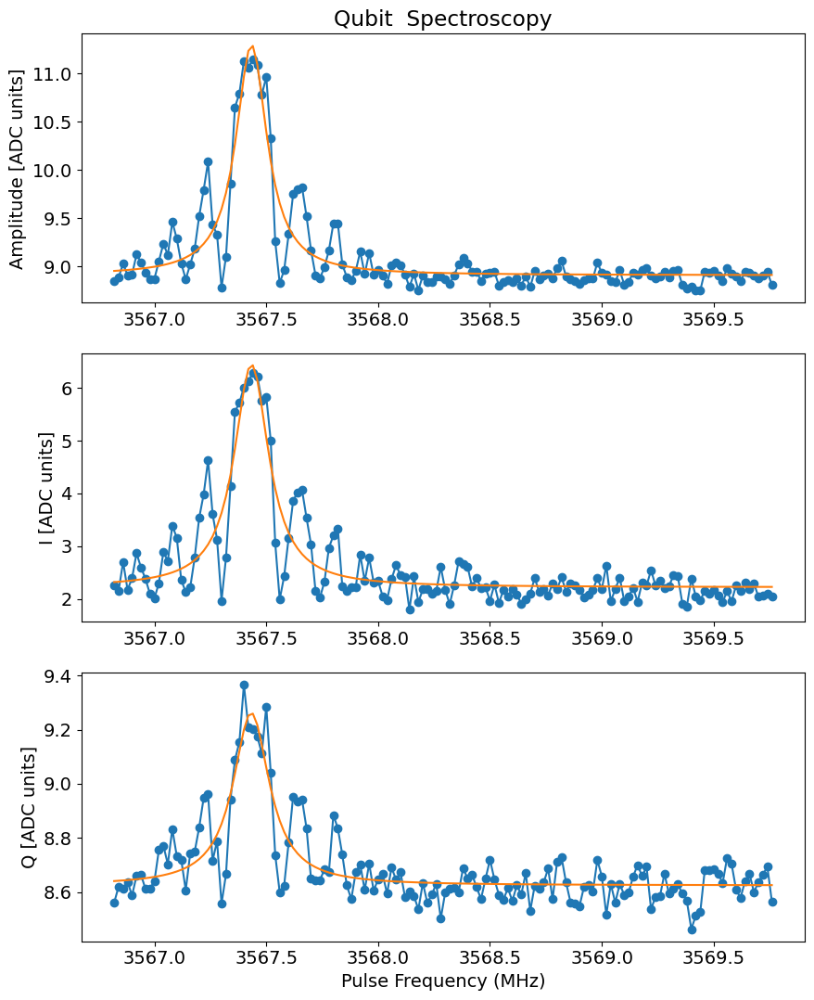

In [11]:
temp_data, attr = prev_data(expt_path, '00000_PulseProbeSpectroscopyExperiment.h5')  # |g>
plot_pulse_spectroscopy(data = temp_data)

In [58]:
attr.keys()

dict_keys(['config'])

## Qubit ef Spectroscopy

Found peak in amps at [MHz] 3424.603713457155, HWHM 0.048149716918140226
Found peak in I at [MHz] 3424.6028057495373, HWHM -0.04351277563203341
Found peak in Q at [MHz] 3424.6038705805704, HWHM 0.04325806193853659


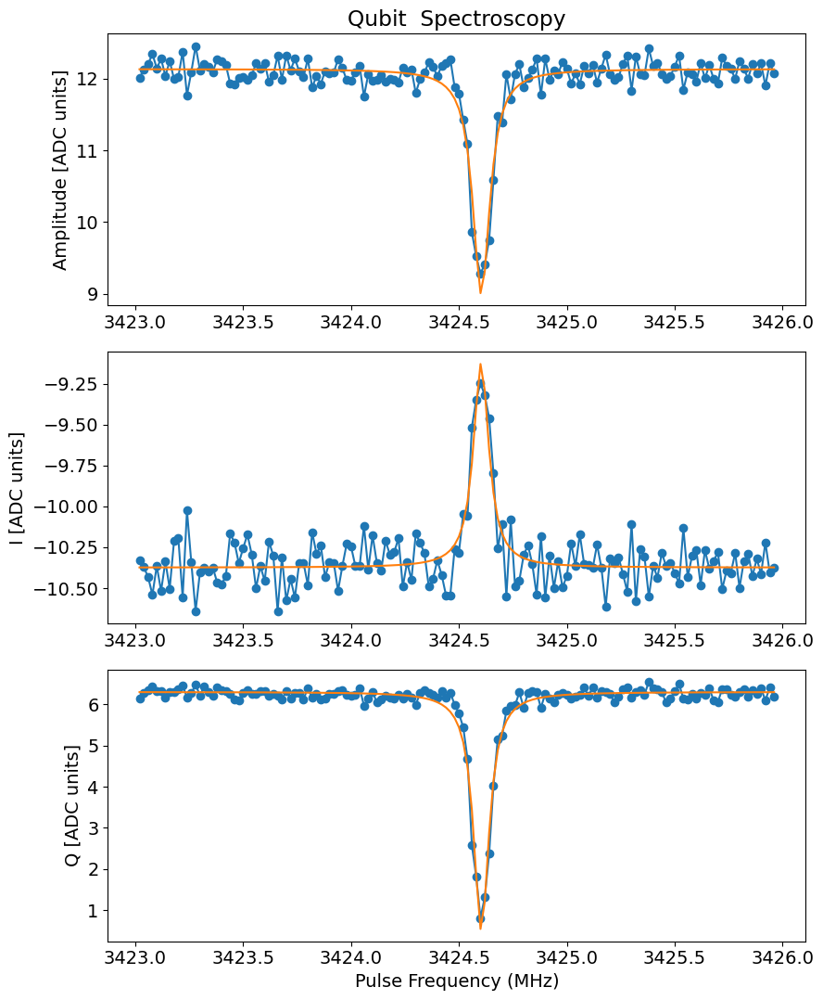

In [13]:
temp_data, attr = prev_data(expt_path, '00000_PulseProbeEFSpectroscopyExperiment.h5')  # |g>
plot_pulse_spectroscopy(data = temp_data)

## 

## Cavity Spectroscopy

### Manipulate 1

[4984.221633004797, 1000, 4000, 0, 0.1080462953205612, 2.806261592326667, -0.00800712582978571]
[ 4.98424057e+03  4.21251442e+04  4.67388090e+06 -1.31116927e-01
  9.73257825e+00  2.72700739e+00 -4.69490096e-03]
f0 at |g>: 4984.240570131904


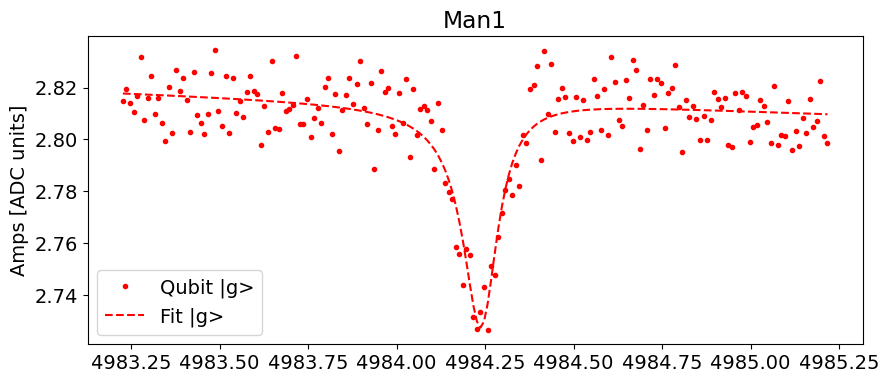

In [18]:
temp_data1, attrs1 = prev_data(expt_path, '00033_CavitySpectroscopyExperiment.h5')  # |g>
plot_spectroscopy(temp_data1['xpts'], temp_data1['amps'], e_data=None, title="Man1", fitparams=[None, 1000,4000, None, None, None, None])#,e_separation=105)

### Storage 4

[6040.495, 5000, 1000, 0, 0.1389943953518008, 1.0077662555132887, -0.003164852789113246]
[ 6.03944810e+03  5.62395358e+04  6.14967348e+06 -4.93206742e-01
  1.33438418e+01  8.91614539e-01 -1.69140834e-03]
f0 at |g>: 6039.448100933961


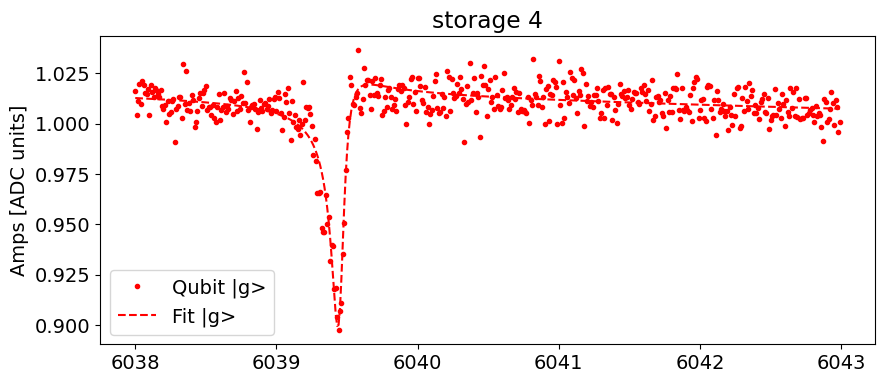

In [237]:
temp_data1, attr = prev_data(expt_path, '00028_CavitySpectroscopyExperiment.h5')  # |g>
plot_spectroscopy(temp_data1['xpts'], temp_data1['amps'], e_data=None, title="storage 4", fitparams=[None, None,None, None, None, None, None])#,e_separation=105)

[6040.49, 5000, 5000, 0, 0.11535878608847361, 1.0227380467566782, -0.0006516673682048568]
f0 at |g>: 6040.49


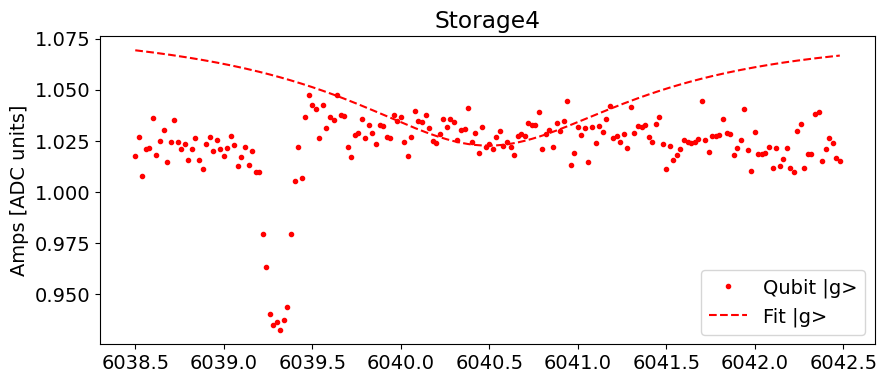

In [24]:
temp_data1, attrs1 = prev_data(expt_path, '00000_dc_flux_sweep.h5')  # |g>
plot_spectroscopy(temp_data1['xpts'], temp_data1['amps'], e_data=None, title="Storage4", fitparams=[None, 5000, 5000, None, None, None, None])#,e_separation=105)

[6039.489999999999, 5000, 5000, 0, 0.1202580685017024, 1.021705355070866, 0.0032803952727454553]
[ 6.03983253e+03  5.03925541e+04  6.45225443e+06 -2.51304055e-01
  1.45290943e+01  9.19101573e-01 -1.42526350e-03]
f0 at |g>: 6039.832528948048


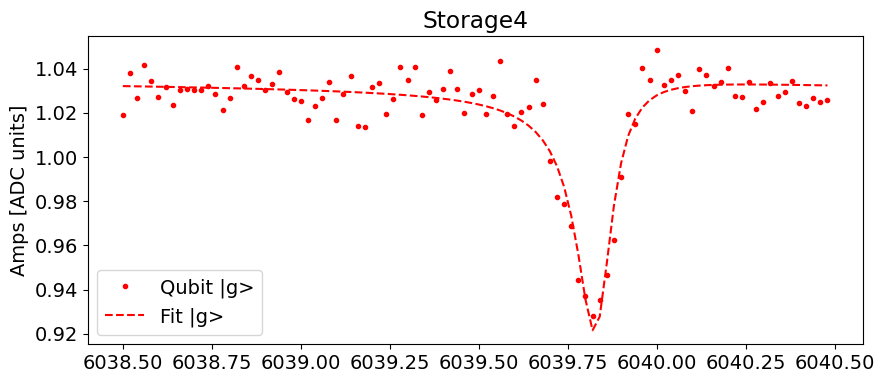

In [22]:
temp_data1, attrs1 = prev_data(expt_path, '00002_CavitySpectroscopyExperiment.h5')  # |g>
plot_spectroscopy(temp_data1['xpts'], temp_data1['amps'], e_data=None, title="Storage4", fitparams=[None, 5000, 5000, None, None, None, None])#,e_separation=105)

[3577.5, 5000, 1000, 0, 1.3803698576122905, 19.923122333681896, 0.15416544518994313]
Attempted to init fitparam 0 to 3577.5, which is out of bounds 3566.6776654770024 to 3567.674332143669. Instead init to 3567.175998810336
[ 3.56719192e+03  4.99623769e+04  4.98433805e+06 -2.70203273e-01
  1.16227973e+02  1.88943607e+01  2.62594386e-01]
f0 at |g>: 3567.191916623507
[3567.175998810336, 5000, 1000, 0, 1.3803698576122905, 19.923122333681896, 0.15416544518994313]
Attempted to init fitparam 0 to 3567.175998810336, which is out of bounds 3566.6776654770024 to 3567.024332143669. Instead init to 3566.850998810336
[3.56691337e+03 3.98854436e+04 4.41278213e+06 2.14454125e-01
 1.08446215e+02 1.92473196e+01 8.50898575e-01]
f0 at |e>: 3566.9133718335574
[3566.850998810336, 5000, 1000, 0, 1.3803698576122905, 19.923122333681896, 0.15416544518994313]
Attempted to init fitparam 0 to 3566.850998810336, which is out of bounds 3567.0276654770023 to 3567.6709988103357. Instead init to 3567.349332143669
[ 3.

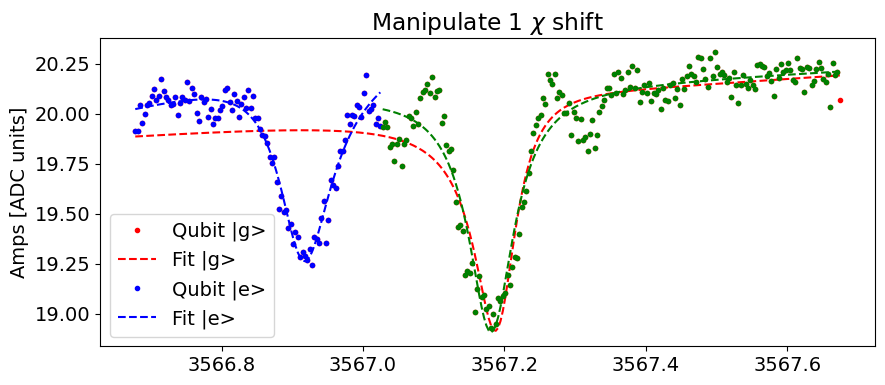

In [203]:
temp_data1, attrs1 = prev_data(expt_path, '00025_qubit_spectroscopy_qubit0.h5')  # |g>
temp_data2, attrs2 = prev_data(expt_path, '00025_qubit_spectroscopy_qubit0.h5')  # |e>
plot_spectroscopy1(temp_data1['xpts'], temp_data1['amps'], e_data=temp_data2['amps'], title="Manipulate 1 $\chi$ shift", fitparams=[3577.5, None, None, None, None, None, None],e_separation=105)

## Pulse Cavity Probe Qubit

### Manipulate 1

Found peak in amps at [MHz] 3568.908477874644, HWHM 0.038811516370887304
Found peak in I at [MHz] 3568.9078582021357, HWHM 0.044479822565523394
Found peak in Q at [MHz] 3568.908264832962, HWHM 0.04585300382465852


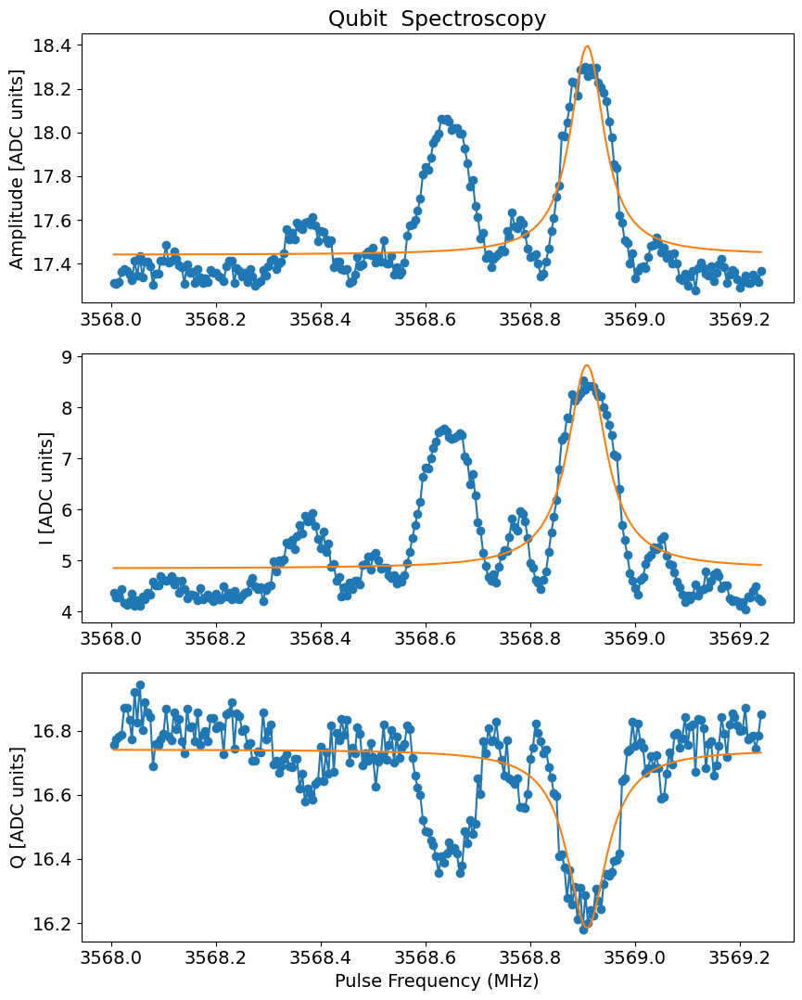

In [224]:
temp_data, attr = prev_data(expt_path, '00013_PulseProbeSpectroscopyExperiment.h5')  # |g>
plot_pulse_spectroscopy(data = temp_data)


[3568, 5000, 1000, 0, 4.489513495934957, 5.254065893983739, 0.13548411532309237]
Attempted to init fitparam 0 to 3568, which is out of bounds 3568.0 to 3569.245. Instead init to 3568.6225
[ 3.56857464e+03  1.78040578e+03 -8.85541871e-01 -2.94155799e-02
  1.14669691e+00  5.17882876e+00  8.55768811e-01]
f0 at |g>: 3568.5746407991073
[3568.6225, 5000, 1000, 0, 4.489513495934957, 5.254065893983739, 0.13548411532309237]
[ 3.56865738e+03  4.11082245e+04  6.28011832e+06 -3.47472764e+00
  5.10379696e+02  1.28457288e+00  4.88106889e-01]
f0 at |e>: 3568.6573781935836
[3568.6225, 5000, 1000, 0, 4.489513495934957, 5.254065893983739, 0.13548411532309237]
Attempted to init fitparam 0 to 3568.6225, which is out of bounds 3568.735 to 3569.24. Instead init to 3568.9875
[ 3.56891291e+03  3.61920471e+04  5.41620457e+06  3.08785436e+00
  6.61137260e+02  4.55907024e-02 -7.09985146e-01]
f0 at |e>: 3568.9129138571784


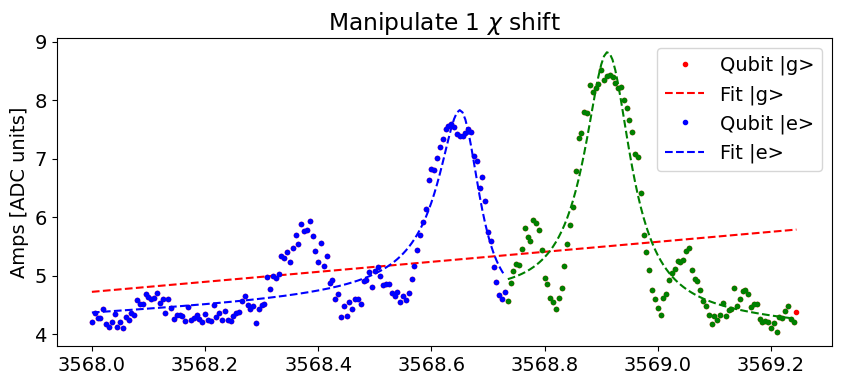

In [233]:
temp_data, attr = prev_data(expt_path, '00013_PulseProbeSpectroscopyExperiment.h5')  # |g>

plot_spectroscopy1(temp_data['xpts'], temp_data['avgi'], e_data=temp_data['avgi'], title="Manipulate 1 $\chi$ shift", fitparams=[3568, None, None, None, None, None, None],e_separation=147)

In [235]:
chi_shift = 3568.9129138571784 - 3568.6573781935836
chi_shift

0.2555356635948556

In [170]:
temp_data.keys()

dict_keys(['amps', 'avgi', 'avgq', 'phases', 'xpts', 'fit_amps', 'fit_err_amps', 'fit_avgi', 'fit_err_avgi', 'fit_avgq', 'fit_err_avgq'])

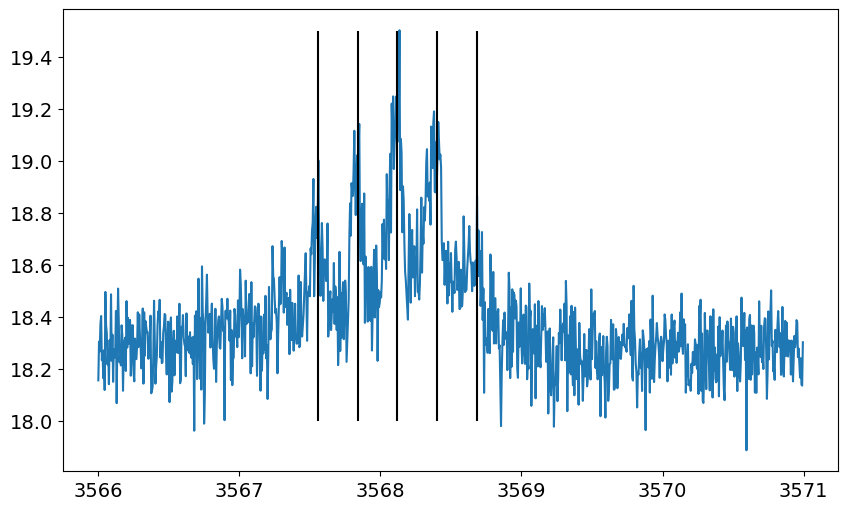

In [195]:
#vlines = [3568.12, 3568.37]
center = 3568.12
chi = 0.281
vlines = [center + factor * chi for factor in np.arange(-2, 3, 1)]

plt.plot(temp_data['xpts'],temp_data['amps'])
plt.vlines(vlines, 18, 19.5 , color = 'black')


### Storage 4

## Length Rabi

auto pi_len: 0.11458
auto pi/2_len: 0.08404
pi len: 0.05350 or 0.11458 or -0.00759 or 0.17566
pi/2 len: 0.02295 or 0.08404
Oscillation rate is: 8.185514838157046 MHz
Oscillation amp is: -1.7257570565261635
Decay Time: 32.28788699213766 us


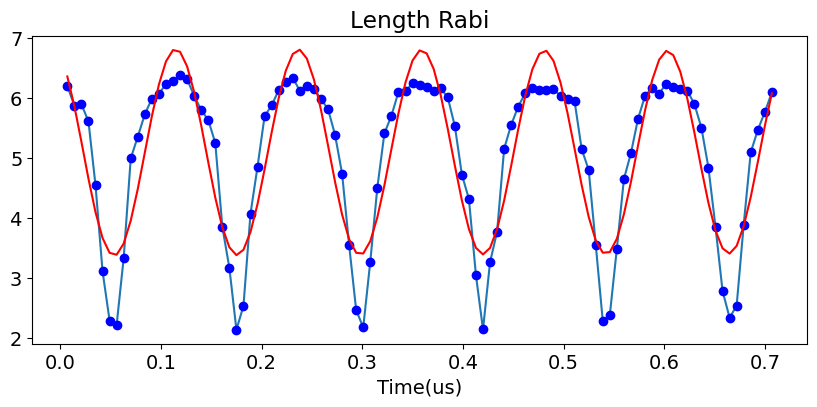

In [26]:
temp_data, attrs = prev_data(expt_path, '00004_LengthRabiGeneralExperiment.h5')  # ge
# temp_data, attrs = prev_data(expt_path, '00002_length_rabiEF_qubit0.h5')  # ef
signal_y = temp_data['avgi']
len_x = temp_data['xpts']
plot_length_rabi(len_x, signal_y, pi_length=0.1, t1=1, vlines=None, hlines=None)

Extracted data and attrs ['config']
auto pi_len: 0.00081
auto pi/2_len: -0.01194
pi len: 0.02630 or 0.05179 or 0.00081 or 0.07728
pi/2 len: 0.01355 or 0.03904
Oscillation rate is: 19.615581809514502 MHz
Oscillation amp is: 0.2767190468413128
Decay Time: 0.47977634678576137 us


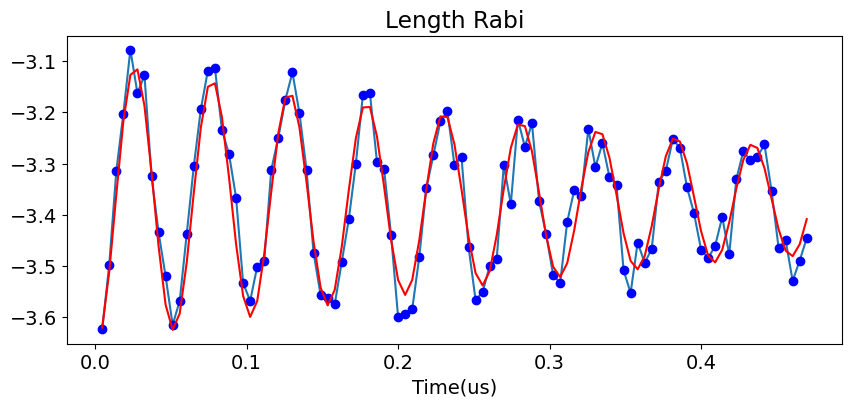

In [68]:
# temp_data, attrs = prev_data(expt_path, '00001_length_rabi_qubit0.h5')  # ge
temp_data, attrs = prev_data(expt_path, '00002_length_rabiEF_qubit0.h5')  # ef
signal_y = temp_data['avgi']
len_x = temp_data['xpts']
plot_length_rabi(len_x, signal_y, pi_length=0.025, t1=1, vlines=None, hlines=None)

Extracted data and attrs ['config']
auto pi_len: 0.61743
auto pi/2_len: 0.46078
pi len: -0.00917 or 0.30413 or -0.32247 or 0.61743
pi/2 len: -0.16582 or 0.14748
Oscillation rate is: 1.595913943509344 MHz
Oscillation amp is: 0.13142937715453604
Decay Time: 1.6574529261857955 us


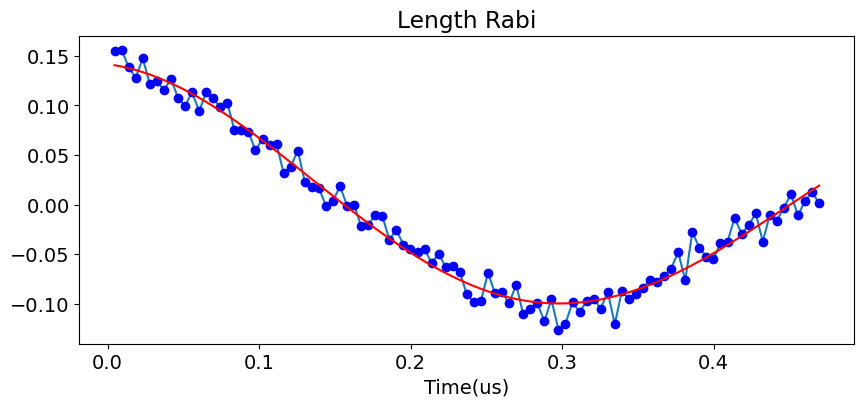

In [35]:
# temp_data, attrs = prev_data(expt_path, '00001_length_rabi_qubit0.h5')  # ge
temp_data, attrs = prev_data(expt_path, '00004_length_rabiEF_qubit0.h5')  # ef
signal_y = temp_data['avgq']
len_x = temp_data['xpts']
plot_length_rabi(len_x, signal_y, pi_length=0.02, t1=1, vlines=None, hlines=None)

In [42]:
attrs['config']['expt']

{'start': 0.004650297619047619,
 'step': 0.004650297619047619,
 'expts': 101,
 'reps': 20000,
 'gain': 3000,
 'pulse_type': 'gauss',
 'pulse_ge': False,
 'checkZZ': False,
 'checkEF': True,
 'qubits': [0],
 'length_placeholder': 0.46968005952380953}

## Length Rabi Sweep

### g-e

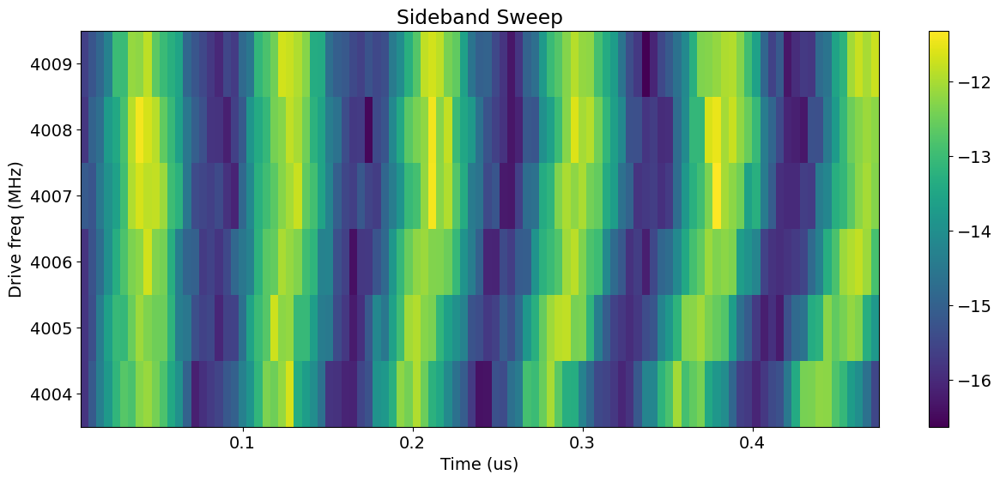

In [54]:
file_list = np.arange(0,6,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

### e-f

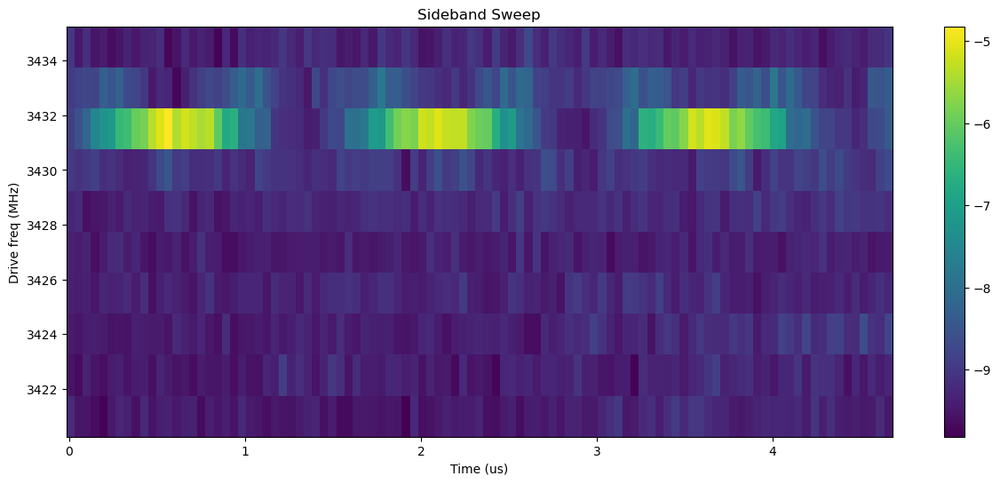

In [11]:
file_list = np.arange(0,10,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgq']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

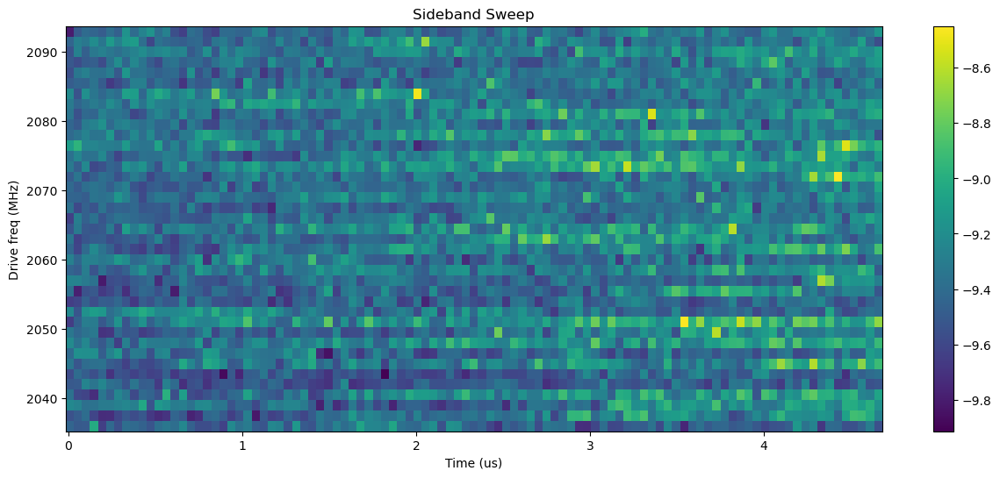

In [14]:
file_list = np.arange(52,91,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgq']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

## f0-g1 manipulate1 swap

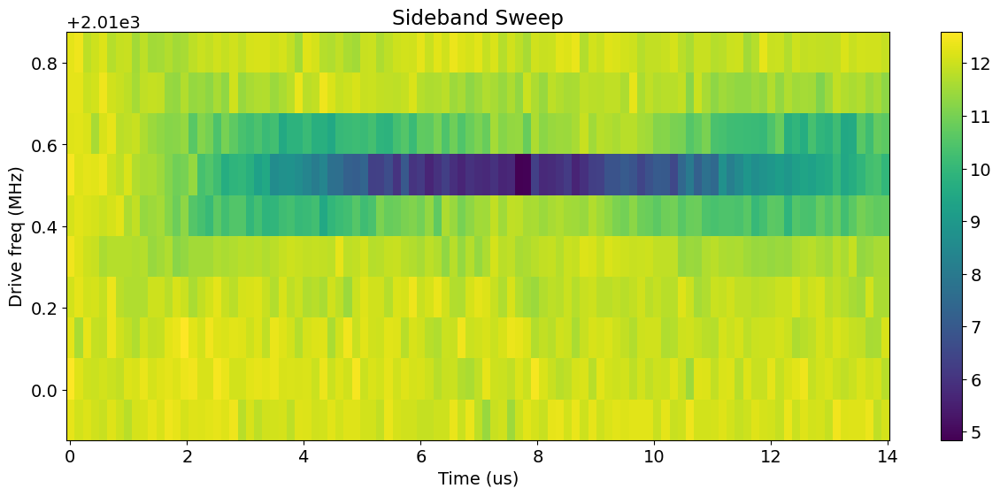

In [10]:
file_list = np.arange(0,10,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

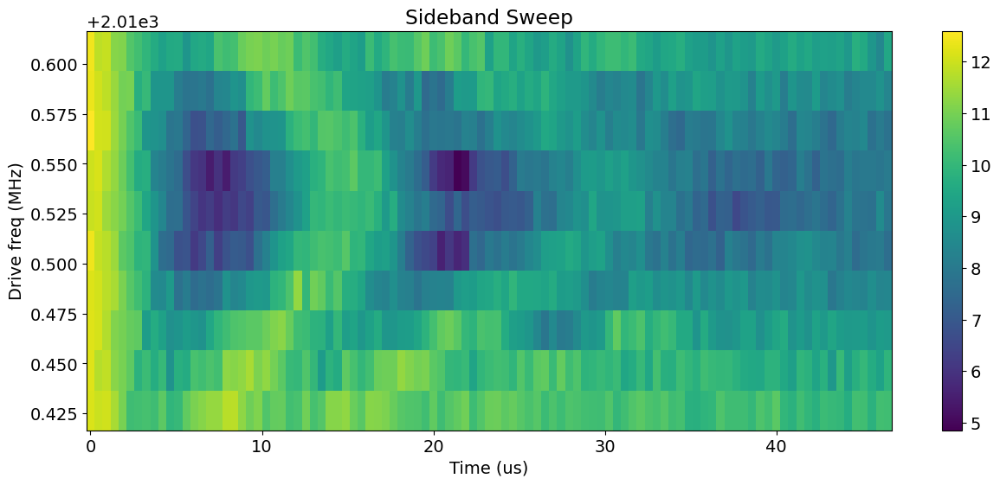

In [11]:
file_list = np.arange(10,20,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

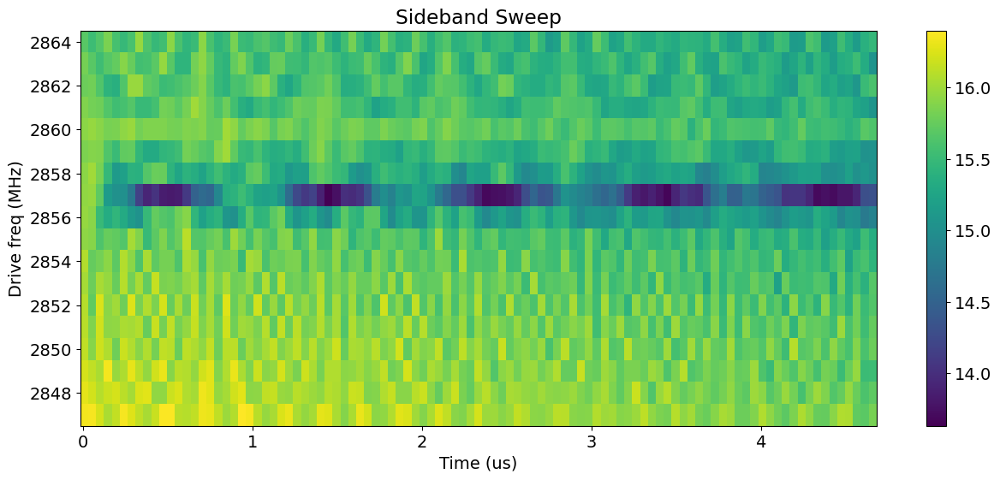

In [65]:
file_list = np.arange(346,364,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

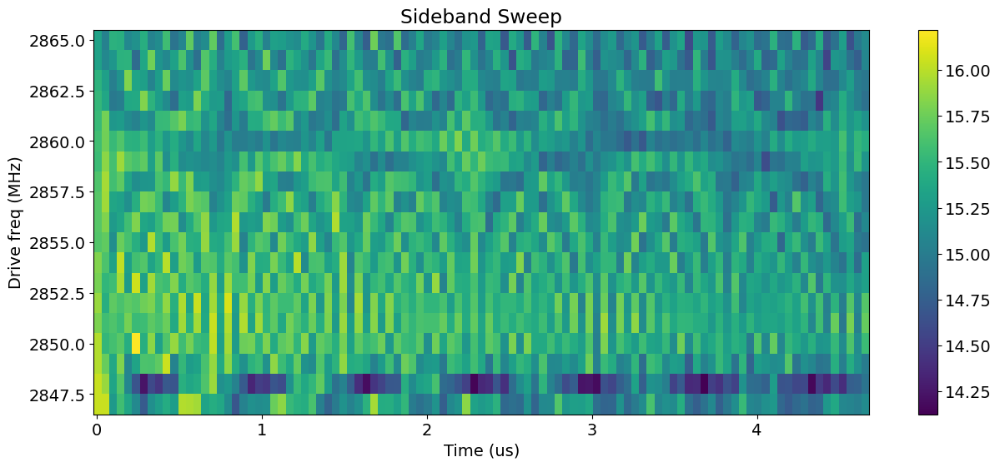

In [55]:
file_list = np.arange(277,296,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

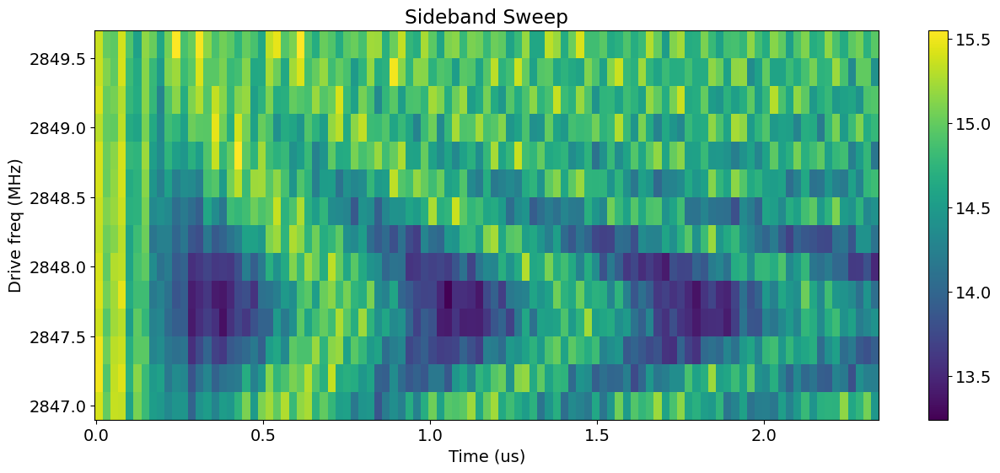

In [56]:
file_list = np.arange(297,311,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

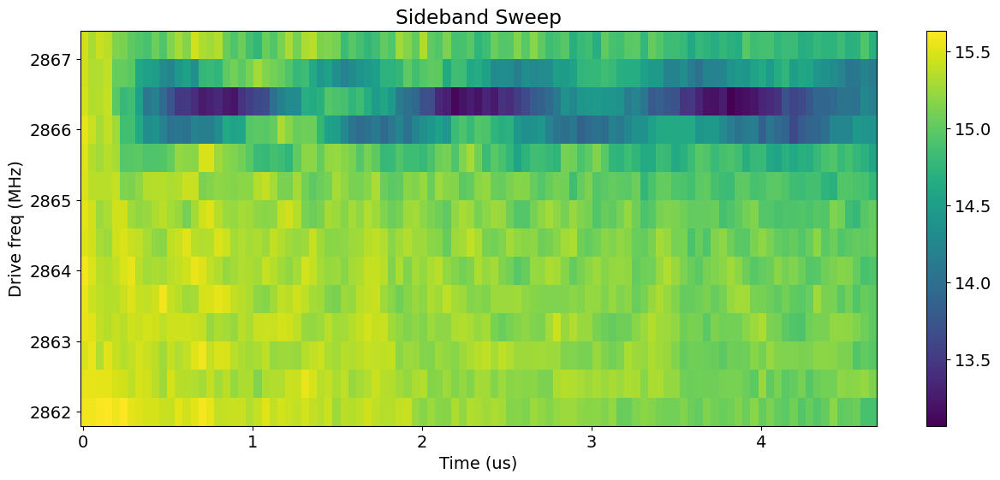

In [59]:
file_list = np.arange(312,326,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

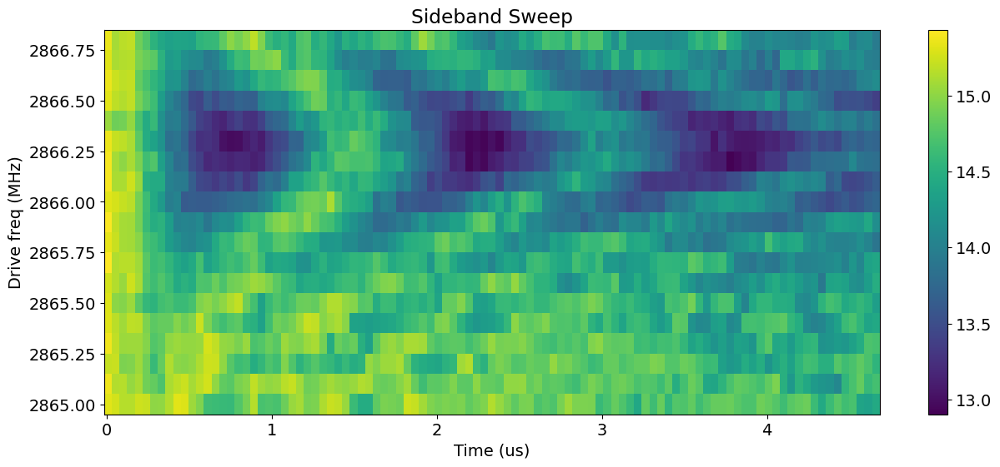

In [44]:
file_list = np.arange(162,181,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

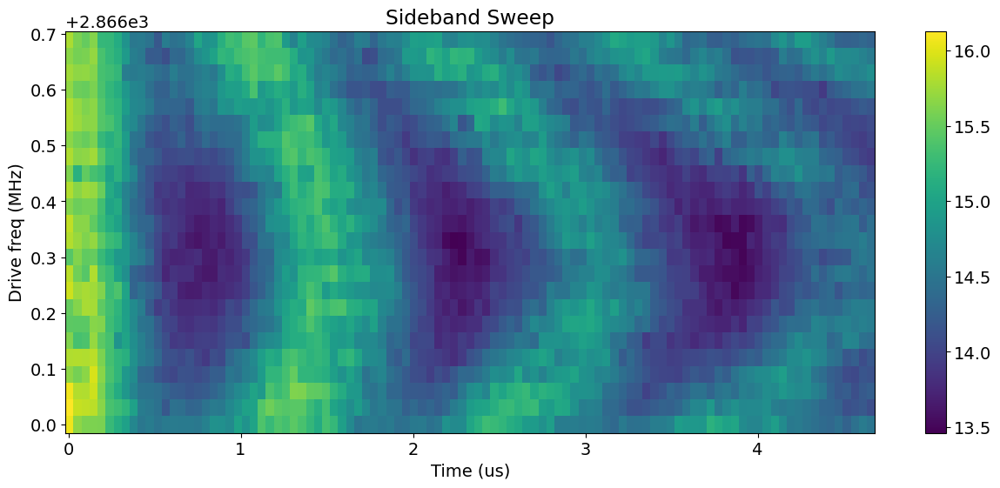

In [49]:
file_list = np.arange(182,206,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

### Repeating analysis with Jan 9 data

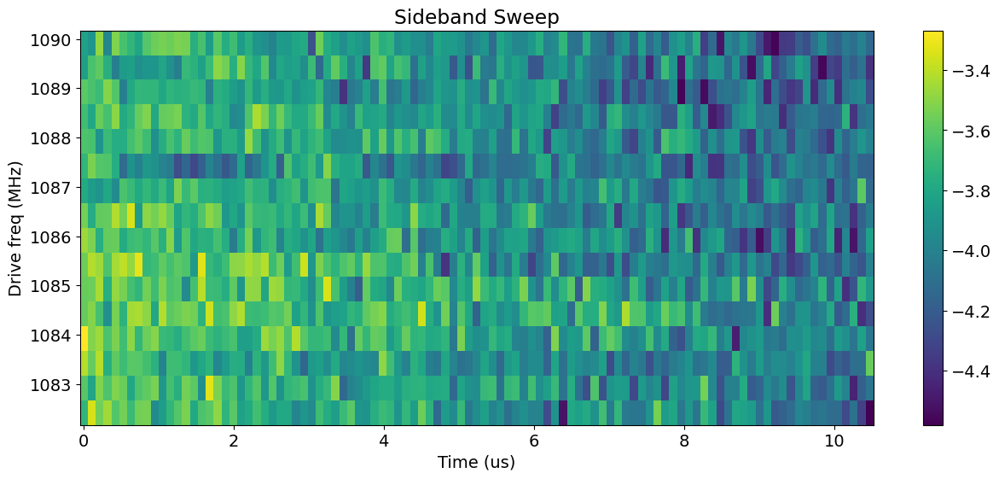

In [140]:
file_list = np.arange(0,16,1)
y_list = []
freq_list = []
name = '_240109_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")

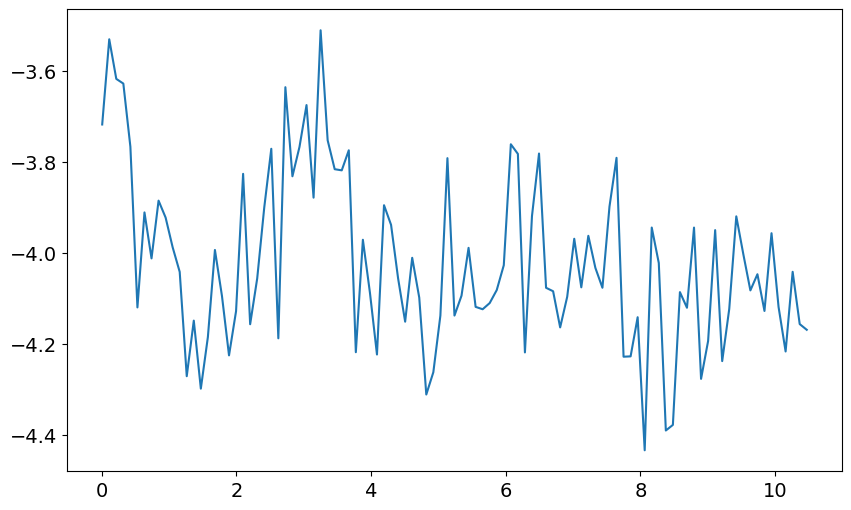

In [138]:
plt.plot(len_x, y_list[10])

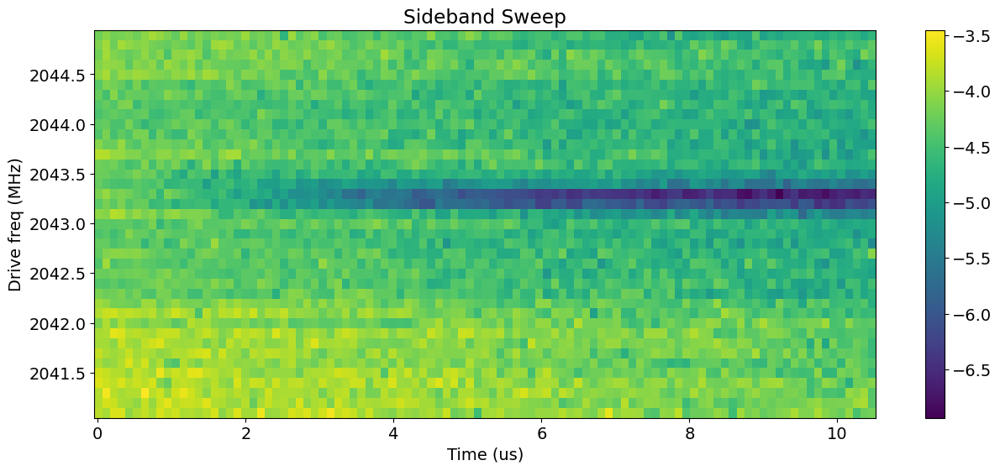

In [141]:
file_list = np.arange(38,77,1)
y_list = []
freq_list = []
name = '_240109_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")

## f0-g1 manipulate2 swap

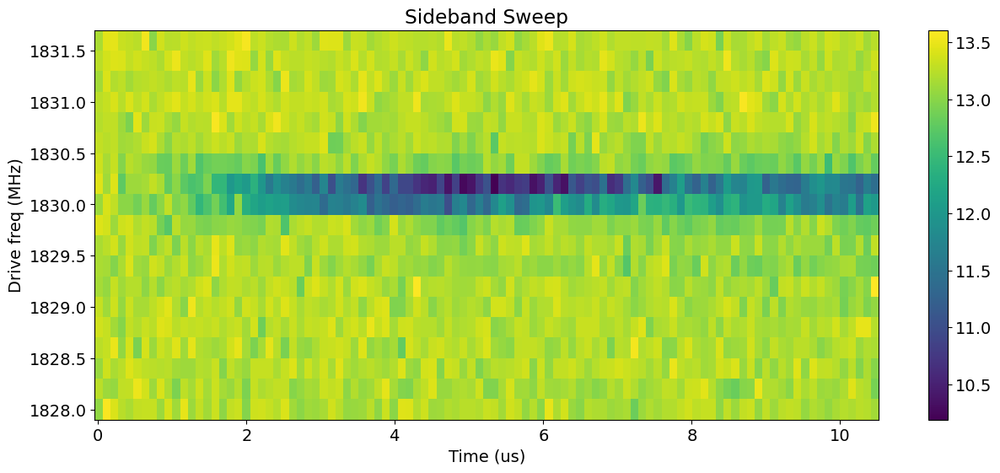

In [36]:
file_list = np.arange(140,159,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

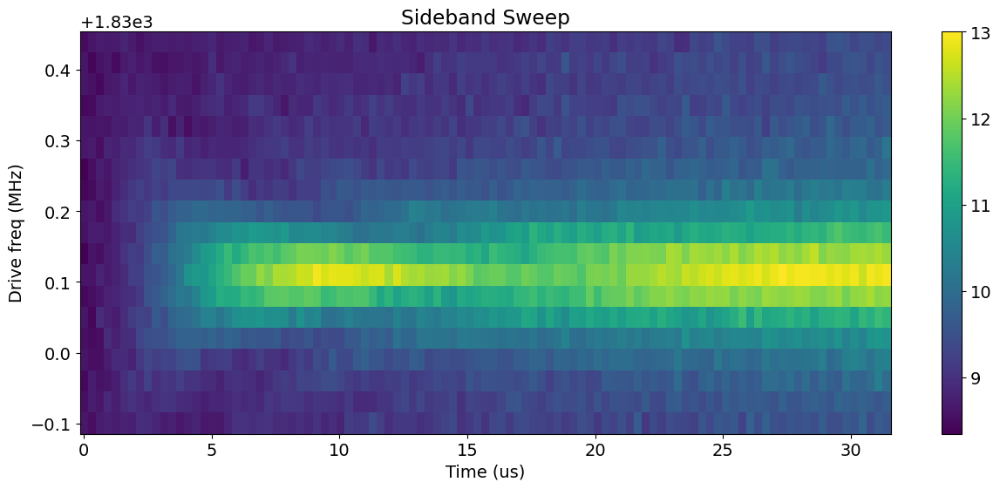

In [38]:
file_list = np.arange(160,179,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgq']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

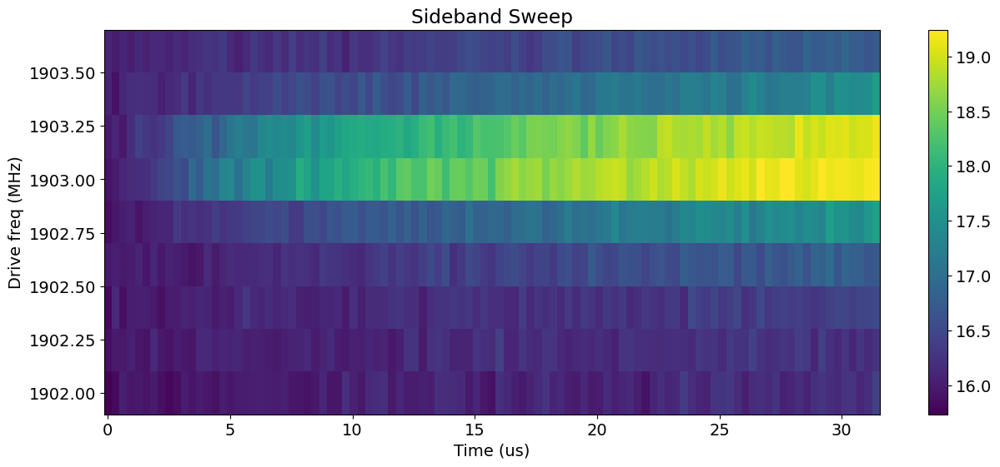

In [44]:
file_list = np.arange(180,189,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgq']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

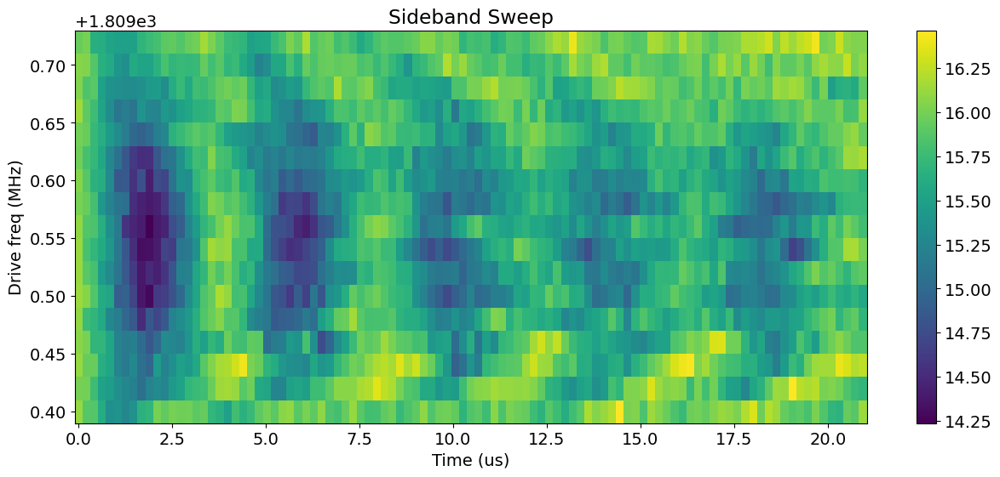

In [55]:
file_list = np.arange(229,246,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgq']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

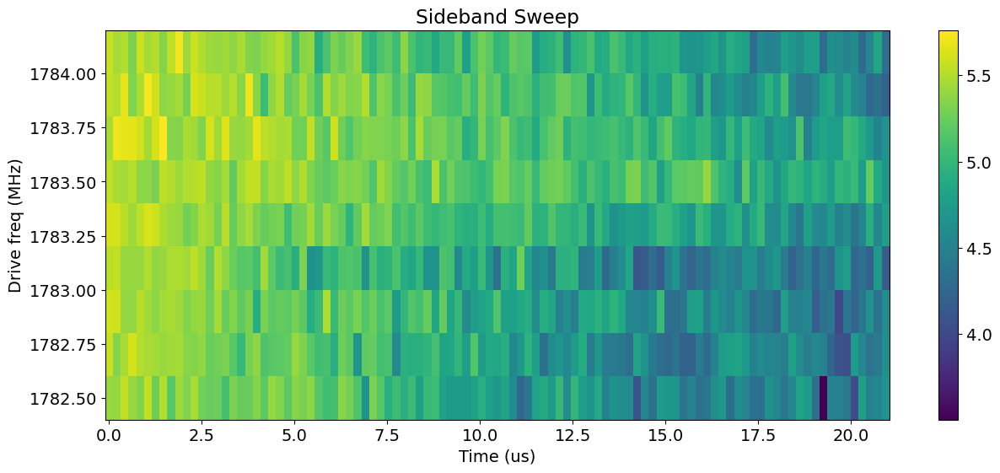

In [57]:
file_list = np.arange(249,258,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

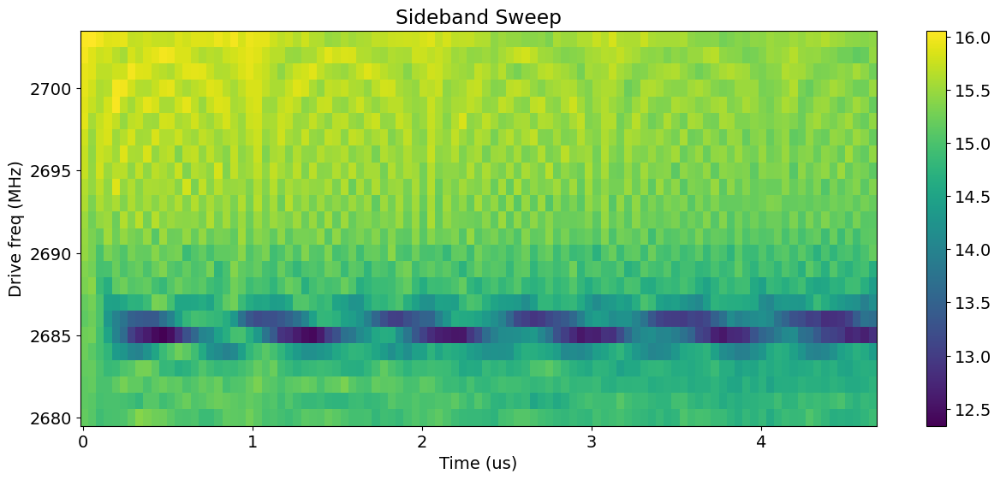

In [51]:
file_list = np.arange(232,256,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="Sideband Sweep")
    

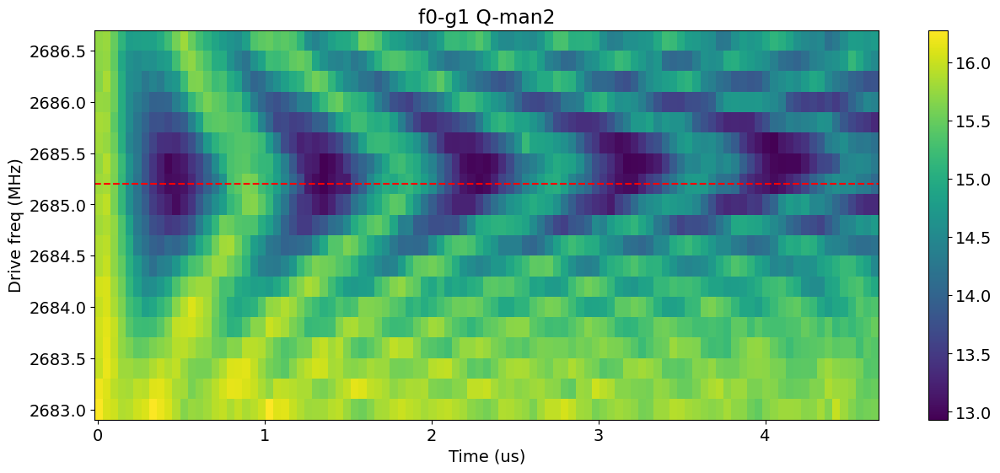

In [58]:
file_list = np.arange(257,276,1)
y_list = []
freq_list = []
name = '_length_rabi_qubit_general_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['freq'])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=[2685.2], vlines=None, title="f0-g1 Q-man2")
    

## Amplitude Rabi

auto pi_len: 7609.54
auto pi/2_len: 3521.79
pi len: -8741.46 or -16916.96 or -565.96 or -25092.46
pi/2 len: -4653.71 or -12829.21
Oscillation amp is: 0.8003566595594831


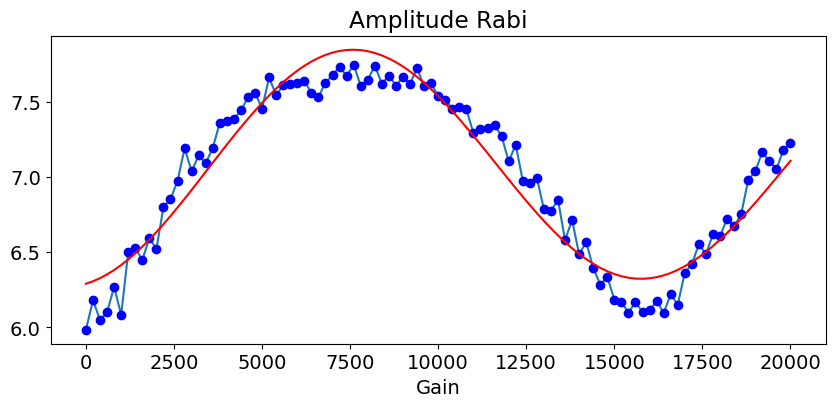

In [32]:
temp_data, attrs = prev_data(expt_path, '00006_AmplitudeRabiExperiment.h5')  # ge
# temp_data, attrs = prev_data(expt_path, '00007_amp_rabi_EF_qubit0.h5')  # ef
signal_y = temp_data['avgi']
amp_x = temp_data['xpts']
plot_amp_rabi(amp_x, signal_y, pi_length=2000, t1=1000, vlines=None, hlines=None)

## Amplitude EF Rabi

auto pi_len: 5969.62
auto pi/2_len: 2820.25
pi len: -6627.87 or -12926.62 or -329.13 or -19225.37
pi/2 len: -3478.50 or -9777.25
Oscillation amp is: 3.6761044081442864


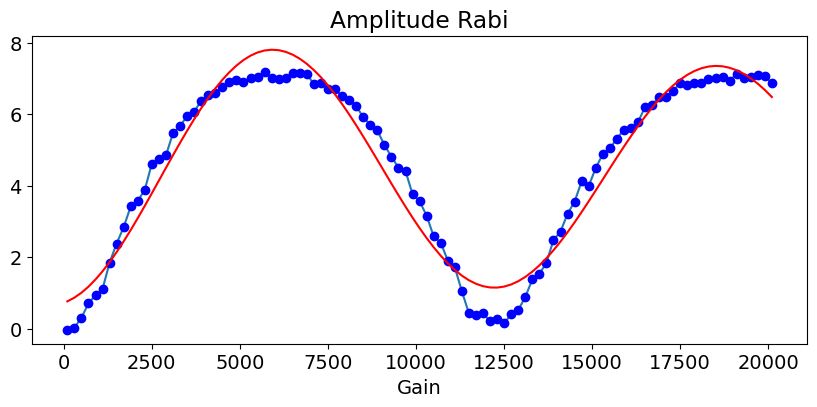

In [36]:
# temp_data, attrs = prev_data(expt_path, '00002_amp_rabi_qubit0.h5')  # ge
temp_data, attrs = prev_data(expt_path, '00003_AmplitudeRabiEFExperiment.h5')  # ef
signal_y = temp_data['avgq']
amp_x = temp_data['xpts']
plot_amp_rabi(amp_x, signal_y, pi_length=2000, t1=1000, vlines=None, hlines=None)

### Qubit temperature

Run length rabi EF twice, once with and once without pulse_ge. Input the amplitude of the rabi oscillation (printed in the cell below) for each of these cases to calculate qubit temperature from the ratio.

In [13]:
# NATRUAL CONSTANTS
h = 6.62607015e-34
fge = 1e6*(attrs['config']['device']['qubit']['f_ge'][0])
kB = 1.380649e-23
################

# print(amprabiEF.data.keys())
# amps = amprabiEF.data['amps']

# print(np.max(amps) - np.min(amps))
efamp_normal = 2.729450970902014
efamp_nopulse = 0.04

print('Qubit temp [mK]:', 1e3*-h*fge/(kB*np.log(efamp_nopulse/efamp_normal)))


Qubit temp [mK]: 40.64328988401333


### plot cavity temperature

Oscillation amp1 is: 3.8377660759416226
Oscillation amp2 is: -0.056798202379165885


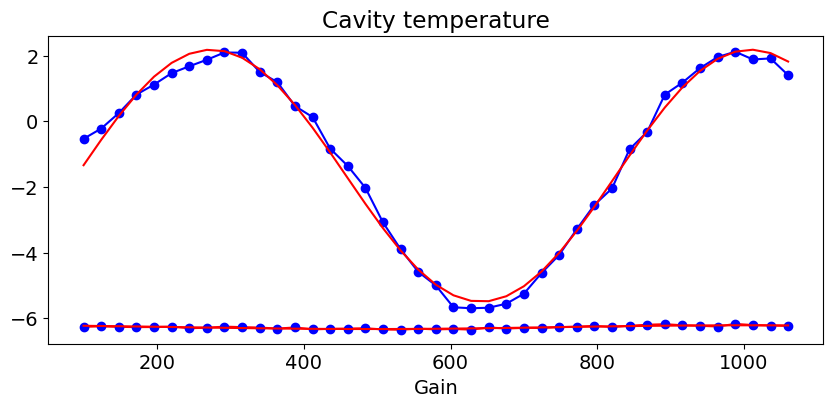

In [19]:
temp_data1, attrs = prev_data(expt_path, '00001_amp_rabi_qubit.h5')  # ge
temp_data2, attrs = prev_data(expt_path, '00002_amp_rabi_qubit.h5')  # ef
signal_y1 = temp_data1['avgi']
signal_y2 = temp_data2['avgi']
amp_x = temp_data1['xpts']
plot_cavity_temp(amp_x, signal_y1, signal_y2, pi_length=2000, t1=1000, vlines=None, hlines=None)

In [20]:
# NATRUAL CONSTANTS
h = 6.62607015e-34
fge = 1e6*(attrs['config']['device']['manipulate']['f_ge'][0])
kB = 1.380649e-23
################

# print(amprabiEF.data.keys())
# amps = amprabiEF.data['amps']

# print(np.max(amps) - np.min(amps))
efamp_normal = 3.8377660759416226
efamp_nopulse = 0.056798202379165885

print('Qubit temp [mK]:', 1e3*-h*fge/(kB*np.log(efamp_nopulse/efamp_normal)))


Qubit temp [mK]: 56.9703865810387


In [24]:
# NATRUAL CONSTANTS
h = 6.62607015e-34
fge = 1e6*(attrs['config']['device']['manipulate']['f_ge'][0])
kB = 1.380649e-23
################

# print(amprabiEF.data.keys())
# amps = amprabiEF.data['amps']

# print(np.max(amps) - np.min(amps))
efamp_normal = np.sqrt(111326.56073536808)
efamp_nopulse = np.sqrt(72.56564236258497)

# efamp_normal = 2.89
# efamp_nopulse = 0.37

print('Qubit temp [mK]:', 1e3*-h*fge/(kB*np.log(efamp_nopulse/efamp_normal)))


Qubit temp [mK]: 65.43976464773726


## T1

Decay Time: 502.70983157901435 us


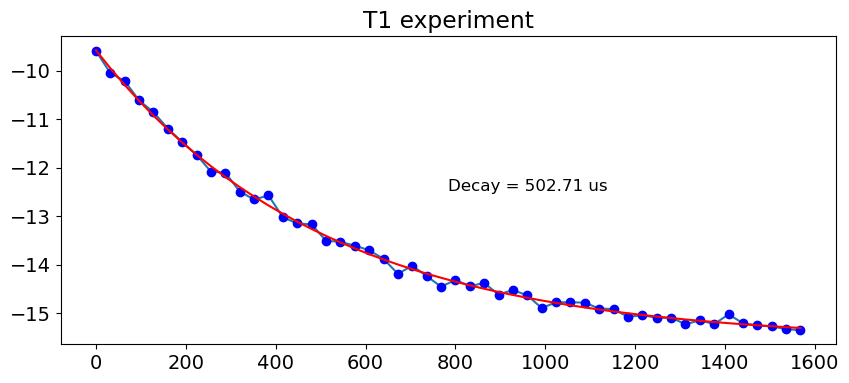

In [10]:
temp_data, attrs = prev_data(expt_path, '00000_t1_qubit0.h5')
y_data = temp_data['avgi']
x_time = temp_data['xpts']
plot_t1(x_time, y_data,T1guess=1000)

## Cavity T1

### Manipulate 1

Decay Time: 57.231615849102184 us


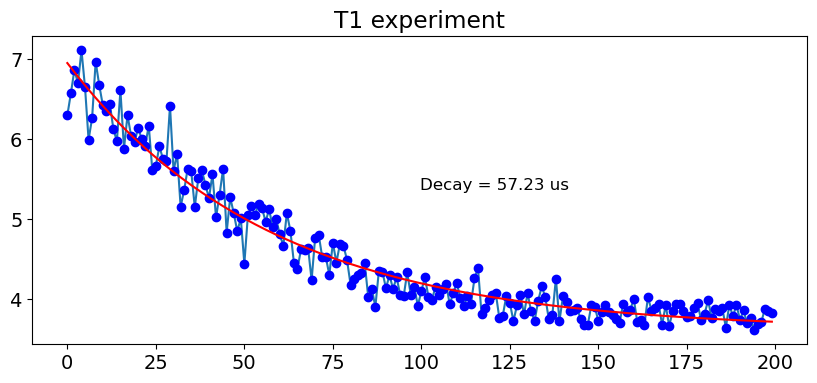

In [241]:
temp_data, attrs = prev_data(expt_path, '00002_T1CavityExperiment.h5')
y_data = temp_data['avgi']
x_time = temp_data['xpts']
plot_t1(x_time, y_data,T1guess=1000)

## Ramsey

[  2.09778935   0.2002569   84.36653474 150.90773884  -3.36998454]
====qubit information====
original qubit frequency:3577.580206837837 MHz
Ramsey frequency:0.2
Dephasing Time: 150.90773884146668 us
Oscillation frequency: 0.20025690406656355 MHz
Suggested qubit frequency: 3577.5799499337704 MHz
possible qubit frequency: 3577.9804637419033 MHz


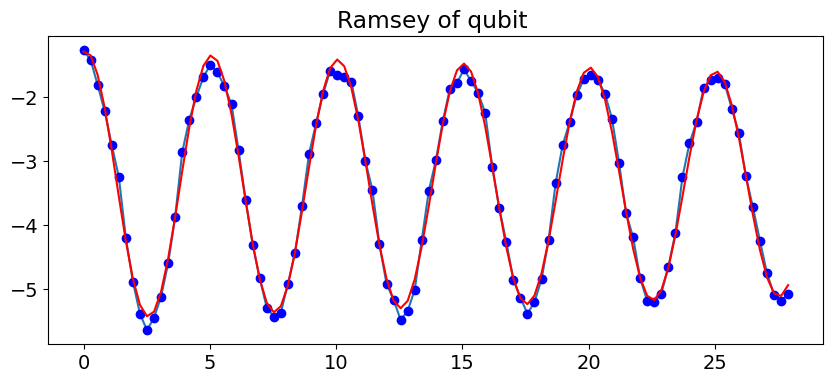

In [7]:
temp_data, attrs = prev_data(expt_path, '00000_ramsey_qubit0.h5')
# temp_data, attrs = prev_data(expt_path, '00003_ramseyEF_qubit0.h5')
y_data = temp_data['avgi']
x_length = temp_data['xpts']
plot_ramsey(x_length, y_data, attrs['config']['device']['qubit']['f_ge'][0], attrs['config']['expt']['ramsey_freq'], pi_length=2, t2=20, t1=20, vline=None, hline=None)
# plot_ramsey(x_length, y_data, attrs['config']['device']['qubit']['f_ef'], attrs['config']['expt']['ramsey_freq'], pi_length=0.3, t2=2, t1=2, vline=None, hline=None)

[ -4.15663381   0.32047529 -86.86950501 181.19415643   2.7117853 ]
====qubit information====
original qubit frequency:3576.307709538485 MHz
Ramsey frequency:0.02
Dephasing Time: 181.19415642694844 us
Oscillation frequency: 0.32047528834383604 MHz
Suggested qubit frequency: 3576.007234250141 MHz
possible qubit frequency: 3576.648184826829 MHz


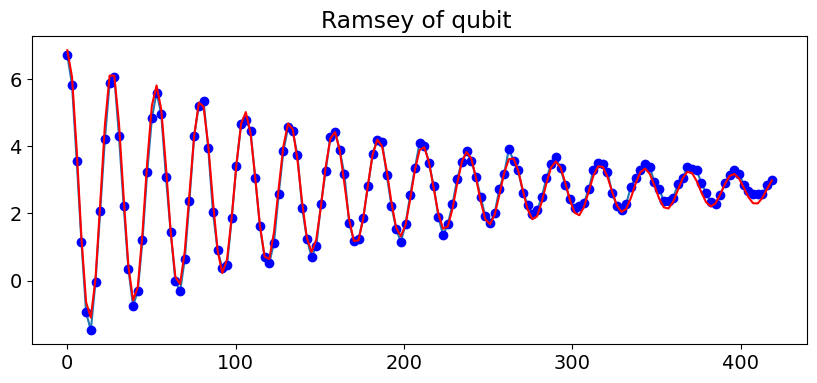

In [24]:
temp_data, attrs = prev_data(expt_path, '00005_ramsey_qubit0.h5')
# temp_data, attrs = prev_data(expt_path, '00003_ramseyEF_qubit0.h5')
y_data = temp_data['avgi']
x_length = temp_data['xpts']
plot_ramsey(x_length, y_data, attrs['config']['device']['qubit']['f_ge'][0], attrs['config']['expt']['ramsey_freq'], pi_length=2, t2=20, t1=20, vline=None, hline=None)
# plot_ramsey(x_length, y_data, attrs['config']['device']['qubit']['f_ef'], attrs['config']['expt']['ramsey_freq'], pi_length=0.3, t2=2, t1=2, vline=None, hline=None)

[  3.13898475   1.14379801 127.39529869  20.15671699   2.86470149]
====qubit information====
original qubit frequency:3434.0 MHz
Ramsey frequency:1.5
Dephasing Time: 20.15671698609226 us
Oscillation frequency: 1.1437980083367942 MHz
Suggested qubit frequency: 3434.356201991663 MHz
possible qubit frequency: 3436.643798008337 MHz


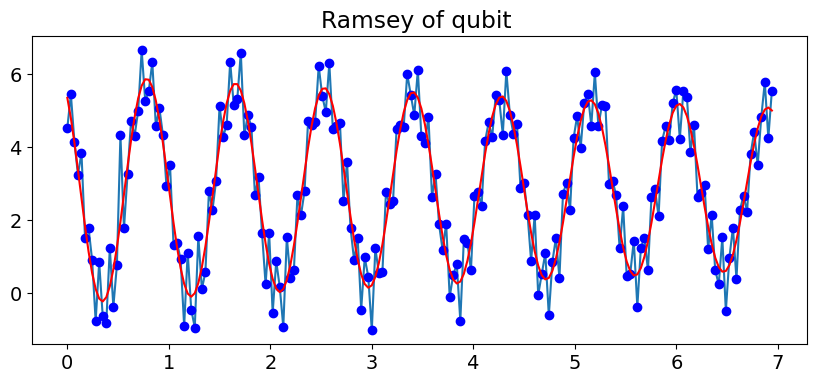

In [23]:
# temp_data, attrs = prev_data(expt_path, '00003_ramsey_qubit0.h5')
temp_data, attrs = prev_data(expt_path, '00000_ramseyEF_qubit0.h5')
y_data = temp_data['avgi']
x_length = temp_data['xpts']
# plot_ramsey(x_length, y_data, attrs['config']['device']['qubit']['f_ge'][0], attrs['config']['expt']['ramsey_freq'], pi_length=2, t2=20, t1=20, vline=None, hline=None)
plot_ramsey(x_length, y_data, attrs['config']['device']['qubit']['f_ef'], attrs['config']['expt']['ramsey_freq'], pi_length=0.3, t2=2, t1=2, vline=None, hline=None)

In [25]:
attrs['config']['device']['qubit']['f_ef']

3876.857725928913

## Echo

Extracted data and attrs ['config']
Oscillation frequency: 0.10021406653095931 MHz
Dephasing Time: 41.98392797218078 us


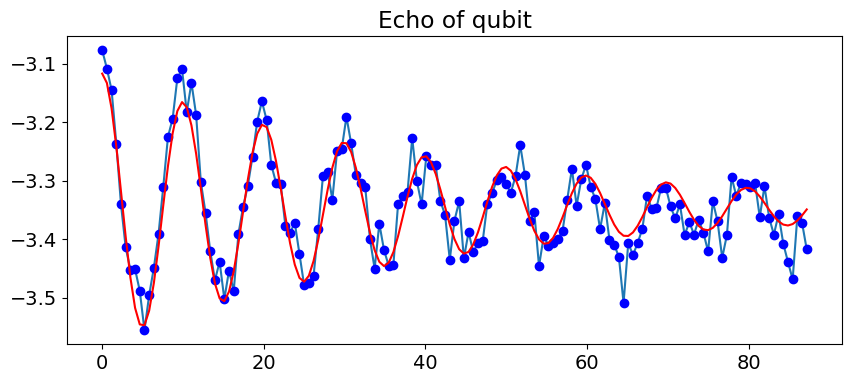

In [60]:
temp_data, attrs = prev_data(expt_path, '00000_echo_qubit0.h5')
y_data = temp_data['avgi']
x_time = temp_data['xpts']
plot_echo(x_time, y_data, pi_length=2, t1=10, t2=10, hlines=None, vlines=None)

### $\pi$ times vs. Techo

Text(0, 0.5, 'Techo (us)')

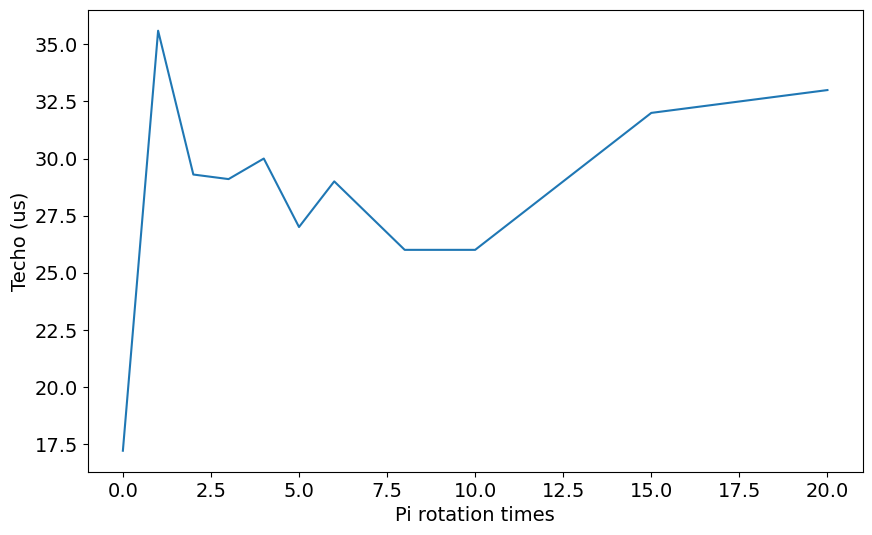

In [18]:
techo = np.array([17.2, 35.6, 29.3, 29.1, 30.0, 27.0, 29.0, 26.0, 26.0, 32.0, 33.0])
pi_times = np.array([0,1,2,3,4,5,6, 8, 10, 15, 20])
plt.plot(pi_times, techo)
plt.xlabel('Pi rotation times')
plt.ylabel('Techo (us)')

In [56]:
np.arange(5,25,1)

array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23, 24])

# 2D RF modulation data (Sweet spot, DC flux=-0.28 mA)

## cavity=6040 GHz

In [82]:
file_list = np.arange(0,1,1)
y_list = []
freq_list = []
name = '_test.h5'
for file_no in file_list:
    full_name = str(1).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['phases']-np.average(temp_data['phases'][0:50])
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['cavity_freq'])

# plot_RF_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF Sweep")

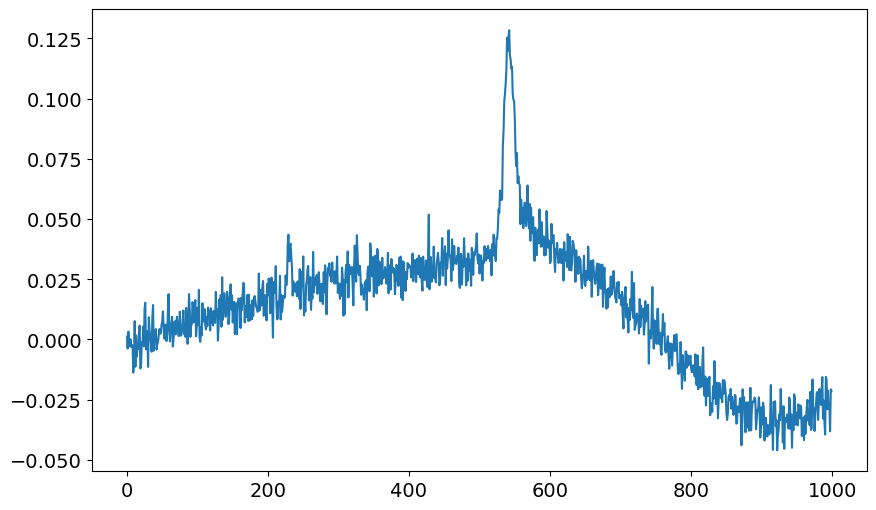

In [83]:
plt.plot(signal_y)

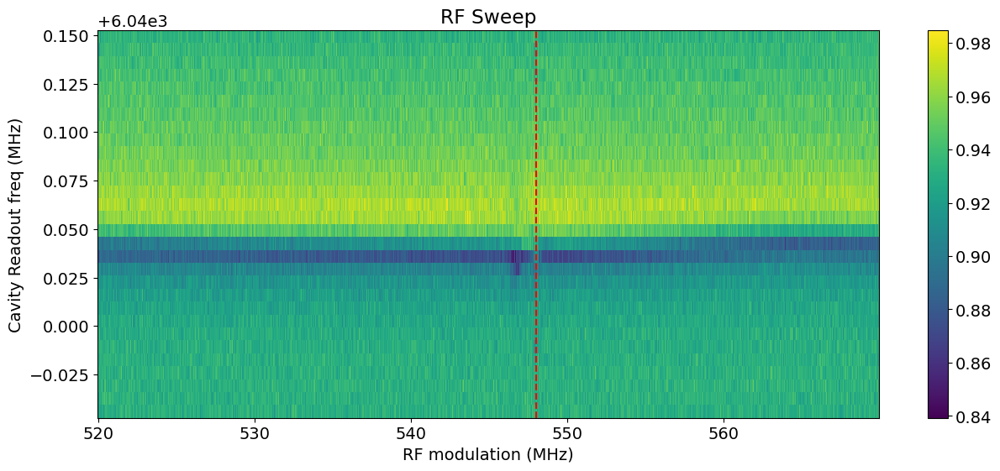

In [109]:
file_list = np.arange(52,82,1)
y_list = []
freq_list = []
name = '_RF_modulation_2D_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']-0*np.average(temp_data['amps'][0:20])
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['cavity_freq'])

plot_RF_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=[548], title="RF Sweep")

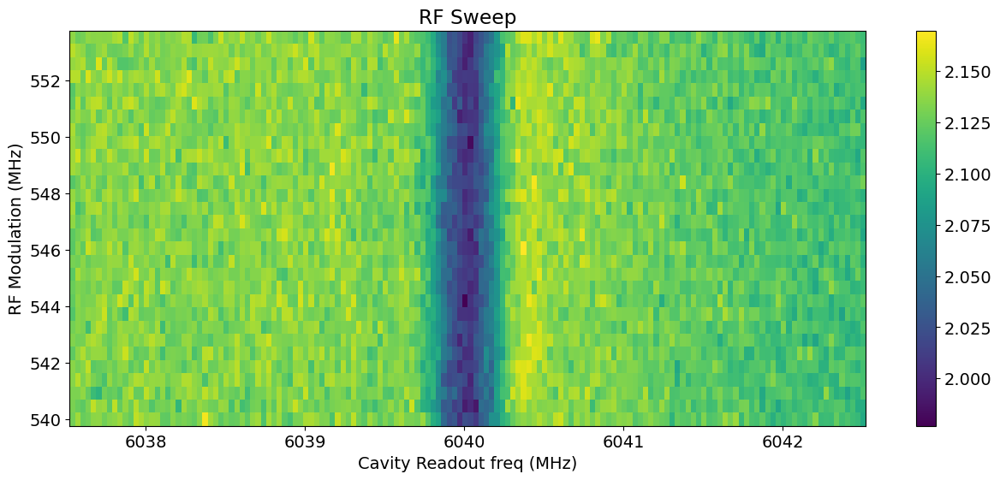

In [119]:
file_list = np.arange(0,30,1)
y_list = []
freq_list = []
name = '_RF_modulation_2D_sweep_new.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']-0*np.average(temp_data['amps'][0:20])
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['RF_modulation'][1])

plot_RF_sweep_new(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF Sweep")

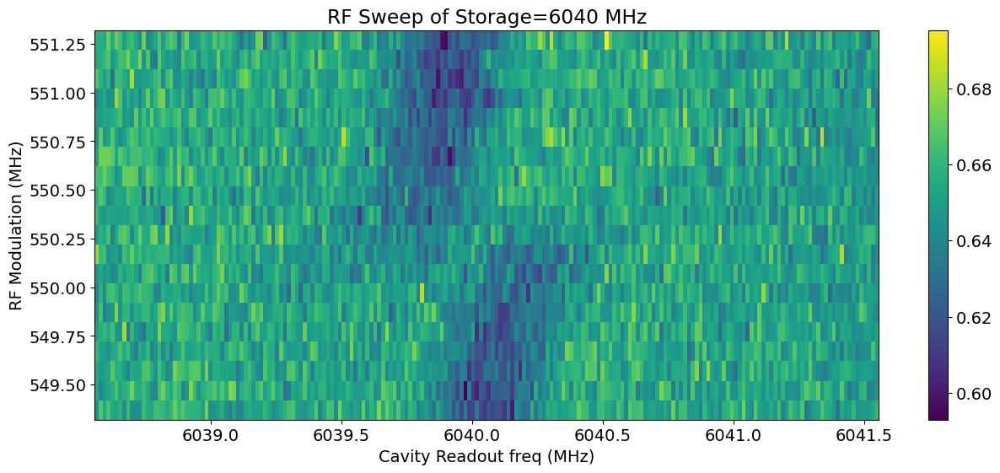

In [128]:
file_list = np.arange(31,51,1)
y_list = []
freq_list = []
name = '_RF_modulation_2D_sweep_new.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']-0*np.average(temp_data['amps'][0:20])
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['RF_modulation'][1])

plot_RF_sweep_new(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF Sweep of Storage=6040 MHz")

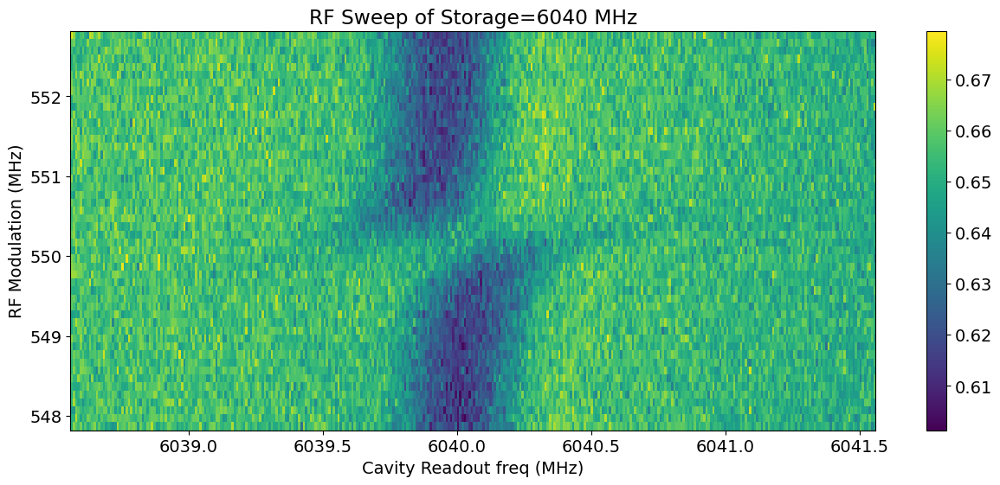

In [129]:
file_list = np.arange(52,102,1)
y_list = []
freq_list = []
name = '_RF_modulation_2D_sweep_new.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']-0*np.average(temp_data['amps'][0:20])
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['RF_modulation'][1])

plot_RF_sweep_new(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF Sweep of Storage=6040 MHz")

# Manipulate 1 sweep

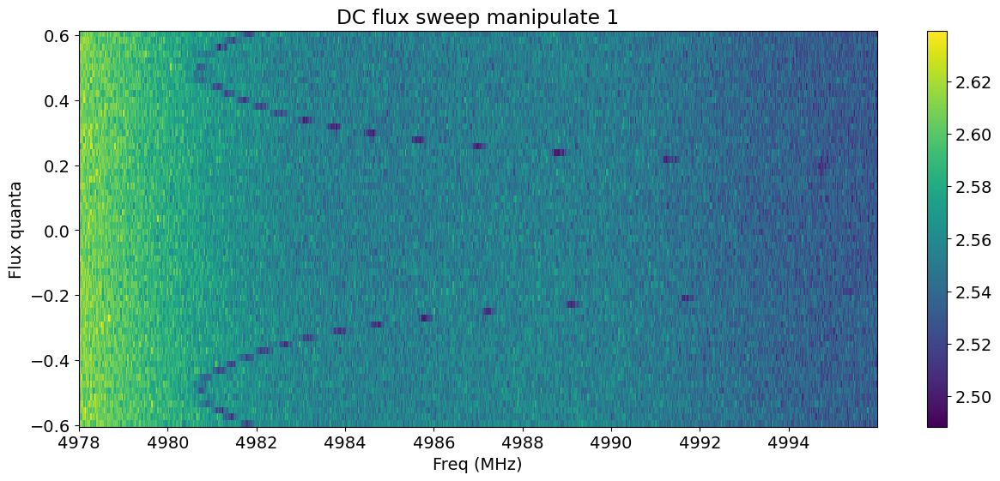

In [55]:
file_list = np.arange(0,60,1)
vary_pts = (linspace(-0.0015, 0.001, 61)*1000+0.28)/2.05
y_list = []
freq_list = []
name = '_Manipulate1_flux_scan.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']
    len_x = temp_data['xpts']
    y_list.append(signal_y)

plot_cavity_sweep(len_x, vary_pts[0:len(y_list)], np.array(y_list), hlines=[], vlines=None, title="DC flux sweep manipulate 1")
    

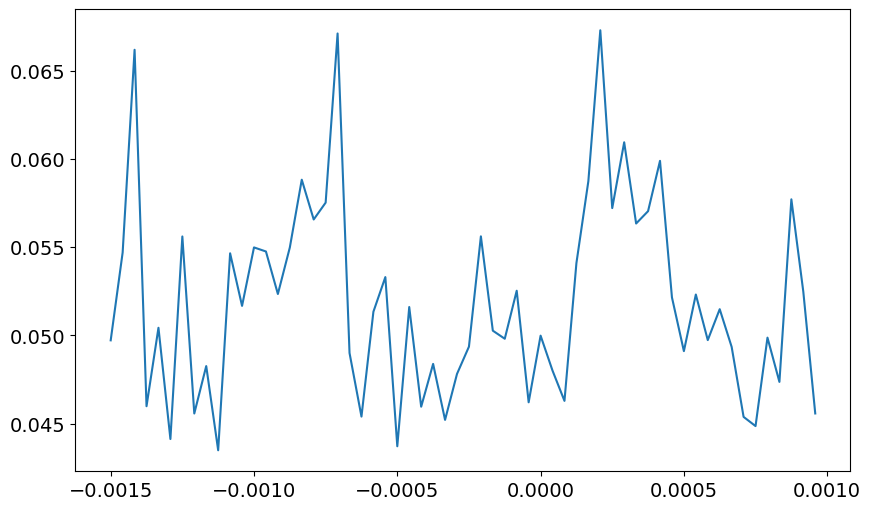

In [240]:
file_list = np.arange(0,60,1)
vary_pts = linspace(-0.0015, 0.001, 61)
y_list = []
freq_list = []
contrast_list = [] 
name = '_Manipulate1_flux_scan.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    contrast_list.append(np.abs(np.average(signal_y)-np.min(signal_y)))

plt.plot(vary_pts[0:len(contrast_list)], contrast_list)
    

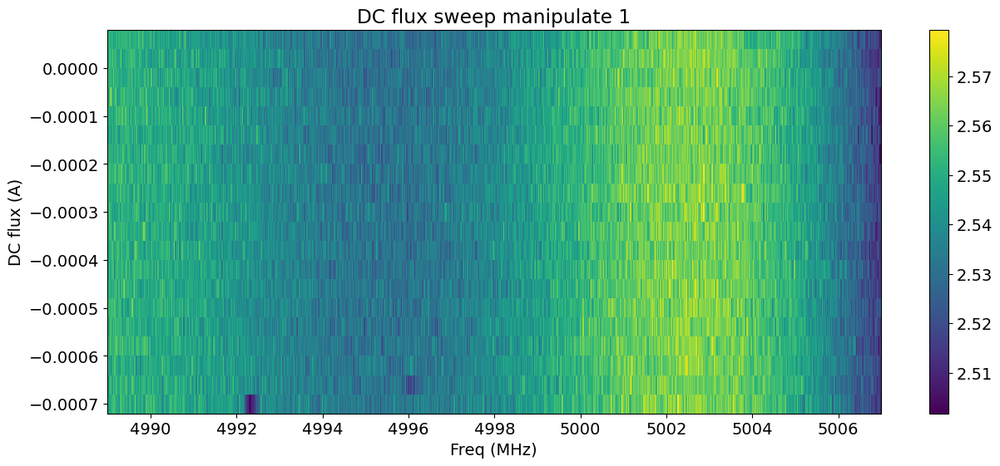

In [220]:
file_list = np.arange(61,81,1)
vary_pts = linspace(-0.0007, 0.0001, 21)
y_list = []
freq_list = []
name = '_Manipulate1_flux_scan.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']
    len_x = temp_data['xpts']
    y_list.append(signal_y)

plot_cavity_sweep(len_x, vary_pts[0:len(y_list)], np.array(y_list), hlines=[], vlines=None, title="DC flux sweep manipulate 1")
    

# Storage 4 sweep

In [28]:
file_list = np.arange(0,2,1)
file_list

array([0, 1])

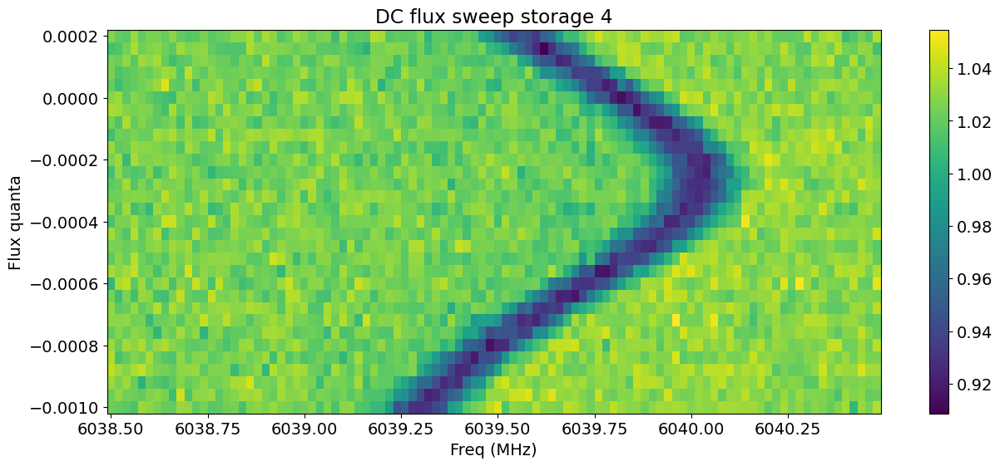

In [38]:
file_list = np.arange(5,36,1)
vary_pts = (linspace(-0.001, 0.001, 51))
y_list = []
freq_list = []
name = '_dc_flux_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']
    len_x = temp_data['xpts']
    y_list.append(signal_y)

plot_cavity_sweep(len_x, vary_pts[0:len(y_list)], np.array(y_list), hlines=[], vlines=None, title="DC flux sweep storage 4")
    

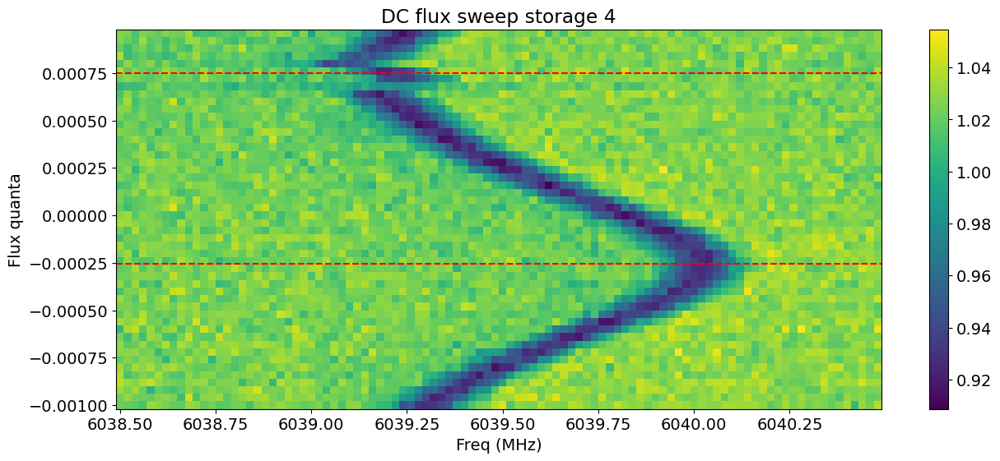

In [68]:
file_list = np.arange(5,55,1)
vary_pts = (linspace(-0.001, 0.001, 51))
y_list = []
freq_list = []
name = '_dc_flux_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']
    len_x = temp_data['xpts']
    y_list.append(signal_y)

plot_cavity_sweep(len_x, vary_pts[0:len(y_list)], np.array(y_list), hlines=[-0.000255, 0.00075], vlines=None, title="DC flux sweep storage 4")
    

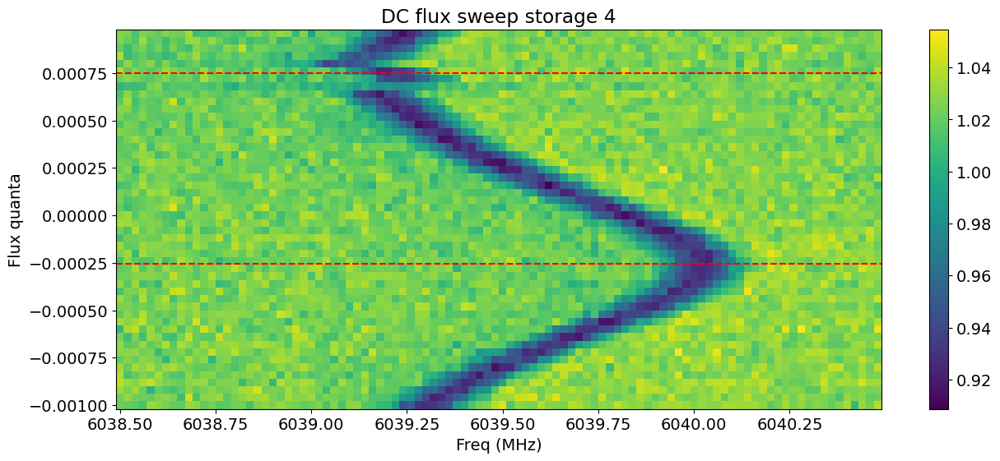

In [42]:
plot_cavity_sweep(len_x, vary_pts[0:len(y_list)], np.array(y_list), hlines=[-0.000255, 0.00075], vlines=None, title="DC flux sweep storage 4")

In [44]:
(0.00075 + 0.000255)*2

0.00201

In [48]:
c_sweet = -0.000255 # A
c_period = 2.01e-3

def curr_flux_quanta(c = 0.00025): 
    '''
    Input: current
    Return: # of flux quanta in unit sof pi
    '''
    phase = (c_sweet - c) /c_period
    return phase / np.pi
curr_flux_quanta()

-0.07997337936458424

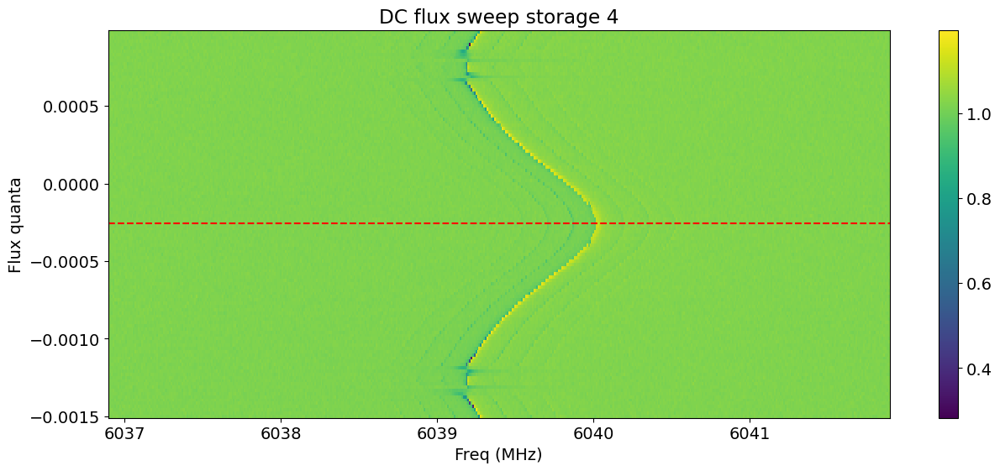

In [124]:
file_list = np.arange(182,302,1)
vary_pts = (linspace(-0.0015, 0.001, 121))
y_list = []
freq_list = []
name = '_Storage4_flux_scan.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']
    len_x = temp_data['xpts']
    y_list.append(signal_y)

plot_cavity_sweep(len_x, vary_pts[0:len(y_list)], np.array(y_list), hlines=[-0.000255], vlines=None, title="DC flux sweep storage 4")
    

# Displace through flux line

## Reference

H:\Shared drives\multimode\Multimode\experiment\231218\data\00008_flux_line_displacement.h5
[1929338.3003490577, 7.20618483492095]
alpha is:  0.05841800373530495  +-  16626457.648011908


c:\Users\26049\.conda\envs\slab\lib\site-packages\scipy\optimize\_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


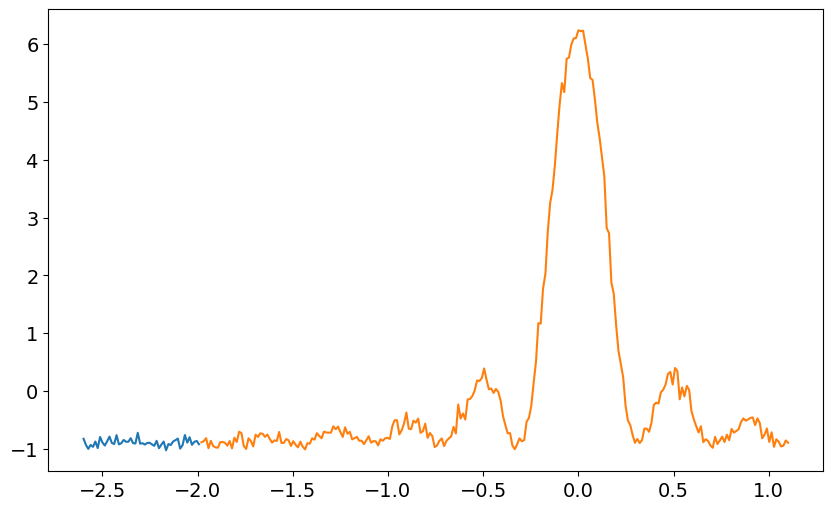

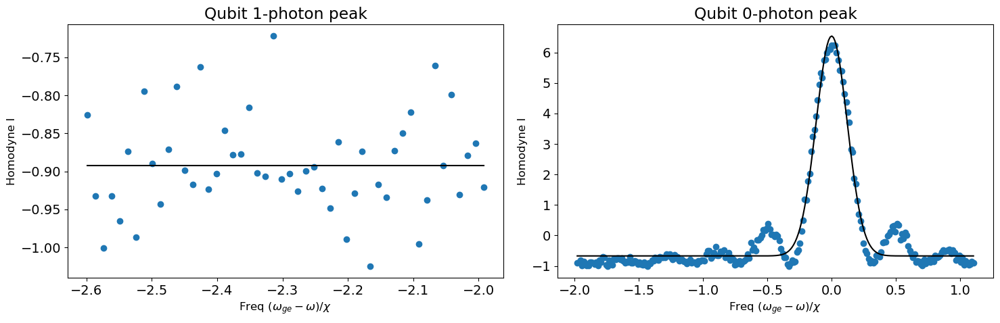

In [43]:
expt_name = 'flux_line_displacement'
fileid = 8
qubit_ge = 3567.1786106618742
chi = 0.2693791400392

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

filename = expt_path +'\\' + str(fileid).zfill(5) + "_"+expt_name.lower()+".h5"
with File(filename,'r') as f:

    xdata = np.array(f['xpts'])
    ydata = np.array(f['avgi'])
    f.close()

x_norm = []
for ii in xdata:
    x_norm.append((ii-qubit_ge)/chi)
x = np.array(x_norm)
y = ydata 

## Separate the data
separation_marker = [[0,50],[50,len(x)]]
phot_number = [1,0] # UPDATE: photon number corresponding to each window

print(filename)
if plt_data:
    plt.figure()
    for ii in separation_marker:
        plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])

N=1
p1_saved = []
p2_saved = []
area_total = 0

fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))

for ii in range(len(separation_marker)):
    xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
    ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
    fitparams = np.zeros(4)
    fitparams[0] = -0.5
    fitparams[1] = np.abs(max(ynow)-fitparams[0])
    fitparams[2] = -(1-ii)
    fitparams[3] = 0.2
    
    " Fit the gaussian peaks "
    p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
    
    if plt_data:
        ax1 = ax[ii]
        ax1.set_title(f'Qubit {phot_number[ii]}-photon peak')
        ax1.plot(xnow, ynow, 'o', label='data')
        ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

        ax1.set_ylabel('Homodyne I', fontsize = 12)
        ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
        p1_saved.append(p1)
        p2_saved.append(p2)

        plt.tight_layout()

    
peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
a, a_err = fitcoherentstate(peak_val)
print(peak_val)
print('alpha is: ',a, ' +- ',a_err)
    

H:\Shared drives\multimode\Multimode\experiment\231218\data\00076_flux_line_displacement.h5
[-1331314.112916456, 7.182018635258567]
alpha is:  101.00000000000001  +-  inf


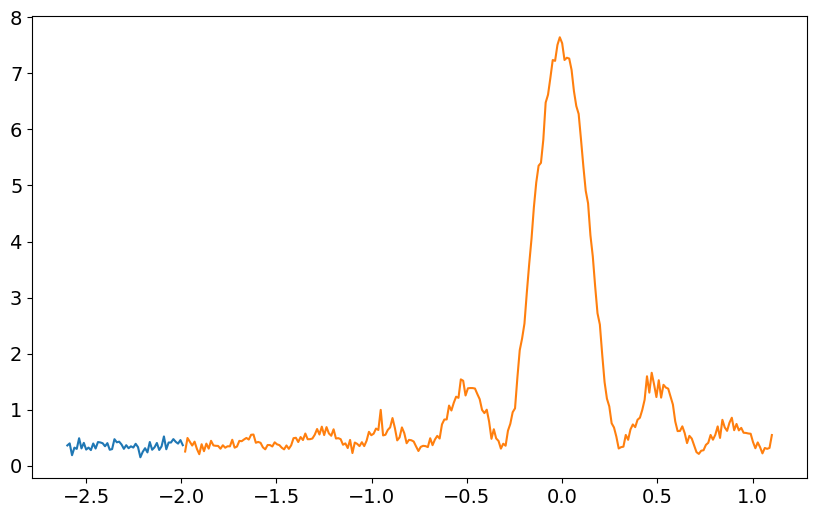

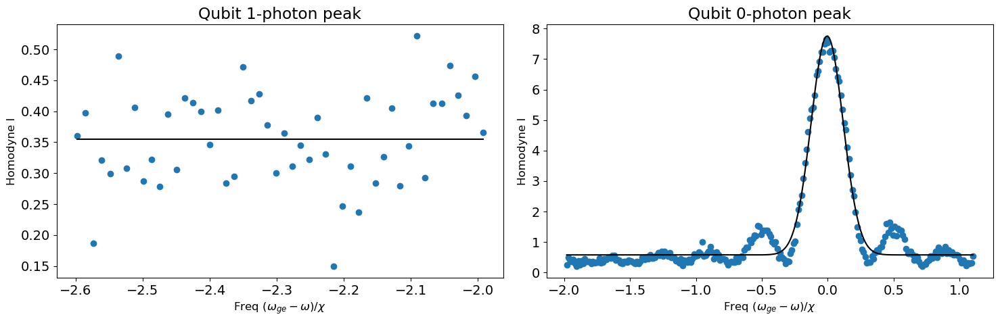

In [15]:
expt_name = 'flux_line_displacement'
fileid = 76
qubit_ge = 3567.1786106618742
chi = 0.2693791400392

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

filename = expt_path +'\\' + str(fileid).zfill(5) + "_"+expt_name.lower()+".h5"
with File(filename,'r') as f:

    xdata = np.array(f['xpts'])
    ydata = np.array(f['avgi'])
    f.close()

x_norm = []
for ii in xdata:
    x_norm.append((ii-qubit_ge)/chi)
x = np.array(x_norm)
y = ydata 

## Separate the data
separation_marker = [[0,50],[50,len(x)]]
phot_number = [1,0] # UPDATE: photon number corresponding to each window

print(filename)
if plt_data:
    plt.figure()
    for ii in separation_marker:
        plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])

N=1
p1_saved = []
p2_saved = []
area_total = 0

fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))

for ii in range(len(separation_marker)):
    xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
    ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
    fitparams = np.zeros(4)
    fitparams[0] = -0.5
    fitparams[1] = np.abs(max(ynow)-fitparams[0])
    fitparams[2] = -(1-ii)
    fitparams[3] = 0.2
    
    " Fit the gaussian peaks "
    p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
    
    if plt_data:
        ax1 = ax[ii]
        ax1.set_title(f'Qubit {phot_number[ii]}-photon peak')
        ax1.plot(xnow, ynow, 'o', label='data')
        ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

        ax1.set_ylabel('Homodyne I', fontsize = 12)
        ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
        p1_saved.append(p1)
        p2_saved.append(p2)

        plt.tight_layout()

    
peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
a, a_err = fitcoherentstate(peak_val)
print(peak_val)
print('alpha is: ',a, ' +- ',a_err)
    

## manipulate 1, gain=2000, length=2us, sqaure pulse

H:\Shared drives\multimode\Multimode\experiment\231218\data\00007_flux_line_displacement.h5
[0.49796386 0.38747857 0.14844699]
1.0338894187124796
alpha is:  0.8569845965626652  +-  0.03327719539285866


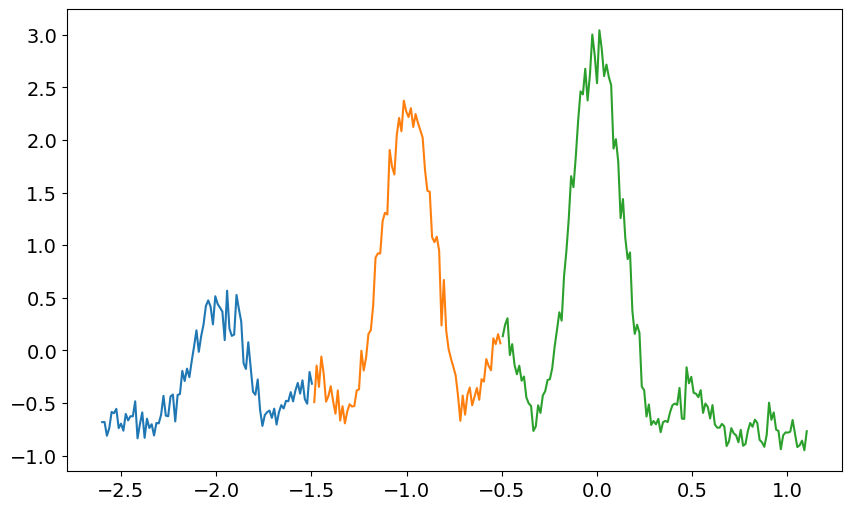

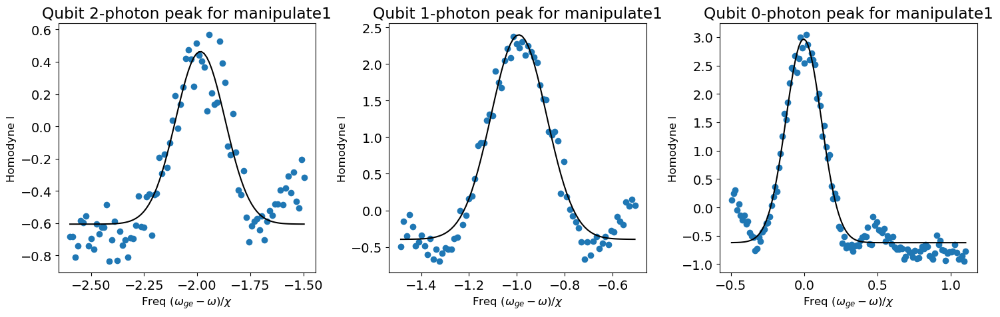

In [32]:
expt_name = 'flux_line_displacement'
fileid = 7
qubit_ge = 3567.1786106618742
chi = 0.2693791400392
Pnorm = 7.20618483492095

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

filename = expt_path +'\\' + str(fileid).zfill(5) + "_"+expt_name.lower()+".h5"
with File(filename,'r') as f:

    xdata = np.array(f['xpts'])
    ydata = np.array(f['avgi'])
    f.close()

x_norm = []
for ii in xdata:
    x_norm.append((ii-qubit_ge)/chi)
x = np.array(x_norm)
y = ydata 

## Separate the data
separation_marker = [[0,90],[90,170],[170,len(x)]]
phot_number = [2,1,0] # UPDATE: photon number corresponding to each window

print(filename)
if plt_data:
    plt.figure()
    for ii in separation_marker:
        plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])

N=1
p1_saved = []
p2_saved = []
area_total = 0

fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))

for ii in range(len(separation_marker)):
    xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
    ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
    fitparams = np.zeros(4)
    fitparams[0] = -0.5
    fitparams[1] = np.abs(max(ynow)-fitparams[0])
    fitparams[2] = -(2-ii)
    fitparams[3] = 0.2
    
    " Fit the gaussian peaks "
    p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
    
    if plt_data:
        ax1 = ax[ii]
        ax1.set_title(f'Qubit {phot_number[ii]}-photon peak for manipulate1')
        ax1.plot(xnow, ynow, 'o', label='data')
        ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

        ax1.set_ylabel('Homodyne I', fontsize = 12)
        ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
        p1_saved.append(p1)
        p2_saved.append(p2)

        plt.tight_layout()

    
peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
a, a_err = fitcoherentstate(np.flip(np.array(peak_val)/Pnorm))
print(np.flip(np.array(peak_val)/Pnorm))
print(sum(np.array(peak_val)/Pnorm))
print('alpha is: ',a, ' +- ',a_err)
    

In [31]:
np.flip(np.array([1,2,3]))

array([3, 2, 1])

## manipulate 2, gain=400, length=2us, square pulse

H:\Shared drives\multimode\Multimode\experiment\231218\data\00013_flux_line_displacement.h5
[0.51048454 0.36830848 0.13061694]
1.009409953584044
alpha is:  0.8334018509421481  +-  0.019611902702163186


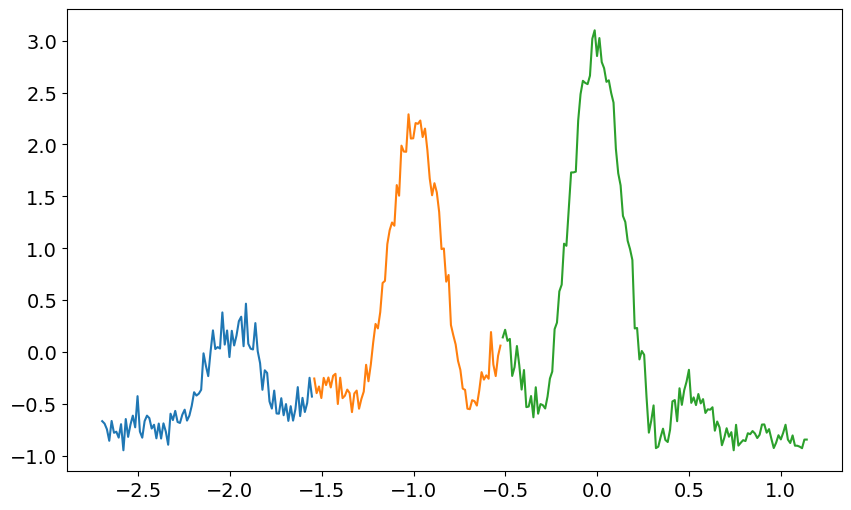

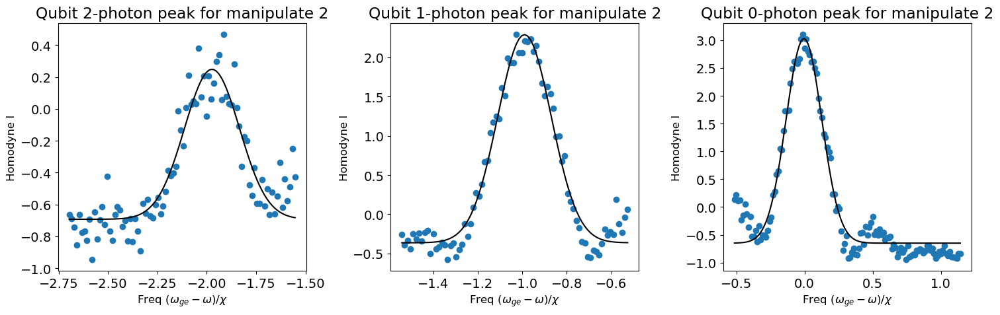

In [33]:
expt_name = 'flux_line_displacement'
fileid = 13
qubit_ge = 3567.1786106618742
chi = 0.2596151756934
Pnorm = 7.20618483492095

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

filename = expt_path +'\\' + str(fileid).zfill(5) + "_"+expt_name.lower()+".h5"
with File(filename,'r') as f:

    xdata = np.array(f['xpts'])
    ydata = np.array(f['avgi'])
    f.close()

x_norm = []
for ii in xdata:
    x_norm.append((ii-qubit_ge)/chi)
x = np.array(x_norm)
y = ydata 

## Separate the data
separation_marker = [[0,90],[90,170],[170,len(x)]]
phot_number = [2,1,0] # UPDATE: photon number corresponding to each window

print(filename)
if plt_data:
    plt.figure()
    for ii in separation_marker:
        plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])

N=1
p1_saved = []
p2_saved = []
area_total = 0

fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))

for ii in range(len(separation_marker)):
    xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
    ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
    fitparams = np.zeros(4)
    fitparams[0] = -0.5
    fitparams[1] = np.abs(max(ynow)-fitparams[0])
    fitparams[2] = -(2-ii)
    fitparams[3] = 0.2
    
    " Fit the gaussian peaks "
    p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
    
    if plt_data:
        ax1 = ax[ii]
        ax1.set_title(f'Qubit {phot_number[ii]}-photon peak for manipulate 2')
        ax1.plot(xnow, ynow, 'o', label='data')
        ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

        ax1.set_ylabel('Homodyne I', fontsize = 12)
        ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
        p1_saved.append(p1)
        p2_saved.append(p2)

        plt.tight_layout()

    
peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
a, a_err = fitcoherentstate(np.flip(np.array(peak_val)/Pnorm))
print(np.flip(np.array(peak_val)/Pnorm))
print(sum(np.array(peak_val)/Pnorm))
print('alpha is: ',a, ' +- ',a_err)
    

In [25]:
fitcoherentstate([1])

(2.59168763870181e-05, inf)

## Storage 1, gain=20000, length=3us, square pulse

H:\Shared drives\multimode\Multimode\experiment\231218\data\00040_flux_line_displacement.h5
[0.68915053 0.25294642 0.05208554]
0.9941824931312921
alpha is:  0.6093855411812007  +-  0.0038531852823432745


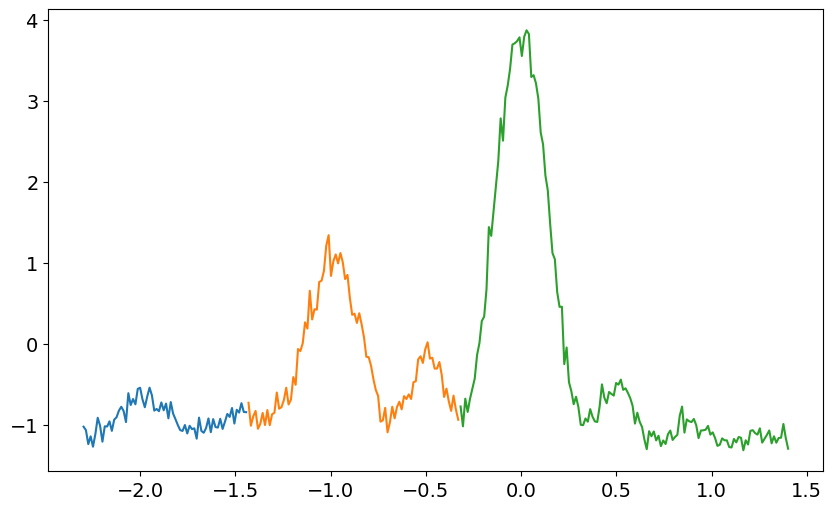

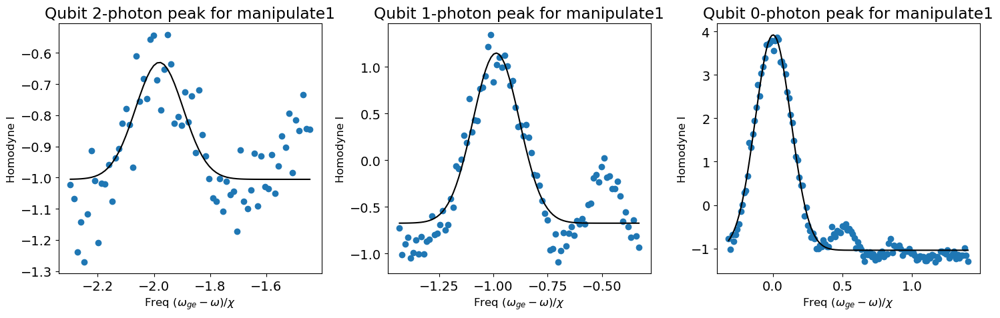

In [34]:
expt_name = 'flux_line_displacement'
fileid = 40
qubit_ge = 3567.0976242451907
chi = 0.2693791400392
Pnorm = 7.20618483492095

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

filename = expt_path +'\\' + str(fileid).zfill(5) + "_"+expt_name.lower()+".h5"
with File(filename,'r') as f:

    xdata = np.array(f['xpts'])
    ydata = np.array(f['avgi'])
    f.close()

x_norm = []
for ii in xdata:
    x_norm.append((ii-qubit_ge)/chi)
x = np.array(x_norm)
y = ydata 

## Separate the data
separation_marker = [[0,70],[70,160],[160,len(x)]]
phot_number = [2,1,0] # UPDATE: photon number corresponding to each window

print(filename)
if plt_data:
    plt.figure()
    for ii in separation_marker:
        plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])

N=1
p1_saved = []
p2_saved = []
area_total = 0

fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))

for ii in range(len(separation_marker)):
    xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
    ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
    fitparams = np.zeros(4)
    fitparams[0] = -0.5
    fitparams[1] = np.abs(max(ynow)-fitparams[0])
    fitparams[2] = -(2-ii)
    fitparams[3] = 0.2
    
    " Fit the gaussian peaks "
    p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
    
    if plt_data:
        ax1 = ax[ii]
        ax1.set_title(f'Qubit {phot_number[ii]}-photon peak for manipulate1')
        ax1.plot(xnow, ynow, 'o', label='data')
        ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

        ax1.set_ylabel('Homodyne I', fontsize = 12)
        ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
        p1_saved.append(p1)
        p2_saved.append(p2)

        plt.tight_layout()

    
peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
a, a_err = fitcoherentstate(np.flip(np.array(peak_val)/Pnorm))
print(np.flip(np.array(peak_val)/Pnorm))
print(sum(np.array(peak_val)/Pnorm))
print('alpha is: ',a, ' +- ',a_err)
    

## Storage 3, gain=2000, length=2us

H:\Shared drives\multimode\Multimode\experiment\231218\data\00079_flux_line_displacement.h5
[0.63481304 0.18714887 0.04301963]
0.8649815412257245
alpha is:  0.6181696146704303  +-  0.06063066609903473


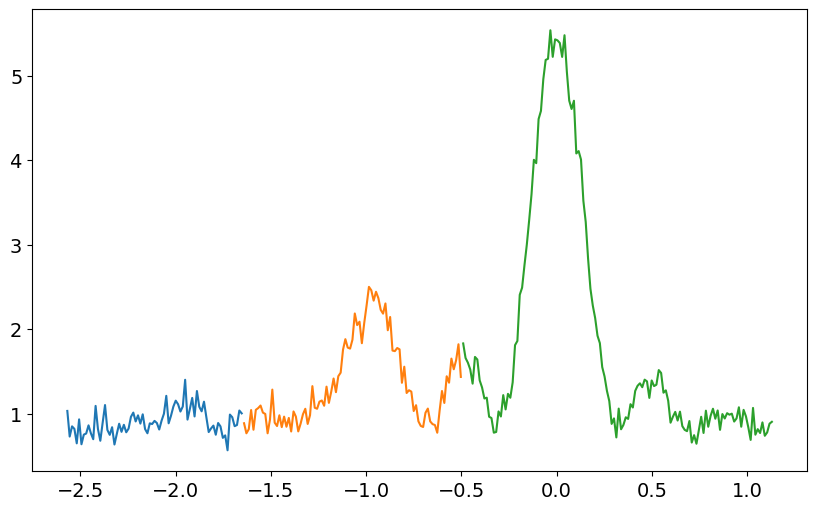

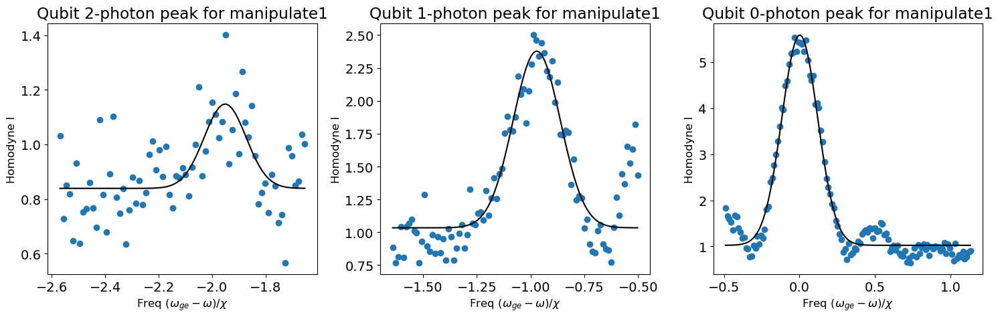

In [37]:
expt_name = 'flux_line_displacement'
fileid = 79
qubit_ge = 3567.170751845604
chi = 0.2693791400392
Pnorm = 7.182018635258567

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

filename = expt_path +'\\' + str(fileid).zfill(5) + "_"+expt_name.lower()+".h5"
with File(filename,'r') as f:

    xdata = np.array(f['xpts'])
    ydata = np.array(f['avgi'])
    f.close()

x_norm = []
for ii in xdata:
    x_norm.append((ii-qubit_ge)/chi)
x = np.array(x_norm)
y = ydata 

## Separate the data
separation_marker = [[0,75],[75,168],[168,len(x)]]
phot_number = [2,1,0] # UPDATE: photon number corresponding to each window

print(filename)
if plt_data:
    plt.figure()
    for ii in separation_marker:
        plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])

N=1
p1_saved = []
p2_saved = []
area_total = 0

fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))

for ii in range(len(separation_marker)):
    xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
    ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
    fitparams = np.zeros(4)
    fitparams[0] = -0.5
    fitparams[1] = np.abs(max(ynow)-fitparams[0])
    fitparams[2] = -(2-ii)
    fitparams[3] = 0.2
    
    " Fit the gaussian peaks "
    p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
    
    if plt_data:
        ax1 = ax[ii]
        ax1.set_title(f'Qubit {phot_number[ii]}-photon peak for manipulate1')
        ax1.plot(xnow, ynow, 'o', label='data')
        ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

        ax1.set_ylabel('Homodyne I', fontsize = 12)
        ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
        p1_saved.append(p1)
        p2_saved.append(p2)

        plt.tight_layout()

    
peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
a, a_err = fitcoherentstate(np.flip(np.array(peak_val)/Pnorm))
print(np.flip(np.array(peak_val)/Pnorm))
print(sum(np.array(peak_val)/Pnorm))
print('alpha is: ',a, ' +- ',a_err)
    

## Storage 4, gain=3000, length=2us

H:\Shared drives\multimode\Multimode\experiment\231218\data\00082_flux_line_displacement.h5
[0.5618704  0.36933468 0.13287087]
1.0640759542093372
alpha is:  0.7893730281895316  +-  0.03782484221671664


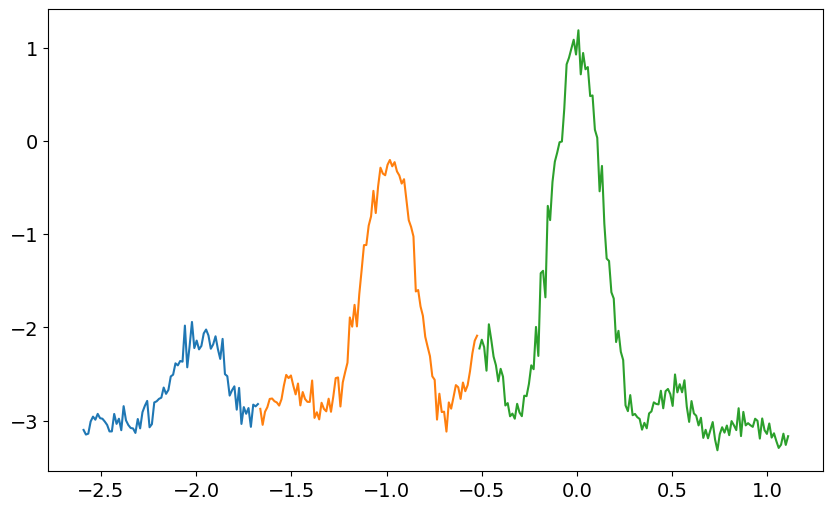

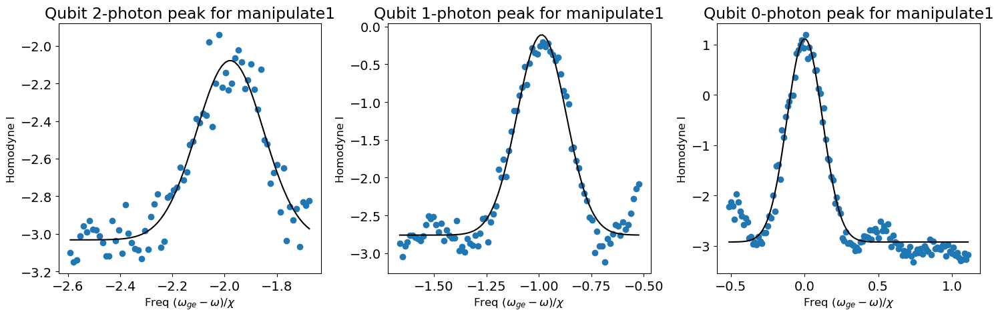

In [56]:
expt_name = 'flux_line_displacement'
fileid = 82
qubit_ge = 3567.1766713864754
chi = 0.2693791400392
Pnorm = 7.182018635258567

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

filename = expt_path +'\\' + str(fileid).zfill(5) + "_"+expt_name.lower()+".h5"
with File(filename,'r') as f:

    xdata = np.array(f['xpts'])
    ydata = np.array(f['avgi'])
    f.close()

x_norm = []
for ii in xdata:
    x_norm.append((ii-qubit_ge)/chi)
x = np.array(x_norm)
y = ydata 

## Separate the data
separation_marker = [[0,75],[75,168],[168,len(x)]]
phot_number = [2,1,0] # UPDATE: photon number corresponding to each window

print(filename)
if plt_data:
    plt.figure()
    for ii in separation_marker:
        plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])

N=1
p1_saved = []
p2_saved = []
area_total = 0

fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))

for ii in range(len(separation_marker)):
    xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
    ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
    fitparams = np.zeros(4)
    fitparams[0] = -0.5
    fitparams[1] = np.abs(max(ynow)-fitparams[0])
    fitparams[2] = -(2-ii)
    fitparams[3] = 0.2
    
    " Fit the gaussian peaks "
    p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
    
    if plt_data:
        ax1 = ax[ii]
        ax1.set_title(f'Qubit {phot_number[ii]}-photon peak for manipulate1')
        ax1.plot(xnow, ynow, 'o', label='data')
        ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

        ax1.set_ylabel('Homodyne I', fontsize = 12)
        ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
        p1_saved.append(p1)
        p2_saved.append(p2)

        plt.tight_layout()

    
peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
a, a_err = fitcoherentstate(np.flip(np.array(peak_val)/Pnorm))
print(np.flip(np.array(peak_val)/Pnorm))
print(sum(np.array(peak_val)/Pnorm))
print('alpha is: ',a, ' +- ',a_err)
    

## Storage 5 gain=15000, length=2us

H:\Shared drives\multimode\Multimode\experiment\231218\data\00087_flux_line_displacement.h5
[0.52442211 0.27724398 0.15232556]
0.9539916485773635
alpha is:  0.8004898258506473  +-  0.054630385642399526


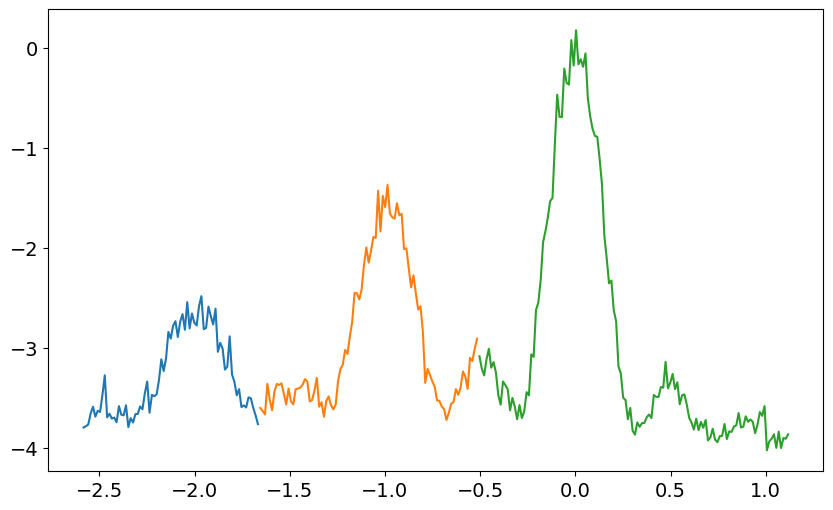

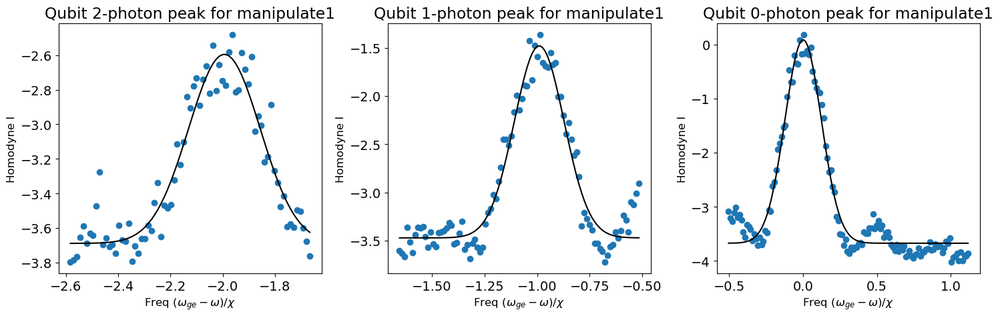

In [57]:
expt_name = 'flux_line_displacement'
fileid = 87
qubit_ge = 3567.1744285862633
chi = 0.2693791400392
Pnorm = 7.182018635258567

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

filename = expt_path +'\\' + str(fileid).zfill(5) + "_"+expt_name.lower()+".h5"
with File(filename,'r') as f:

    xdata = np.array(f['xpts'])
    ydata = np.array(f['avgi'])
    f.close()

x_norm = []
for ii in xdata:
    x_norm.append((ii-qubit_ge)/chi)
x = np.array(x_norm)
y = ydata 

## Separate the data
separation_marker = [[0,75],[75,168],[168,len(x)]]
phot_number = [2,1,0] # UPDATE: photon number corresponding to each window

print(filename)
if plt_data:
    plt.figure()
    for ii in separation_marker:
        plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])

N=1
p1_saved = []
p2_saved = []
area_total = 0

fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))

for ii in range(len(separation_marker)):
    xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
    ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
    fitparams = np.zeros(4)
    fitparams[0] = -0.5
    fitparams[1] = np.abs(max(ynow)-fitparams[0])
    fitparams[2] = -(2-ii)
    fitparams[3] = 0.2
    
    " Fit the gaussian peaks "
    p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
    
    if plt_data:
        ax1 = ax[ii]
        ax1.set_title(f'Qubit {phot_number[ii]}-photon peak for manipulate1')
        ax1.plot(xnow, ynow, 'o', label='data')
        ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

        ax1.set_ylabel('Homodyne I', fontsize = 12)
        ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
        p1_saved.append(p1)
        p2_saved.append(p2)

        plt.tight_layout()

    
peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
a, a_err = fitcoherentstate(np.flip(np.array(peak_val)/Pnorm))
print(np.flip(np.array(peak_val)/Pnorm))
print(sum(np.array(peak_val)/Pnorm))
print('alpha is: ',a, ' +- ',a_err)
    

## Storage 6 gain=5000 length=2us

H:\Shared drives\multimode\Multimode\experiment\231218\data\00096_flux_line_displacement.h5
[0.6013006  0.32895607 0.09660526]
1.026861922456407
alpha is:  0.7286161577224459  +-  0.017873446268387452


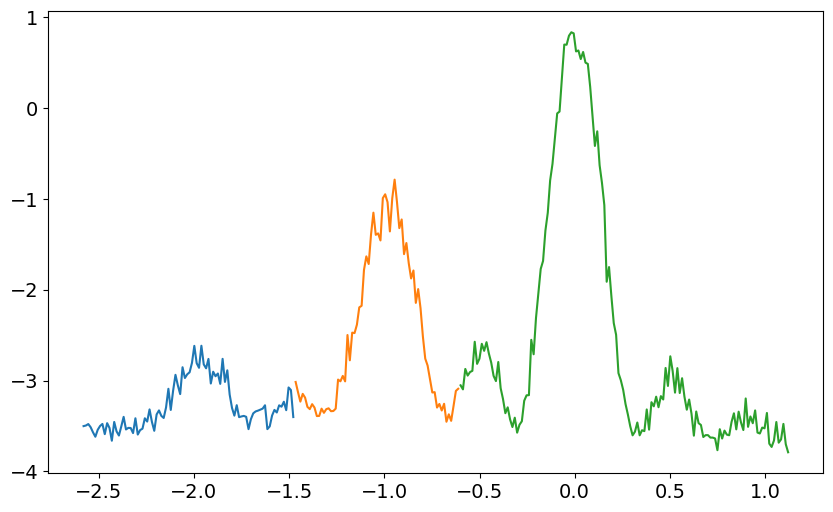

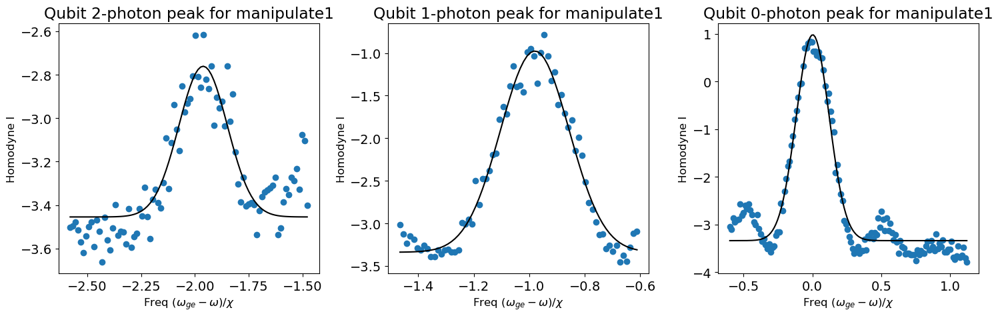

In [65]:
expt_name = 'flux_line_displacement'
fileid = 96
qubit_ge = 3567.173478932384
chi = 0.2693791400392
Pnorm = 7.182018635258567

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

filename = expt_path +'\\' + str(fileid).zfill(5) + "_"+expt_name.lower()+".h5"
with File(filename,'r') as f:

    xdata = np.array(f['xpts'])
    ydata = np.array(f['avgi'])
    f.close()

x_norm = []
for ii in xdata:
    x_norm.append((ii-qubit_ge)/chi)
x = np.array(x_norm)
y = ydata 

## Separate the data
separation_marker = [[0,90],[90,160],[160,len(x)]]
phot_number = [2,1,0] # UPDATE: photon number corresponding to each window

print(filename)
if plt_data:
    plt.figure()
    for ii in separation_marker:
        plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])

N=1
p1_saved = []
p2_saved = []
area_total = 0

fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))

for ii in range(len(separation_marker)):
    xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
    ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
    fitparams = np.zeros(4)
    fitparams[0] = -0.5
    fitparams[1] = np.abs(max(ynow)-fitparams[0])
    fitparams[2] = -(2-ii)
    fitparams[3] = 0.2
    
    " Fit the gaussian peaks "
    p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
    
    if plt_data:
        ax1 = ax[ii]
        ax1.set_title(f'Qubit {phot_number[ii]}-photon peak for manipulate1')
        ax1.plot(xnow, ynow, 'o', label='data')
        ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

        ax1.set_ylabel('Homodyne I', fontsize = 12)
        ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
        p1_saved.append(p1)
        p2_saved.append(p2)

        plt.tight_layout()

    
peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
a, a_err = fitcoherentstate(np.flip(np.array(peak_val)/Pnorm))
print(np.flip(np.array(peak_val)/Pnorm))
print(sum(np.array(peak_val)/Pnorm))
print('alpha is: ',a, ' +- ',a_err)
    

# RF flux modulation

## DC flux=-0.875mA (0.302pi)

### Manipulate 1 to storage 1

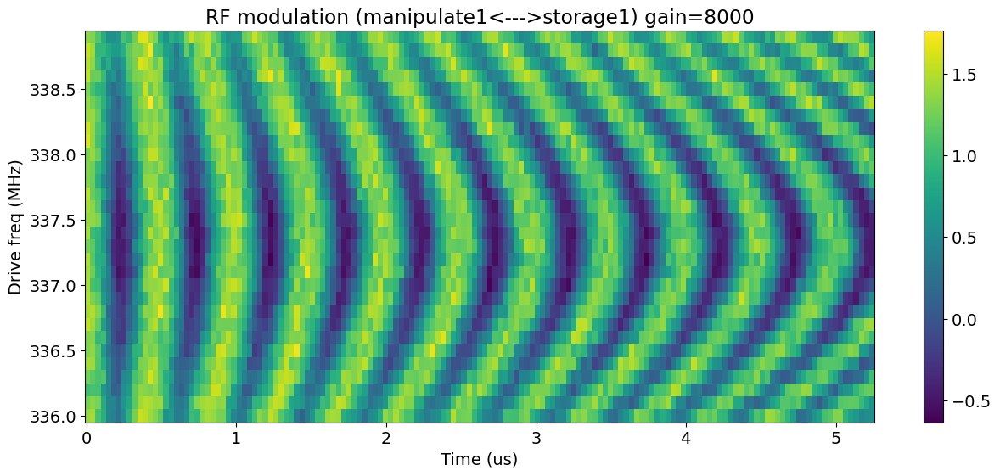

In [39]:
file_list = np.arange(0,30,1)
y_list = []
freq_list = []
name = '_rfflux_manipualte1_storage1_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF modulation (manipulate1<--->storage1) gain=8000")
    

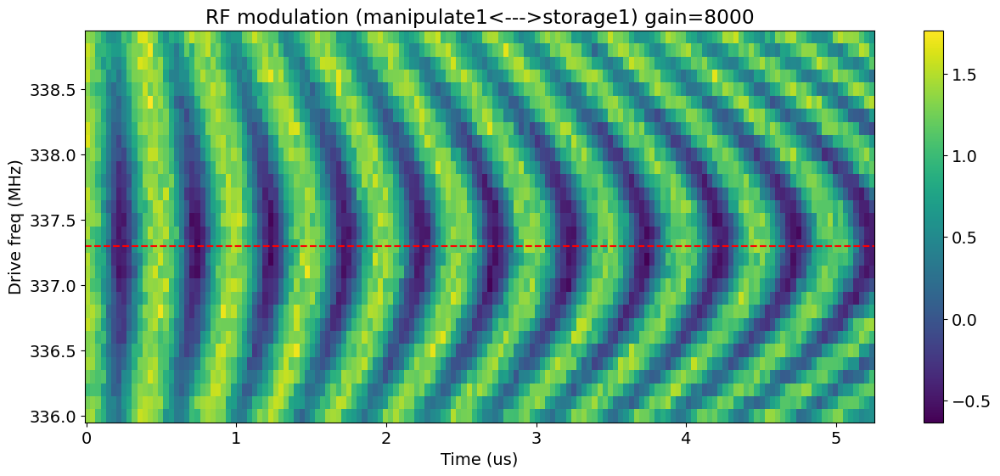

In [41]:
plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=[337.3], vlines=None, title="RF modulation (manipulate1<--->storage1) gain=8000")

#### single slice

auto pi_len: 0.24131
auto pi/2_len: 0.11655
pi len: -0.00822 or 0.24131 or -0.25774 or 0.49084
pi/2 len: -0.13298 or -0.00822
Oscillation rate is: 2.003805270987451 MHz
Oscillation amp is: 2.0578196427799105
Decay Time: 29.187671213040122 us


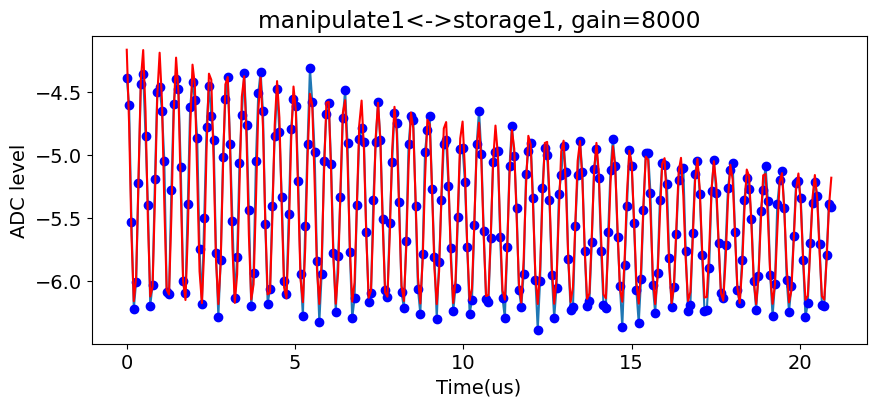

In [68]:
temp_data, attrs = prev_data(expt_path, '00003_rfflux_manipulate1_storage1.h5')  # ge
# temp_data, attrs = prev_data(expt_path, '00002_length_rabiEF_qubit0.h5')  # ef
signal_y = temp_data['avgi']
len_x = temp_data['xpts']
plot_sideband_rabi(len_x, signal_y, pi_length=0.2*2, t1=30, vlines=None, hlines=None, title='manipulate1<->storage1, gain=8000')

In [72]:
np.exp(-1/117)

0.991489413290758

### Manipulate 1 to storage 2

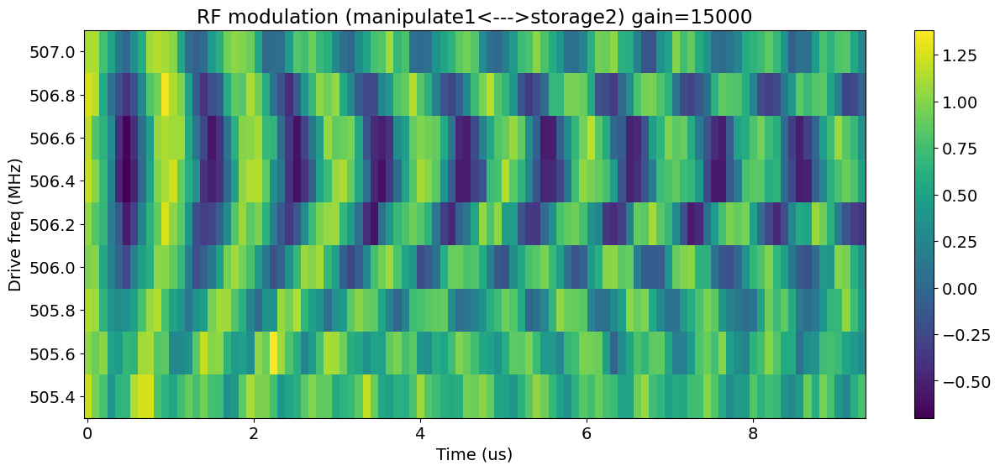

In [245]:
file_list = np.arange(0,9,1)
y_list = []
freq_list = []
name = '_rfflux_manipualte1_storage2_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF modulation (manipulate1<--->storage2) gain=15000")
    

### Manipulate 1 to storage 3

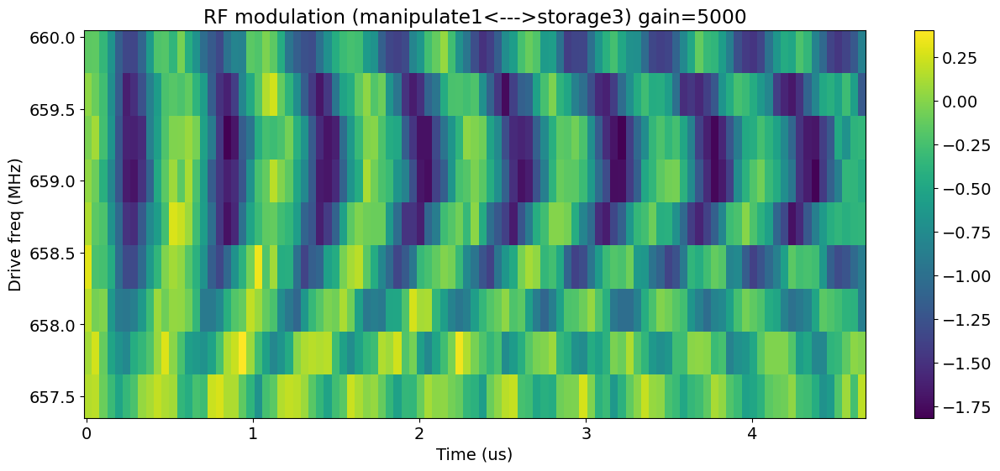

In [250]:
file_list = np.arange(10,19,1)
y_list = []
freq_list = []
name = '_rfflux_manipualte1_storage2_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF modulation (manipulate1<--->storage3) gain=5000")
    

### Manipulate 1 to storage 4

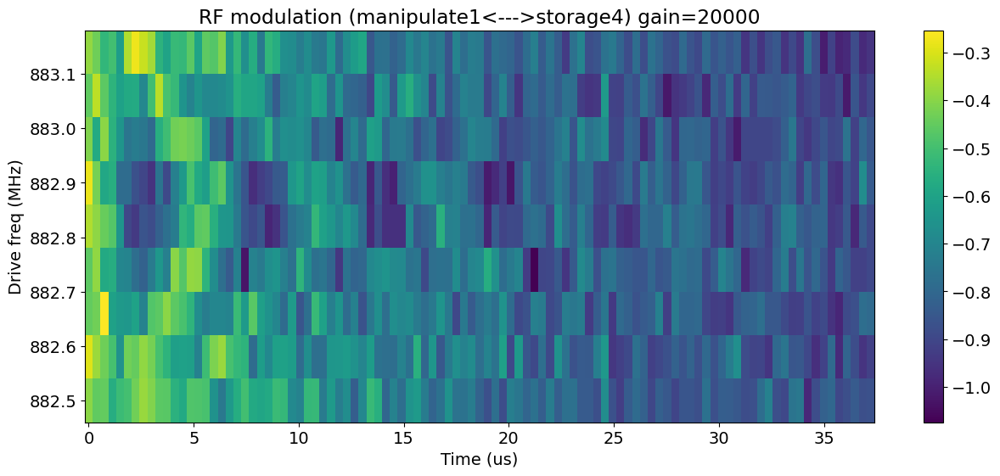

In [12]:
file_list = np.arange(25,34,1)
y_list = []
freq_list = []
name = '_rfflux_manipualte1_storage4_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF modulation (manipulate1<--->storage4) gain=20000")
    

### storage 3 to manipulate 1

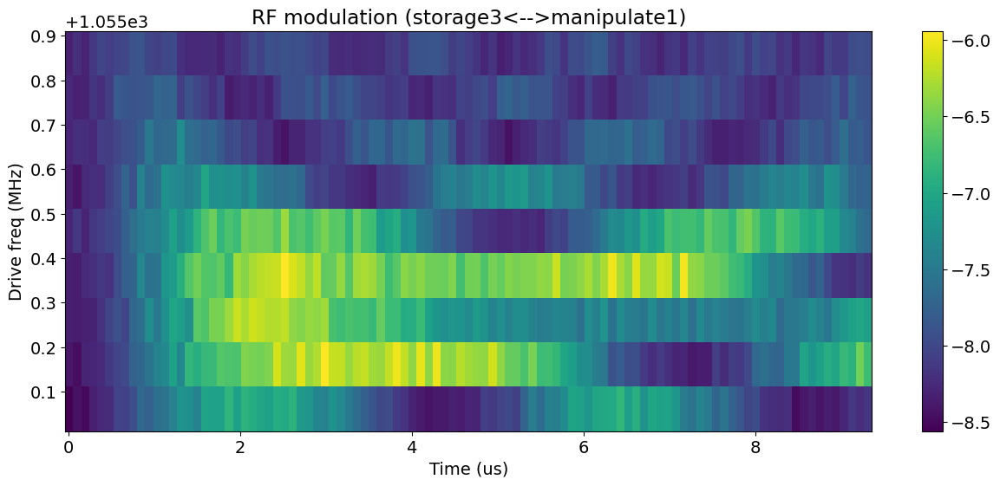

In [155]:
file_list = np.arange(0,9,1)
y_list = []
freq_list = []
name = '_rfflux_storage3_manipulate1_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF modulation (storage3<-->manipulate1)")
    

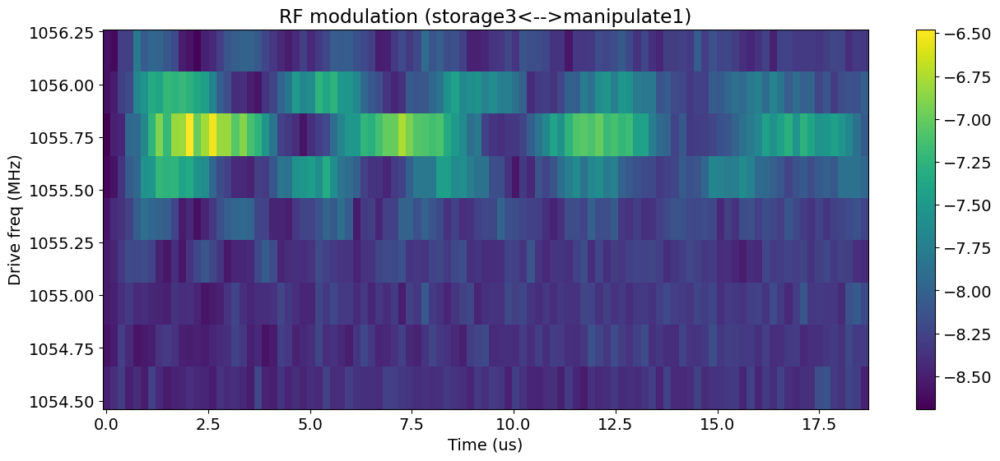

In [165]:
file_list = np.arange(13,22,1)
y_list = []
freq_list = []
name = '_rfflux_storage3_manipulate1_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF modulation (storage3<-->manipulate1)")
    

### storage 2 to manipulate1

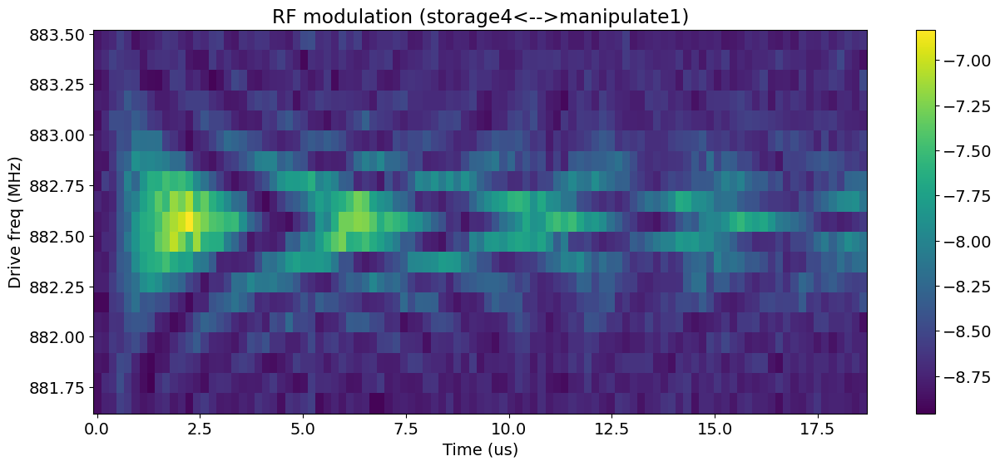

In [66]:
file_list = np.arange(0,19,1)
y_list = []
freq_list = []
name = '_rfflux_storage2_manipulate1_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF modulation (storage4<-->manipulate1)")
    

Storage1 <-> manipulate1

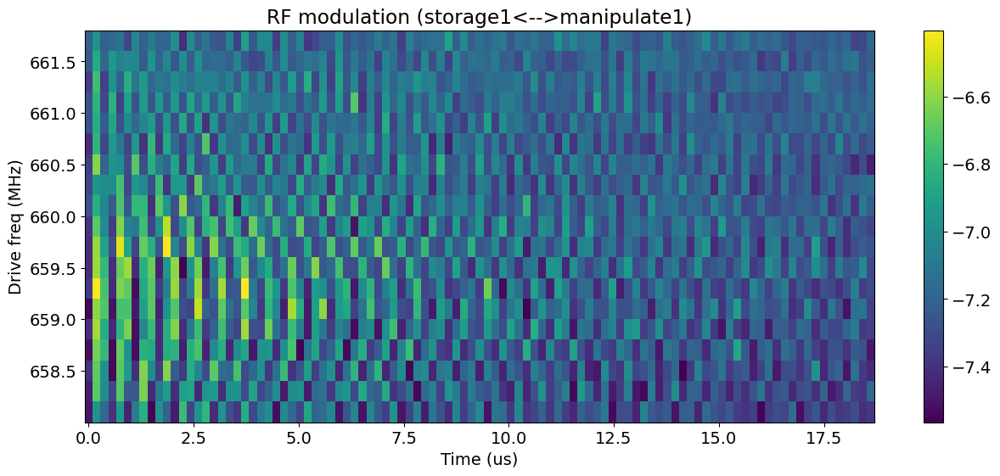

In [168]:
file_list = np.arange(0,19,1)
y_list = []
freq_list = []
name = '_rfflux_storage1_manipulate1_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF modulation (storage1<-->manipulate1)")
    

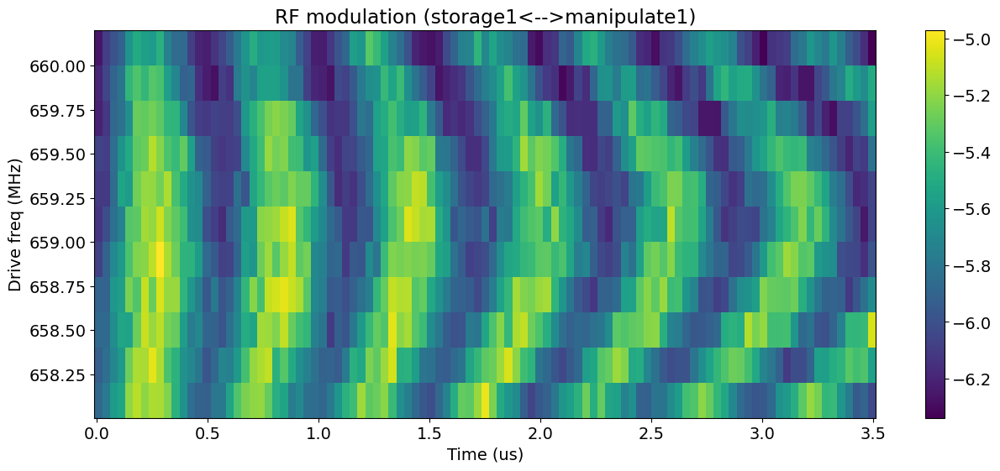

In [175]:
file_list = np.arange(20,31,1)
y_list = []
freq_list = []
name = '_rfflux_storage1_manipulate1_sweep.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['avgi']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_sideband_sweep(len_x, freq_list, np.array(y_list), hlines=None, vlines=None, title="RF modulation (storage1<-->manipulate1)")
    

# Two-tone scan of coupler

## Rd at storage 5

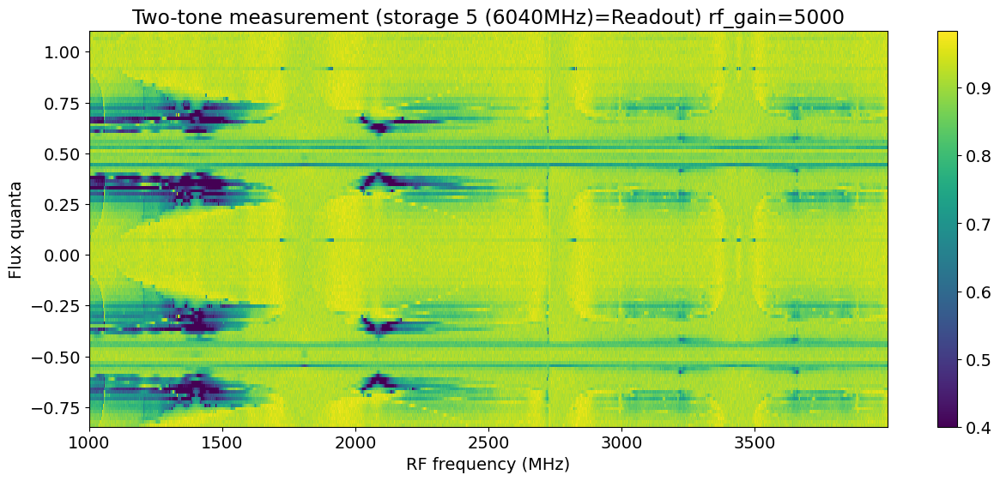

In [50]:
file_list = np.arange(0,120,1)
vary_pts = (linspace(-0.002, 0.002, 121)*1000+0.28)/2.05
y_list = []
# freq_list = []
name = '_Rd_storage5_RF_scan.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = (temp_data['amps'])
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    # freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_rfmodulation_sweep(len_x, vary_pts[0:len(y_list)], np.array(y_list), hlines=None, vlines=None, title="Two-tone measurement (storage 5 (6040MHz)=Readout) rf_gain=5000",vmin=0.4)
    

In [45]:
len_x

array([1000., 1001., 1002., ..., 3997., 3998., 3999.])

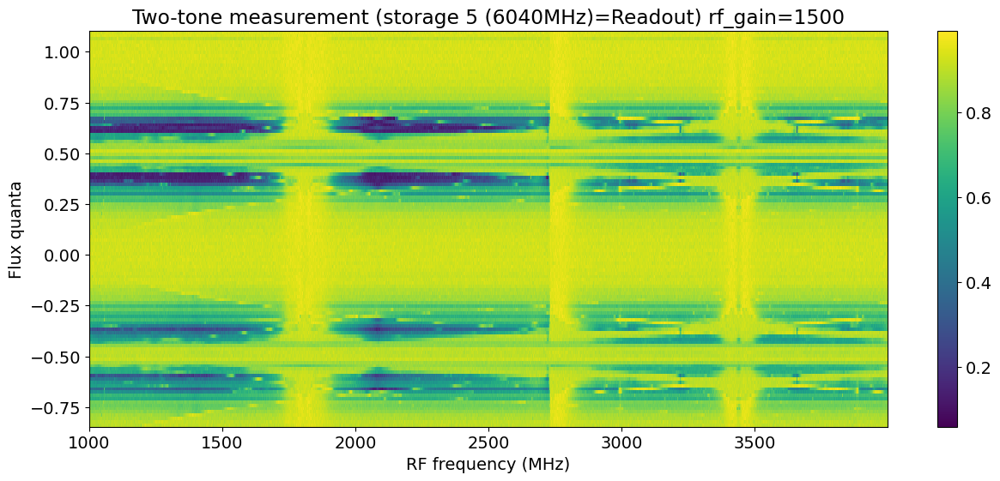

In [47]:
file_list = np.arange(121,241,1)
vary_pts = (linspace(-0.002, 0.002, 121)*1000+0.28)/2.05
y_list = []
# freq_list = []
name = '_Rd_storage5_RF_scan.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    # freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_rfmodulation_sweep(len_x, vary_pts[0:len(y_list)], np.array(y_list), hlines=None, vlines=None, title="Two-tone measurement (storage 5 (6040MHz)=Readout) rf_gain=1500",vmin=None)
    

## Rd at storage 4

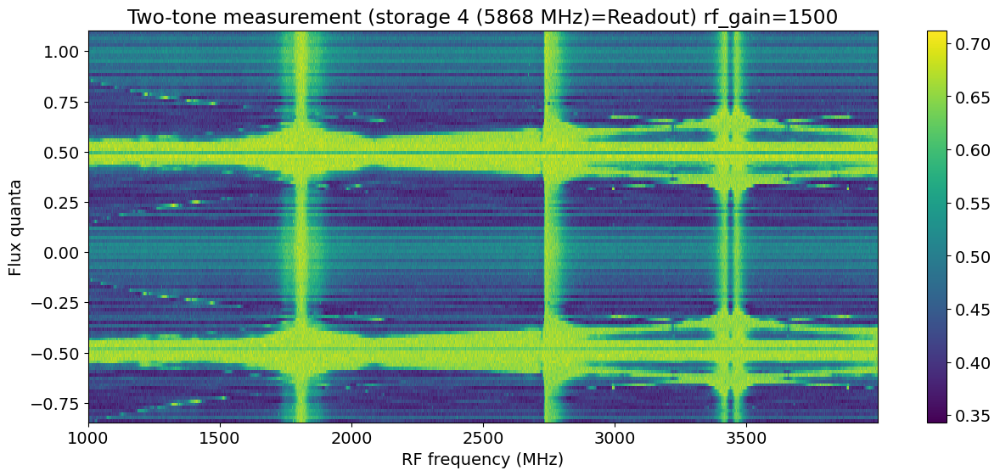

In [51]:
file_list = np.arange(0,120,1)
vary_pts = (linspace(-0.002, 0.002, 121)*1000+0.28)/2.05
y_list = []
# freq_list = []
name = '_Rd_storage4_RF_scan.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    # freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_rfmodulation_sweep(len_x, vary_pts[0:len(y_list)], np.array(y_list), hlines=None, vlines=None, title="Two-tone measurement (storage 4 (5868 MHz)=Readout) rf_gain=1500",vmax=None)
    

## Rd at storage 6

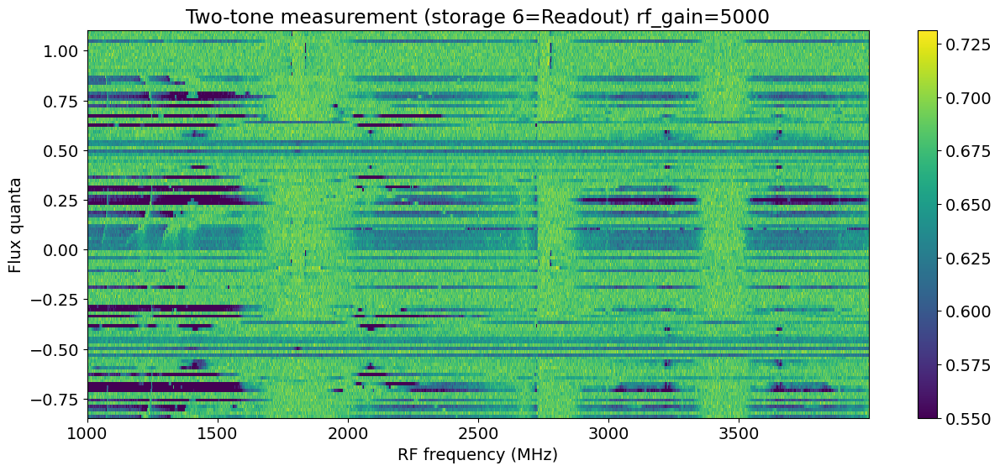

In [52]:
file_list = np.arange(0,120,1)
vary_pts = (linspace(-0.002, 0.002, 121)*1000+0.28)/2.05
y_list = []
# freq_list = []
name = '_Rd_storage6_RF_scan.h5'
for file_no in file_list:
    full_name = str(file_no).zfill(5)+name
    temp_data, attrs = prev_data(expt_path, full_name)  # ef
    signal_y = temp_data['amps']
    len_x = temp_data['xpts']
    y_list.append(signal_y)
    # freq_list.append(attrs['config']['expt']['flux_drive'][1])

plot_rfmodulation_sweep(len_x, vary_pts[0:len(y_list)], np.array(y_list), hlines=None, vlines=None, title="Two-tone measurement (storage 6=Readout) rf_gain=5000",vmin=0.55)
    

# Gain-displace fit

### Manipulate 1

#### Pulse Calibration

Found peak in amps at [MHz] 3568.372837898122, HWHM 0.5396770571872149
Found peak in I at [MHz] 3568.377750280578, HWHM 0.5713315465235453
Found peak in Q at [MHz] 3568.3347621285093, HWHM 0.5607642228377502


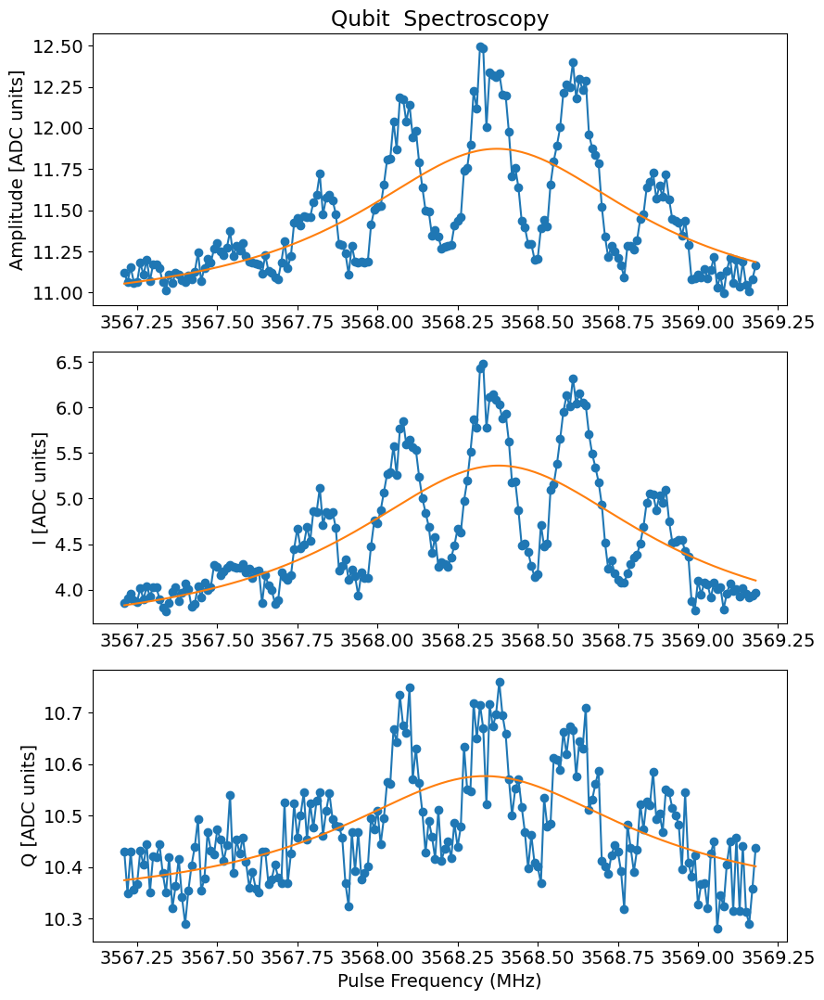

In [16]:
temp_data, attr = prev_data(expt_path, '00078_gain_displace_sweep.h5')  # |g>
plot_pulse_spectroscopy(data = temp_data)

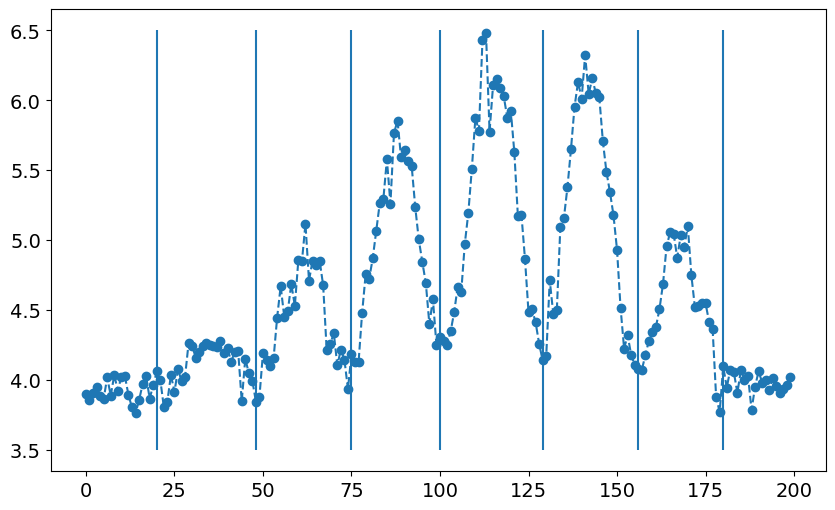

In [27]:
#markers for identifying photon peaks
temp_data, attr = prev_data(expt_path, '00078_gain_displace_sweep.h5')  # |g>

##
#1:  105 - 
idx_list = [idx for idx in range(len(temp_data['xpts']))]
plt.plot(idx_list, temp_data['avgi'], linestyle = '--', marker = 'o')
plt.vlines([20, 48, 75, 100, 129, 156, 180], 3.5, 6.5)

#### Photon Number Fitting

In [29]:
filelist = np.array(list(np.arange(66,82,1)))
filelist

array([66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81])

E:\Shared drives\multimode\Multimode\experiment\240304\data\00066_gain_displace_sweep.h5


[0.10729315694855145, 0.3219303570462182, 0.21519894702042924, -0.729834832149958, 8.133687268441482]
[0.04274500477174322, 20151.051372516966, 0.04780087546210792, 0.1673748516752011, 0.17983687207350635]
E:\Shared drives\multimode\Multimode\experiment\240304\data\00067_gain_displace_sweep.h5
[-41.177686500592365, 0.09403748233844546, 0.19356965269899126, -0.516138360463522, 8.013015621840363]
[61649.91687677132, 0.03004060266952277, 0.04923090723956275, 0.17091141157037298, 0.18167038300178256]
E:\Shared drives\multimode\Multimode\experiment\240304\data\00068_gain_displace_sweep.h5
[0.09106108651582848, 0.10759837740736, 0.1552541371264545, -0.5872585296205252, 7.880270381001957]
[0.04498284615453857, 0.03708890869900611, 0.07700887451622034, 0.1871172274736928, 0.20389501501121624]
E:\Shared drives\multimode\Multimode\experiment\240304\data\00069_gain_displace_sweep.h5
[0.060171471281147464, 0.5627281435214976, 0.28916338526343627, 1.50211550366488, 7.2641398174283465]
[0.0300187202

C:\Users\26049\AppData\Local\Temp\ipykernel_10132\1954259224.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


[0.36127488251690815, 1.1459423084485818, 2.4038486131426082, 3.1919430476589357, 2.1987989436416937]
[0.046369275991273017, 0.11556079424139569, 0.09721912292380636, 0.13020204029134108, 0.05100945558029208]
E:\Shared drives\multimode\Multimode\experiment\240304\data\00077_gain_displace_sweep.h5
[0.6827466342022852, 1.4115438343508817, 2.377471992857364, 3.0342978040572217, 1.6212687328361397]
[0.0889583563552295, 0.1593325367719444, 0.1253051027290146, 0.1917044928199653, 0.09527391324620774]
E:\Shared drives\multimode\Multimode\experiment\240304\data\00078_gain_displace_sweep.h5
[1.0532935725765402, 1.8456695532139602, 2.28680628674024, 2.4399443397465608, 1.0629385072613946]
[0.16806810624281862, 0.19739962232872155, 0.16054692927964698, 0.15371644994154288, 0.0630344720492107]
E:\Shared drives\multimode\Multimode\experiment\240304\data\00079_gain_displace_sweep.h5
[1.1498523062886774, 3.460005533150739, 2.035940248716684, 2.2286524071068445, 0.7599794940661113]
[0.1096220508787742

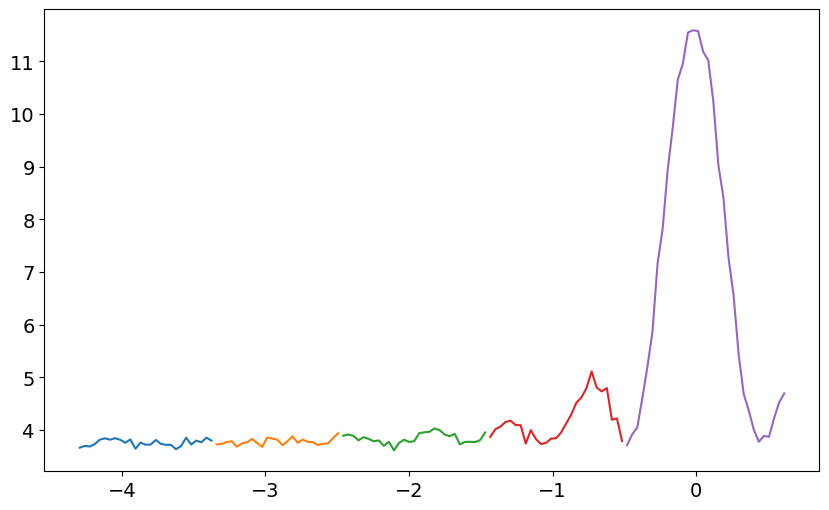

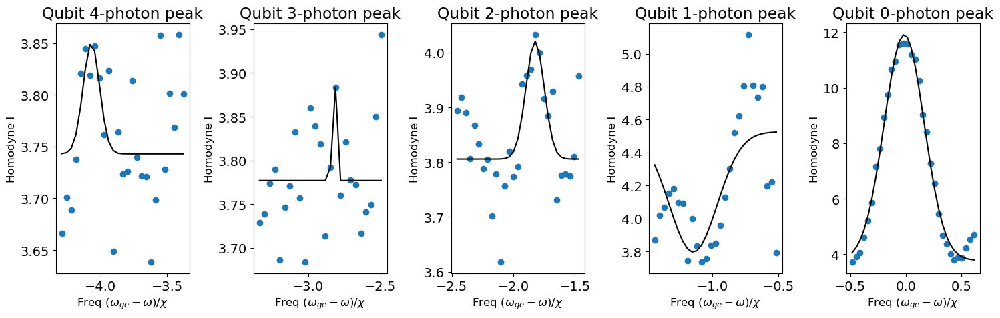

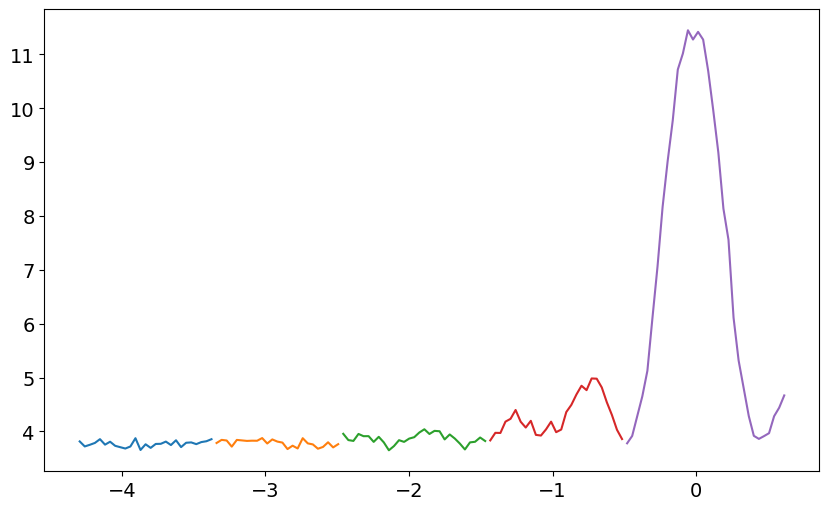

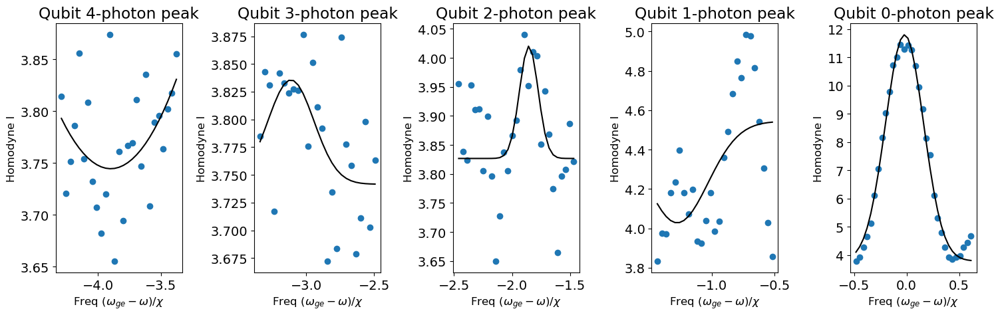

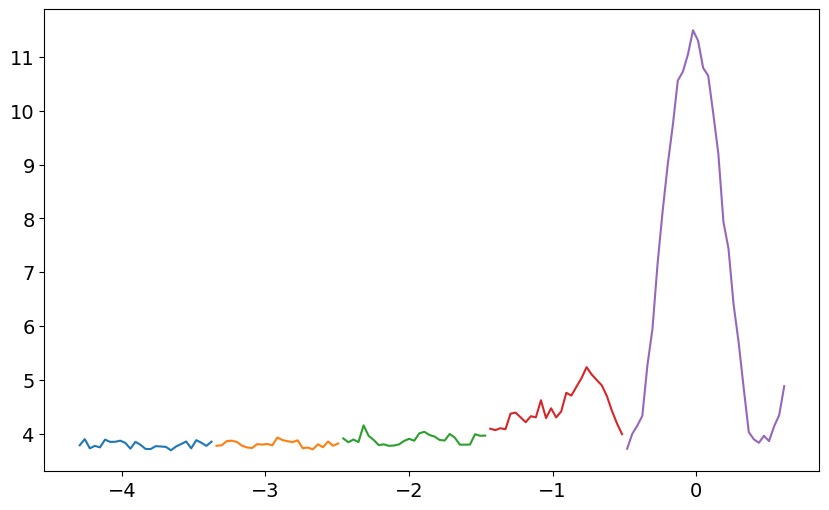

...

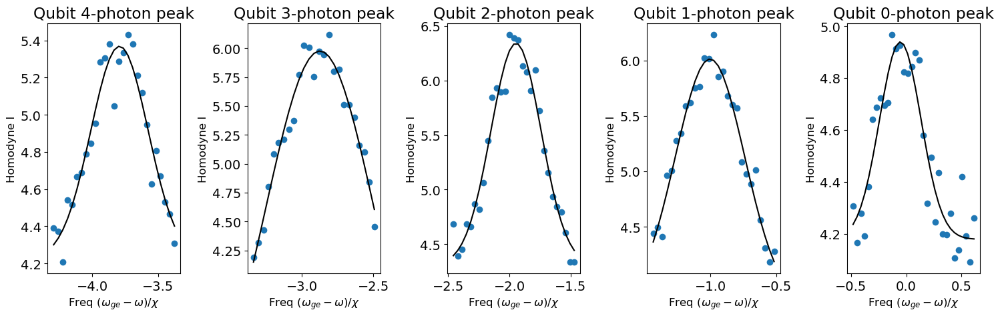

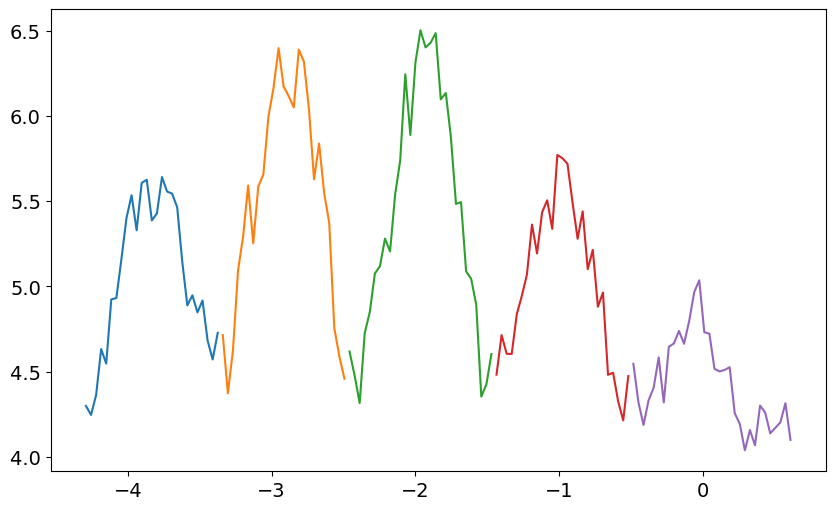

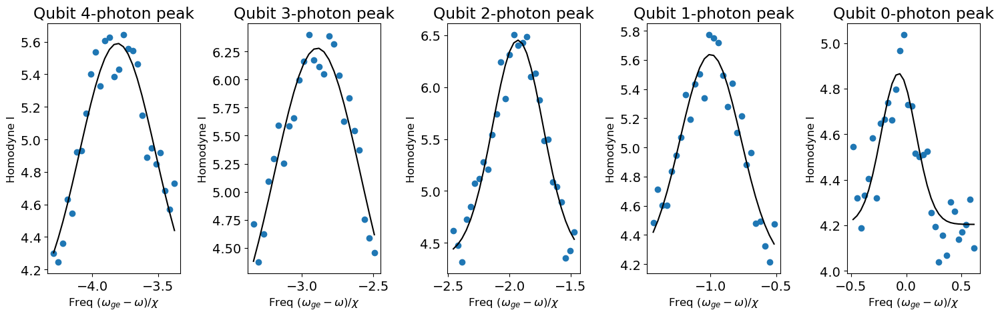

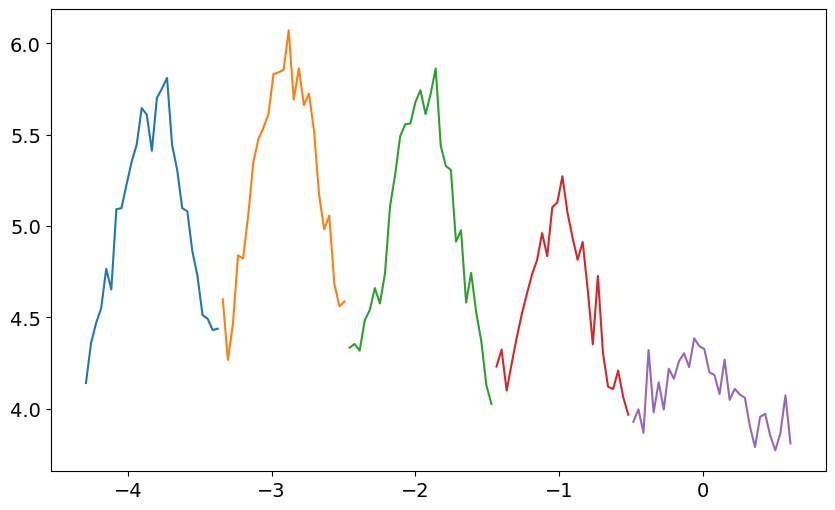

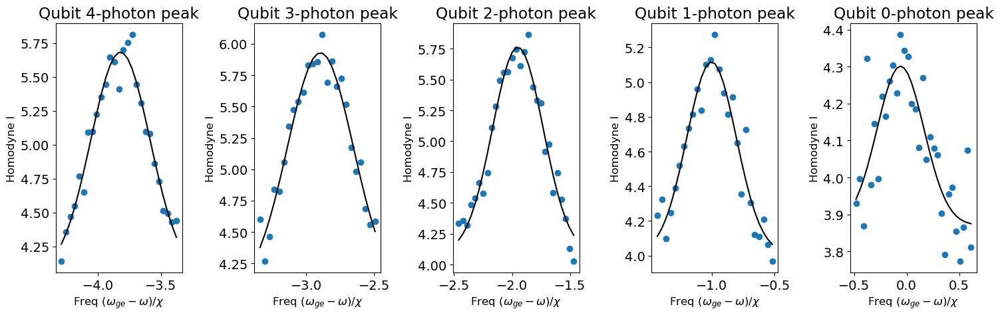

In [31]:
expt_name = 'gain_displace_sweep'
filelist = np.array(list(np.arange(66,82,1)))
#filelist = np.array([0])
gain_list = np.arange(0,1600,100)
qubit_ge = 3568.8966491011734
chi = 0.283404580997

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

peak_sweep = [] # SAVE the peak-voltage values for the STORAGE-GAIN SWEEP
freq_sweep = [] # SAVE the peak_freq values for the STORAGE-GAIN SWEEP

for ii, i in enumerate(filelist):
    filename = expt_path +'\\' + str(i).zfill(5) + "_"+expt_name.lower()+".h5"
    with File(filename,'r') as f:

        xdata = np.array(f['xpts'])
        ydata = np.array(f['avgi'])
        f.close()
    
    x_norm = []
    for ii in xdata:
        x_norm.append((ii-qubit_ge)/chi)
    x = np.array(x_norm)
    y = ydata 
    
    ## Separate the data
    separation_marker = [[48, 75], [75, 100], [100, 129], [129, 156], [156, 188]]
    phot_number = [4,3,2,1,0] # UPDATE: photon number corresponding to each window
    
    print(filename)
    if plt_data:
        plt.figure()
        for ii in separation_marker:
            plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])
    
    N=1
    p1_saved = []
    p2_saved = []
    area_total = 0
    
    fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))
    
    for ii in range(len(separation_marker)):
        xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
        ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
        fitparams = np.zeros(4)
        fitparams[0] = ynow[0]
        fitparams[1] = max(ynow)-fitparams[0]
        fitparams[2] = -(4-ii)
        fitparams[3] = 0.1
        
        " Fit the gaussian peaks "
        p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
        
        if plt_data:
            ax1 = ax[ii]
            ax1.set_title(f'Qubit {phot_number[ii]}-photon peak')
            ax1.plot(xnow, ynow, 'o', label='data')
            ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

            ax1.set_ylabel('Homodyne I', fontsize = 12)
            ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
            p1_saved.append(p1)
            p2_saved.append(p2)

            plt.tight_layout()
    
        
    peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
    print(peak_val)
    print(peak_val_err)
    # a, a_err = fitcoherentstate(peak_val)
    
    peak_sweep.append(peak_val)
    freq_sweep.append(freq_val)

peak_sweep = array(peak_sweep)
freq_sweep = array(freq_sweep)

#### Poisson Fitting

In [32]:
def Pn_poisson(x, c, n):
    alph = c * x # gain to |alpha| conversion
    Pn = alph**(2*n) * np.exp(-alph**2) / np.math.factorial(n)
    return Pn

In [33]:
P0 = peak_sweep[:,4]
P1 = peak_sweep[:,3]
P2 = peak_sweep[:,2]
P3 = peak_sweep[:,1]
P4 = peak_sweep[:,0]
Pnorm = P0[0]

In [34]:
gain_list_ = gain_list[:len(P0)]

In [35]:
"""
Poisson distrib fitting
HELPS to rescale the gain by 1/1000, dealing with larger values of x makes curve ftting harder
"""
n=0
gain_rescale = 1e3
params_p0, covs =curve_fit(lambda x,c: Pn_poisson(x,c,n), gain_list_/gain_rescale, P0/Pnorm)
V_to_alpha =  np.abs(params_p0[0]) / gain_rescale

#### Gain Alpha plot

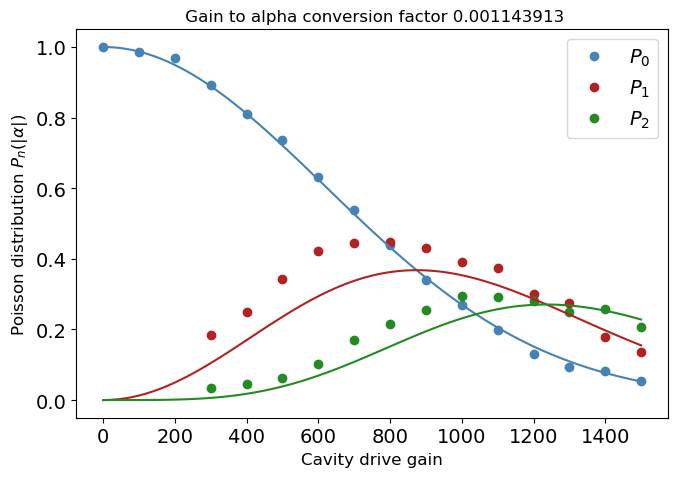

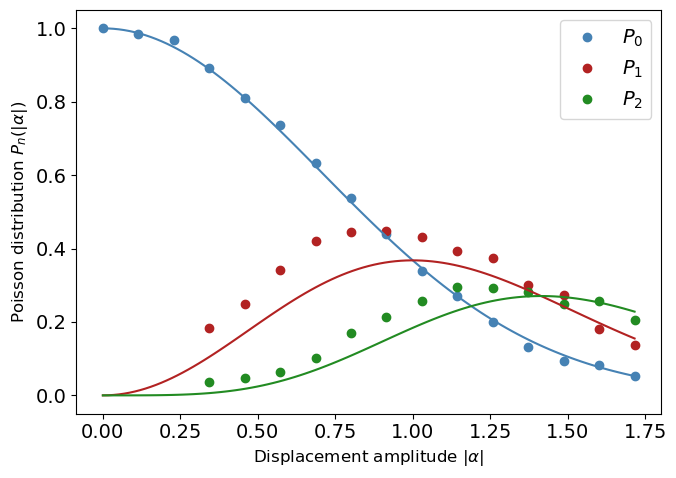

In [38]:
fig, ax = plt.subplots(figsize = [7,5])

plt.plot(gain_list_[0::], P0[0::]/Pnorm, 'o', color = 'steelblue', markersize = 6, label = r'$P_0$')
plt.plot(gain_list_[3::], P1[3::]/Pnorm, 'o', color = 'firebrick', markersize = 6, label = r'$P_1$')
plt.plot(gain_list_[3::], P2[3::]/Pnorm, 'o', color = 'forestgreen', markersize = 6, label = r'$P_2$')
# plt.plot(gain_list[5::], P3[5::]/Pnorm, 'o', color = 'orange', markersize = 6, label = r'$P_3$')
# plt.plot(gain_list[5::], P4[5::]/Pnorm, 'o', color = 'indigo', markersize = 6, label = r'$P_4$')

plt.xlabel(r'Cavity drive gain', fontsize = 12)
plt.ylabel(r'Poisson distribution $P_n(|\alpha|)$', fontsize = 12)

plt.legend()


gain_fit = np.linspace(gain_list[0], gain_list[-1], 101)
P0_fit = Pn_poisson(gain_fit, V_to_alpha, n=0)
P1_fit = Pn_poisson(gain_fit, V_to_alpha, n=1)
P2_fit = Pn_poisson(gain_fit, V_to_alpha, n=2)
# P3_fit = Pn_poisson(gain_fit, V_to_alpha, n=3)
# P4_fit = Pn_poisson(gain_fit, V_to_alpha, n=4)

plt.plot(gain_fit, P0_fit, '-', color = 'steelblue')
plt.plot(gain_fit, P1_fit, '-', color = 'firebrick')
plt.plot(gain_fit, P2_fit, '-', color = 'forestgreen')
# plt.plot(gain_fit, P3_fit, '-', color = 'orange')
# plt.plot(gain_fit, P4_fit, '-', color = 'indigo')

plt.title(f' Gain to alpha conversion factor {round(V_to_alpha,9)}', fontsize = 12)
plt.tight_layout()

fig, ax = plt.subplots(figsize = [7,5])

plt.plot(gain_list_[0::]*V_to_alpha, P0[0::]/Pnorm, 'o', color = 'steelblue', markersize = 6, label = r'$P_0$')
plt.plot(gain_list_[3::]*V_to_alpha, P1[3::]/Pnorm, 'o', color = 'firebrick', markersize = 6, label = r'$P_1$')
plt.plot(gain_list_[3::]*V_to_alpha, P2[3::]/Pnorm, 'o', color = 'forestgreen', markersize = 6, label = r'$P_2$')
# plt.plot(gain_list[5::]*V_to_alpha, P3[5::]/Pnorm, 'o', color = 'orange', markersize = 6, label = r'$P_3$')
# plt.plot(gain_list[5::]*V_to_alpha, P4[5::]/Pnorm, 'o', color = 'indigo', markersize = 6, label = r'$P_4$')

plt.plot(gain_fit*V_to_alpha, P0_fit, '-', color = 'steelblue')
plt.plot(gain_fit*V_to_alpha, P1_fit, '-', color = 'firebrick')
plt.plot(gain_fit*V_to_alpha, P2_fit, '-', color = 'forestgreen')
# plt.plot(gain_fit*V_to_alpha, P3_fit, '-', color = 'orange')
# plt.plot(gain_fit*V_to_alpha, P4_fit, '-', color = 'indigo')

plt.xlabel(r'Displacement amplitude $|\alpha|$', fontsize = 12)
plt.ylabel(r'Poisson distribution $P_n(|\alpha|)$', fontsize = 12)

plt.legend()
plt.tight_layout()

In [72]:
peak_sweep

array([[ 1.39695141e-01, -5.20929339e+02,  1.32988231e-01,
         2.27264998e-01,  6.41746113e+00],
       [-1.59338990e+02,  8.89345016e-02, -9.18647676e-02,
         1.21914103e+00,  6.41419066e+00]])

In [73]:
freq_sweep

array([[-4.03796952e+00, -3.14846314e+00, -2.03648016e+00,
        -9.77414509e-01, -1.74163385e-03],
       [-4.27997488e+00, -2.94941066e+00, -2.27373956e+00,
        -1.07119242e+00, -1.04693846e-03]])

H:\Shared drives\multimode\Multimode\experiment\231001\data\00019_qubit_spectroscopy_qubit0.h5
H:\Shared drives\multimode\Multimode\experiment\231001\data\00020_qubit_spectroscopy_qubit0.h5
H:\Shared drives\multimode\Multimode\experiment\231001\data\00021_qubit_spectroscopy_qubit0.h5
H:\Shared drives\multimode\Multimode\experiment\231001\data\00022_qubit_spectroscopy_qubit0.h5
H:\Shared drives\multimode\Multimode\experiment\231001\data\00023_qubit_spectroscopy_qubit0.h5
H:\Shared drives\multimode\Multimode\experiment\231001\data\00024_qubit_spectroscopy_qubit0.h5


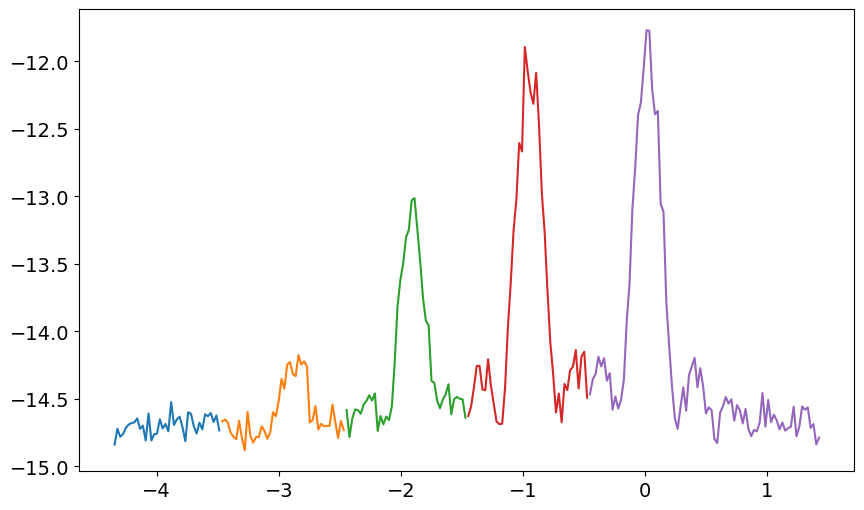

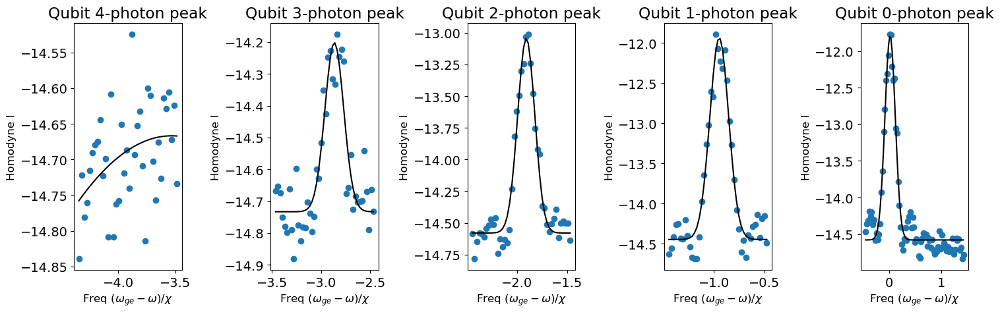

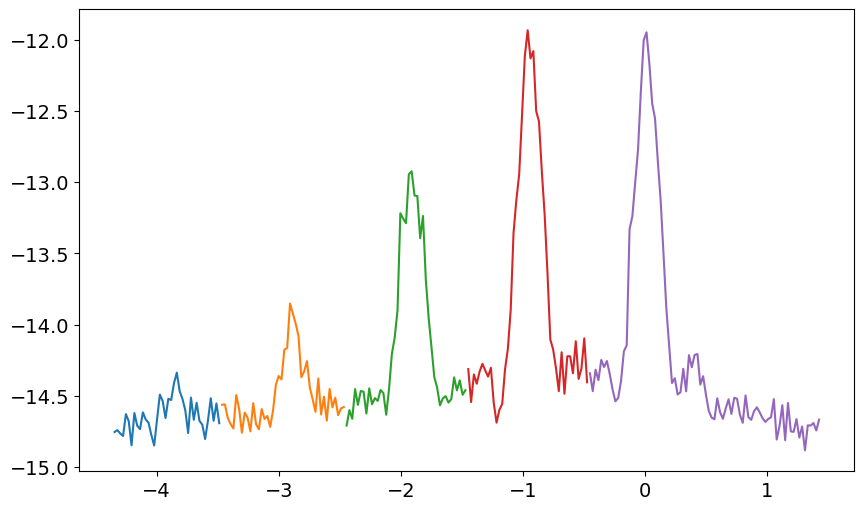

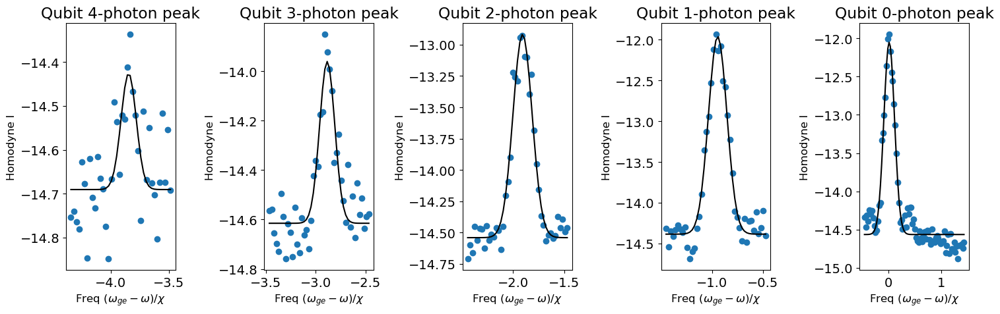

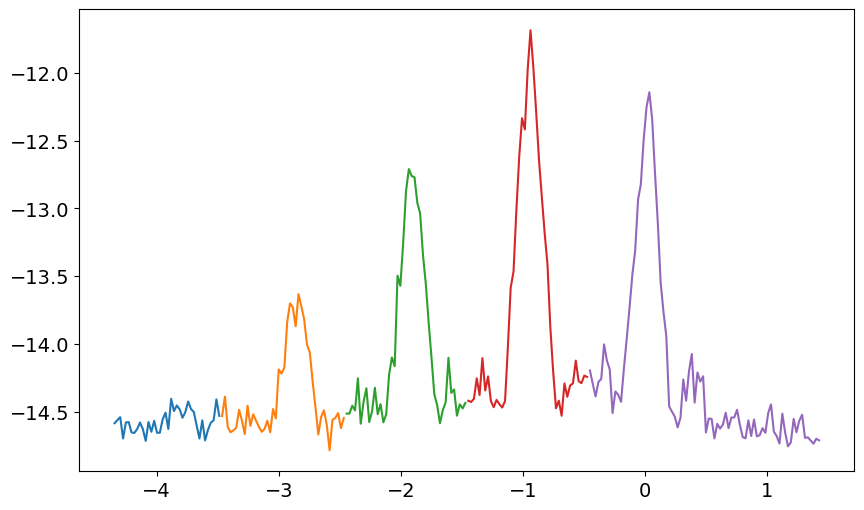

...

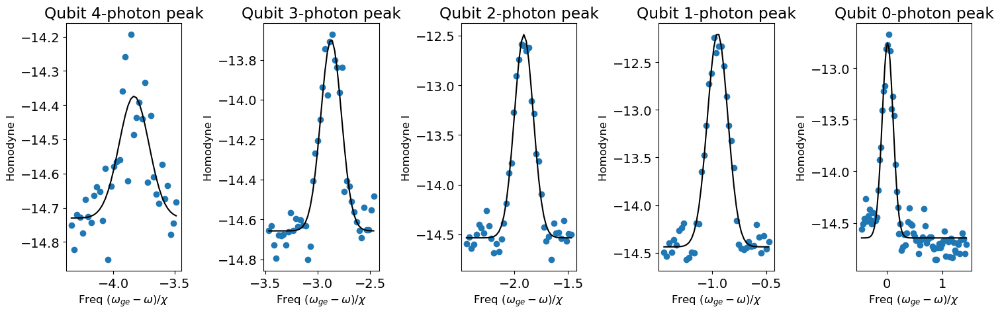

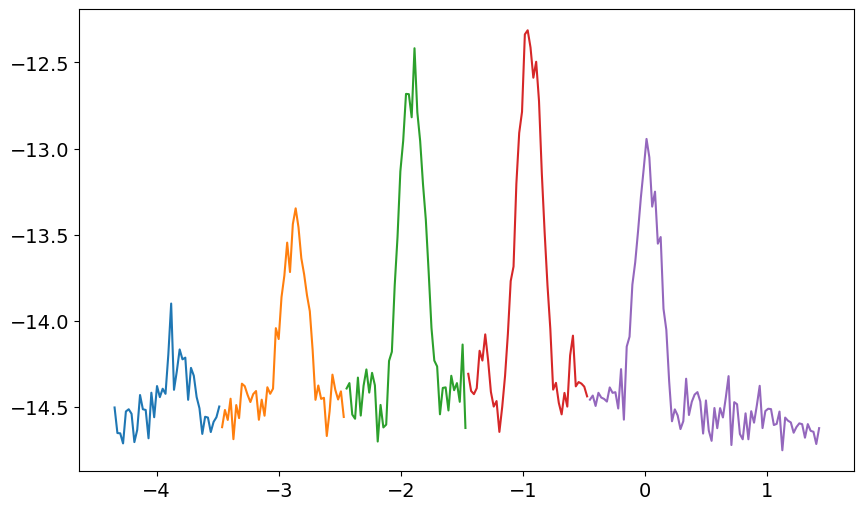

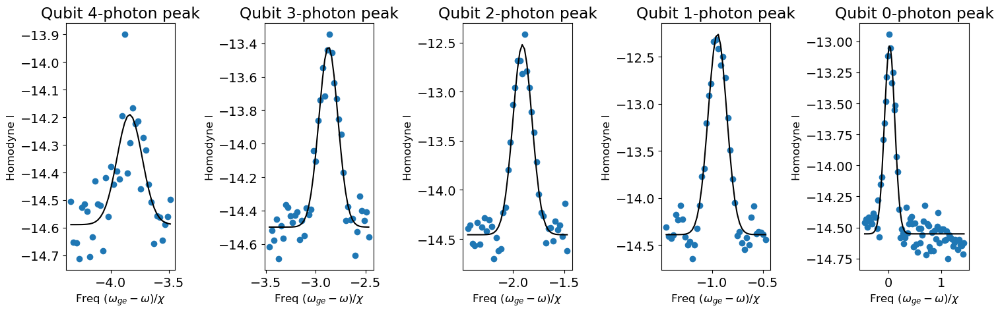

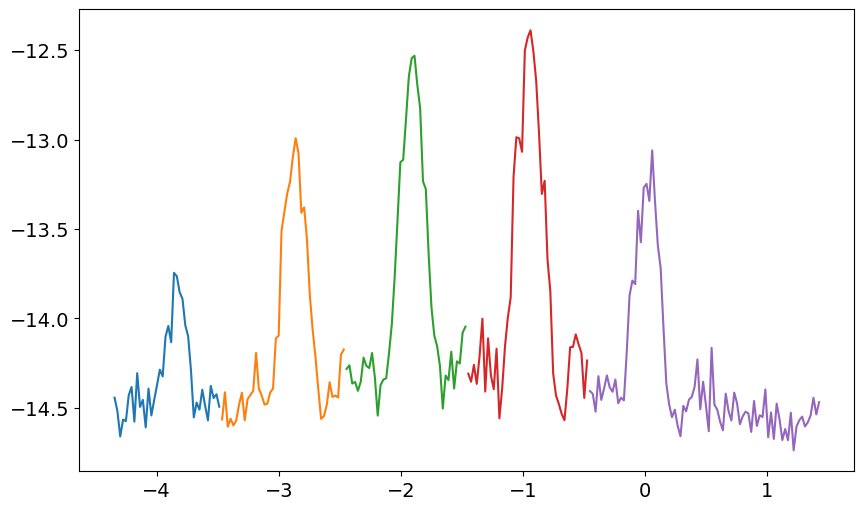

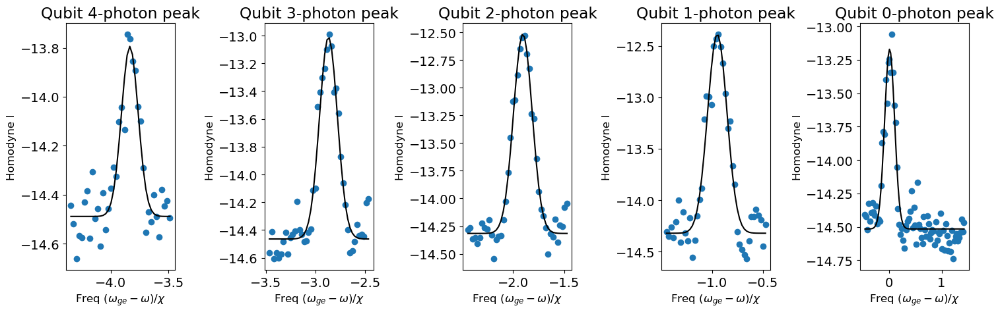

In [108]:
expt_name = 'qubit_spectroscopy_qubit0'
filelist = np.arange(19,25,1)
gain_list = np.arange(4200,6000,300)
qubit_ge = 3577.5799499337704
chi = 0.34527994145901175

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

peak_sweep = [] # SAVE the peak-voltage values for the STORAGE-GAIN SWEEP
freq_sweep = [] # SAVE the peak_freq values for the STORAGE-GAIN SWEEP

for ii, i in enumerate(filelist):
    filename = expt_path +'\\' + str(i).zfill(5) + "_"+expt_name.lower()+".h5"
    with File(filename,'r') as f:

        xdata = np.array(f['xpts'])
        ydata = np.array(f['avgi'])
        f.close()
    
    x_norm = []
    for ii in xdata:
        x_norm.append((ii-qubit_ge)/chi)
    x = np.array(x_norm)
    y = ydata 
    
    ## Separate the data
    separation_marker = [[0,38],[38,82],[82,125],[125,168],[168,len(x)]]
    phot_number = [4,3,2,1,0] # UPDATE: photon number corresponding to each window
    
    print(filename)
    if plt_data:
        plt.figure()
        for ii in separation_marker:
            plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])
    
    N=1
    p1_saved = []
    p2_saved = []
    area_total = 0
    
    fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))
    
    for ii in range(len(separation_marker)):
        xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
        ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
        fitparams = np.zeros(4)
        fitparams[0] = ynow[0]
        fitparams[1] = max(ynow)-fitparams[0]
        fitparams[2] = -(4-ii)
        fitparams[3] = 0.4
        
        " Fit the gaussian peaks "
        p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
        
        if plt_data:
            ax1 = ax[ii]
            ax1.set_title(f'Qubit {phot_number[ii]}-photon peak')
            ax1.plot(xnow, ynow, 'o', label='data')
            ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

            ax1.set_ylabel('Homodyne I', fontsize = 12)
            ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
            p1_saved.append(p1)
            p2_saved.append(p2)

            plt.tight_layout()
    
        
    peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
    # a, a_err = fitcoherentstate(peak_val)
    
    peak_sweep.append(peak_val)
    freq_sweep.append(freq_val)

peak_sweep = array(peak_sweep)
freq_sweep = array(freq_sweep)

In [56]:
peak_sweep

array([[ 3.31759497e-01,  5.79381197e-02, -5.77684135e-01,
        -2.09905335e-01,  5.84437498e+00],
       [ 4.74017777e-02,  2.74278553e-02, -8.71937975e-02,
        -5.49768668e-01,  5.80969895e+00],
       [-3.29200441e-01,  2.24131790e+02, -7.42117202e-02,
         3.35500031e+00,  5.65059294e+00],
       [-1.15770642e-01,  2.61186034e-03,  1.35234235e-01,
         1.27802739e+00,  5.36584046e+00],
       [ 5.21526647e-02, -5.71718107e-02,  2.77946038e+02,
         1.52183342e+00,  4.93897170e+00],
       [-1.87186139e-01, -6.97223650e-02,  1.55526025e+00,
         1.81139696e+00,  4.54786446e+00],
       [ 4.24963791e+01, -9.59624109e-02,  3.15582973e+00,
         2.12890143e+00,  4.03410961e+00],
       [ 6.44827904e-02,  3.24248421e-01,  9.21043528e-01,
         2.37681130e+00,  3.55535722e+00],
       [ 6.15473452e-02,  2.52855726e-01,  1.13432494e+00,
         2.54738736e+00,  3.04982513e+00],
       [ 1.12810419e-01,  4.21468715e-01,  1.36882890e+00,
         2.55757848e+00

In [109]:
peak_sweep = np.array([[ 3.31759497e-01,  5.79381197e-02, 0,
        0,  5.84437498e+00],
       [ 4.74017777e-02,  2.74278553e-02, -8.71937975e-02,
        0,  5.80969895e+00],
       [-3.29200441e-01,  2.24131790e+02, 0,
         0.47424595792131796,  5.65059294e+00],
       [-1.15770642e-01,  2.61186034e-03,  1.35234235e-01,
         1.27802739e+00,  5.36584046e+00],
       [ 5.21526647e-02, -5.71718107e-02,  0.16001314540437456, 1.5223640472443825, 4.938971700358692],
       [-0.18718613937795875, -0.03702533306055449, 0.3148499680273578, 1.775879519385384, 4.542198123967164],
       [ 42.496379114614584, 0.11119161194348108, 0.5562444176542239, 2.061290192029684, 4.031606230392952],
       [ 6.44827904e-02,  3.24248421e-01,  9.21043528e-01,
         2.37681130e+00,  3.55535722e+00],
       [ 6.15473452e-02,  2.52855726e-01,  1.13432494e+00,
         2.54738736e+00,  3.04982513e+00],
       [ 1.12810419e-01,  4.21468715e-01,  1.36882890e+00,
         2.55757848e+00,  2.42080547e+00],
       [ 1.96948279e-01,  9.62761169e-01,  1.42206399e+00,
         2.51282133e+00,  1.95942823e+00],
       [ 2.94365996e-01,  8.73927429e-01,  1.78649250e+00,
         2.29965775e+00,  1.55787953e+00],
       [ 3.51310701e-01,  8.67973286e-01,  1.84506391e+00,
         1.91124991e+00,  1.15616919e+00],
       [ 6.53272428e-01,  1.21385502e+00,  1.83768331e+00,
         1.61890848e+00,  8.13869521e-01],
       [ 5.98599641e-01,  1.20344685e+00,  1.62051886e+00,
         1.27612948e+00,  5.79822220e-01],
       [ 7.29778463e-01,  1.25961386e+00,  1.48749907e+00,
         1.34192414e+00,  5.02264920e-01],
       [ 8.49202041e-01,  1.27805726e+00,  1.59861656e+00,
         9.35017828e-01,  3.17651912e-01],
       [ 9.64398381e-01,  1.31158939e+00,  1.10342767e+00,
         7.20644827e-01,  2.39556271e-01],
       [ 7.70635491e-01,  1.27398029e+00,  1.02520201e+00,
         5.04980144e-01,  1.65686491e-01],
       [ 6.96808317e-01,  1.08186320e+00,  5.85143194e-01,
         4.12957599e-01, -5.11702280e-01]])

In [110]:
print(freq_sweep[-1][-1]-freq_sweep[-1][-2])
print(freq_sweep[-1][-2]-freq_sweep[-1][-3])
print(freq_sweep[-1][-3]-freq_sweep[-1][-4])
print(freq_sweep[-1][-4]-freq_sweep[-1][-5])

1.0064573327317035
1.0014470117231085
0.754027738375314
1.418400224153554


### plot gain vs. alpha

In [127]:
def Pn_poisson(x, c, n):
    alph = c * x # gain to |alpha| conversion
    Pn = alph**(2*n) * np.exp(-alph**2) / np.math.factorial(n)
    return Pn

In [112]:
P0 = peak_sweep[:,4]
P1 = peak_sweep[:,3]
P2 = peak_sweep[:,2]
P3 = peak_sweep[:,1]
P4 = peak_sweep[:,0]
Pnorm = P0[1]

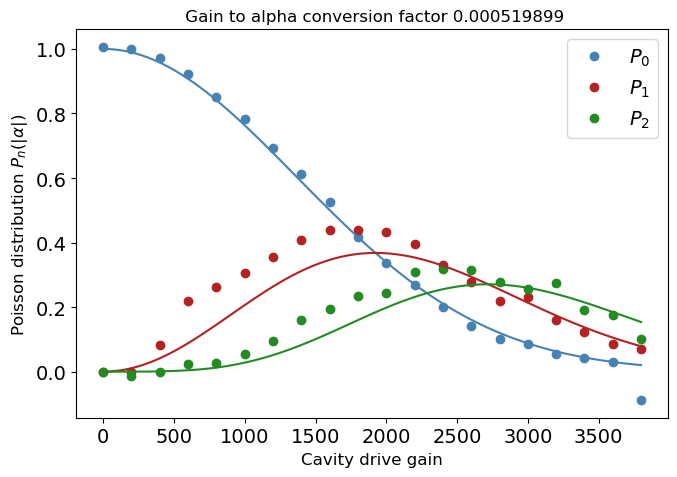

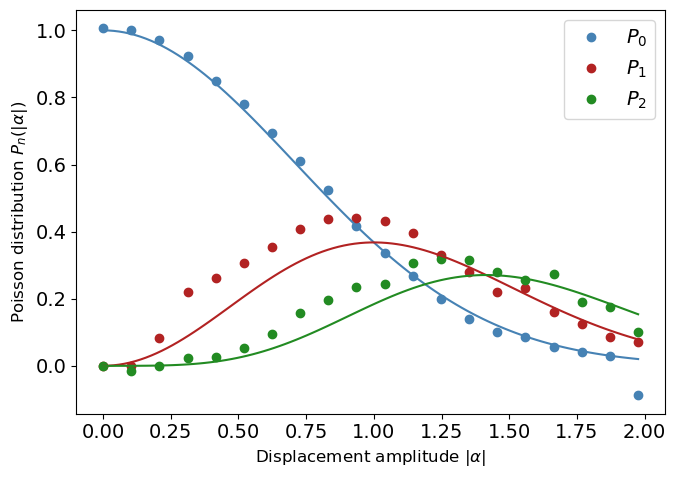

In [113]:
fig, ax = plt.subplots(figsize = [7,5])

plt.plot(gain_list[0::], P0[0::]/Pnorm, 'o', color = 'steelblue', markersize = 6, label = r'$P_0$')
plt.plot(gain_list[0::], P1[0::]/Pnorm, 'o', color = 'firebrick', markersize = 6, label = r'$P_1$')
plt.plot(gain_list[0::], P2[0::]/Pnorm, 'o', color = 'forestgreen', markersize = 6, label = r'$P_2$')
# plt.plot(gain_list[5::], P3[5::]/Pnorm, 'o', color = 'orange', markersize = 6, label = r'$P_3$')
# plt.plot(gain_list[5::], P4[5::]/Pnorm, 'o', color = 'indigo', markersize = 6, label = r'$P_4$')

plt.xlabel(r'Cavity drive gain', fontsize = 12)
plt.ylabel(r'Poisson distribution $P_n(|\alpha|)$', fontsize = 12)

plt.legend()

"""
Poisson distrib fitting
HELPS to rescale the gain by 1/1000, dealing with larger values of x makes curve ftting harder
"""
n=0
gain_rescale = 1e3
params_p0, covs =curve_fit(lambda x,c: Pn_poisson(x,c,n), gain_list/gain_rescale, P0/Pnorm)

V_to_alpha =  np.abs(params_p0[0]) / gain_rescale
gain_fit = np.linspace(gain_list[0], gain_list[-1], 101)
P0_fit = Pn_poisson(gain_fit, V_to_alpha, n=0)
P1_fit = Pn_poisson(gain_fit, V_to_alpha, n=1)
P2_fit = Pn_poisson(gain_fit, V_to_alpha, n=2)
# P3_fit = Pn_poisson(gain_fit, V_to_alpha, n=3)
# P4_fit = Pn_poisson(gain_fit, V_to_alpha, n=4)

plt.plot(gain_fit, P0_fit, '-', color = 'steelblue')
plt.plot(gain_fit, P1_fit, '-', color = 'firebrick')
plt.plot(gain_fit, P2_fit, '-', color = 'forestgreen')
# plt.plot(gain_fit, P3_fit, '-', color = 'orange')
# plt.plot(gain_fit, P4_fit, '-', color = 'indigo')

plt.title(f' Gain to alpha conversion factor {round(V_to_alpha,9)}', fontsize = 12)
plt.tight_layout()

fig, ax = plt.subplots(figsize = [7,5])

plt.plot(gain_list[0::]*V_to_alpha, P0[0::]/Pnorm, 'o', color = 'steelblue', markersize = 6, label = r'$P_0$')
plt.plot(gain_list[0::]*V_to_alpha, P1[0::]/Pnorm, 'o', color = 'firebrick', markersize = 6, label = r'$P_1$')
plt.plot(gain_list[0::]*V_to_alpha, P2[0::]/Pnorm, 'o', color = 'forestgreen', markersize = 6, label = r'$P_2$')
# plt.plot(gain_list[5::]*V_to_alpha, P3[5::]/Pnorm, 'o', color = 'orange', markersize = 6, label = r'$P_3$')
# plt.plot(gain_list[5::]*V_to_alpha, P4[5::]/Pnorm, 'o', color = 'indigo', markersize = 6, label = r'$P_4$')

plt.plot(gain_fit*V_to_alpha, P0_fit, '-', color = 'steelblue')
plt.plot(gain_fit*V_to_alpha, P1_fit, '-', color = 'firebrick')
plt.plot(gain_fit*V_to_alpha, P2_fit, '-', color = 'forestgreen')
# plt.plot(gain_fit*V_to_alpha, P3_fit, '-', color = 'orange')
# plt.plot(gain_fit*V_to_alpha, P4_fit, '-', color = 'indigo')

plt.xlabel(r'Displacement amplitude $|\alpha|$', fontsize = 12)
plt.ylabel(r'Poisson distribution $P_n(|\alpha|)$', fontsize = 12)

plt.legend()
plt.tight_layout()

### trial 2

E:\Shared drives\multimode\Multimode\experiment\240205\data\00127_qubit_spectroscopy_qubit0.h5
[0.03647912639361555, 0.03751899399229318, 0.04451791914112176, -0.2925356246112027, 5.692399757890713]
[0.0336209529741639, 0.05161047579767265, 0.032518728964947854, 0.6837141733750289, 0.09664720227885633]
E:\Shared drives\multimode\Multimode\experiment\240205\data\00128_qubit_spectroscopy_qubit0.h5
[0.09462860095621595, -0.08091811724025308, 0.07357751402062723, -0.2224377518844053, 5.692674365092893]
[0.0491570298797445, 0.08018937988112326, 0.030873354419845, 0.32025572357560916, 0.08742700100513866]
E:\Shared drives\multimode\Multimode\experiment\240205\data\00129_qubit_spectroscopy_qubit0.h5
[451363074685353.9, 0.09107822348647387, 0.07760759853552573, 0.7691082550740509, 5.483964614356381]
[2.74376157655743e+18, 0.046217992547223634, 0.05973547068779539, 0.3519865519484329, 0.09127226456887386]
E:\Shared drives\multimode\Multimode\experiment\240205\data\00130_qubit_spectroscopy_qubit

C:\Users\26049\AppData\Local\Temp\ipykernel_13440\1244705965.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


[0.2384845728339648, 730.2063078464712, 1.481641894600681, 2.1708565852354744, 1.521112330808849]
[0.023723897841103066, 338889.5985073228, 0.05451688098479887, 0.06543028961117217, 0.0436653927840715]
E:\Shared drives\multimode\Multimode\experiment\240205\data\00138_qubit_spectroscopy_qubit0.h5
[0.37355853650994686, 1.5605747133959673, 1.609047848109226, 1.8303452978276444, 1.076199355377947]
[0.02649718657252311, 0.4558795354321769, 0.07022341898298098, 0.0504612756032288, 0.03555824340374982]
E:\Shared drives\multimode\Multimode\experiment\240205\data\00139_qubit_spectroscopy_qubit0.h5
[0.5498020843976085, 1.1954130238574368, 1.5591344765303035, 1.6135904838312816, 0.7990385815011487]
[0.03683569549638936, 0.14170909959206937, 0.04268990355131159, 0.05402284447388477, 0.03307841416624108]
E:\Shared drives\multimode\Multimode\experiment\240205\data\00140_qubit_spectroscopy_qubit0.h5
[0.6359890815158099, 1.2557975735313973, 1.5472103623254887, 1.2213698294762716, 0.5834430949240563]
[

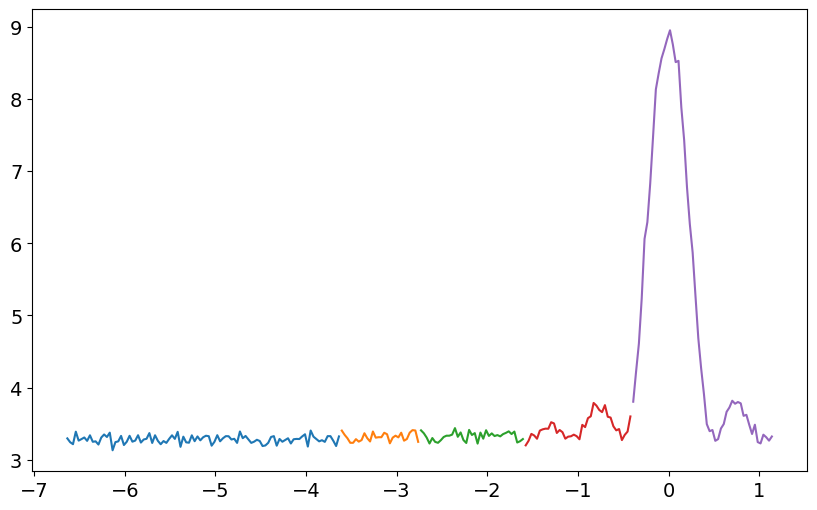

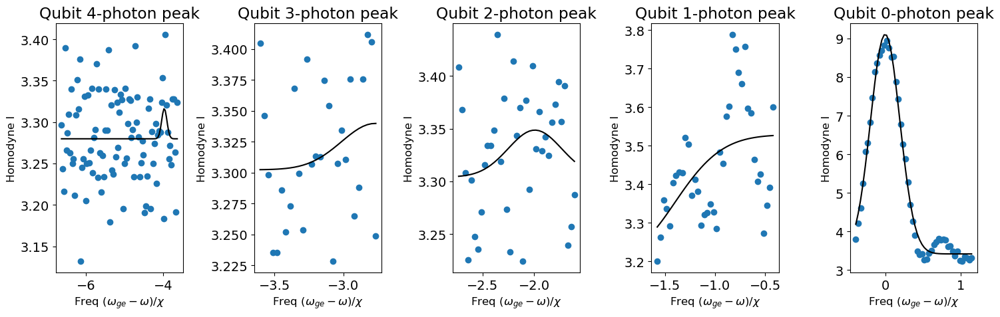

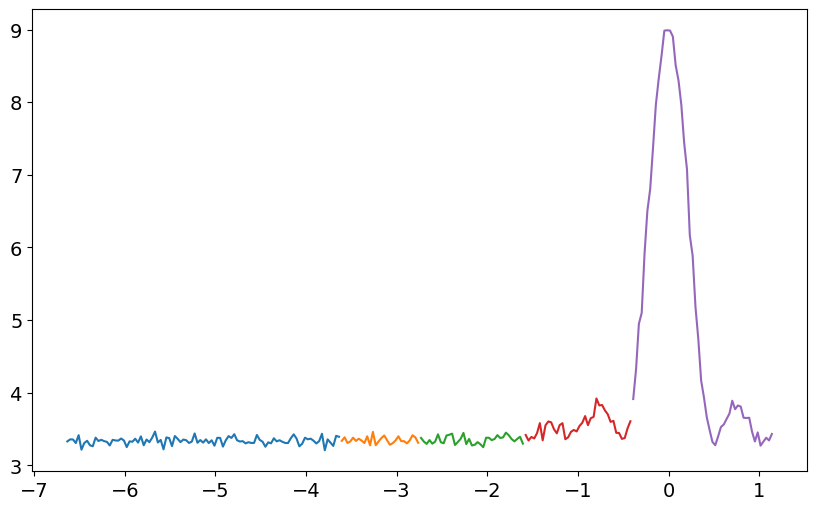

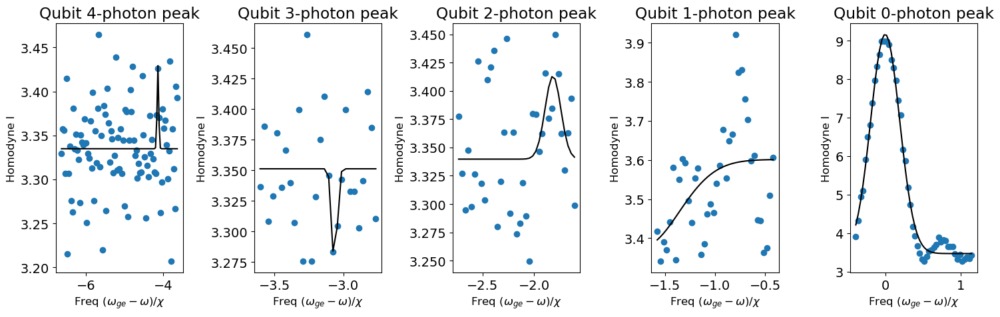

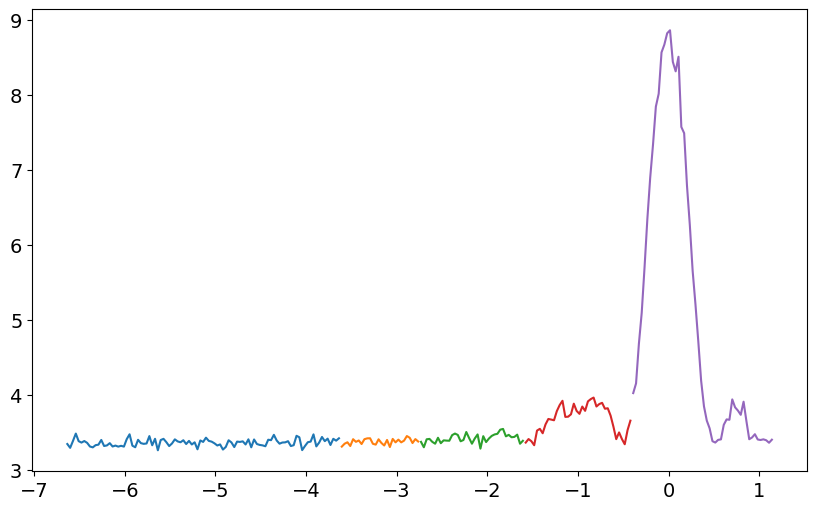

...

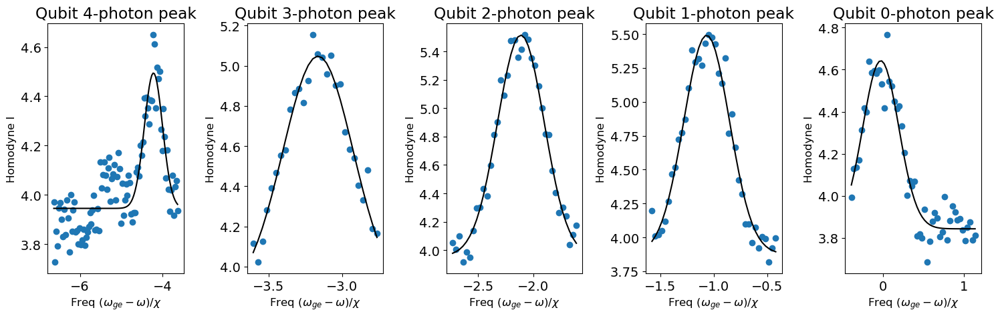

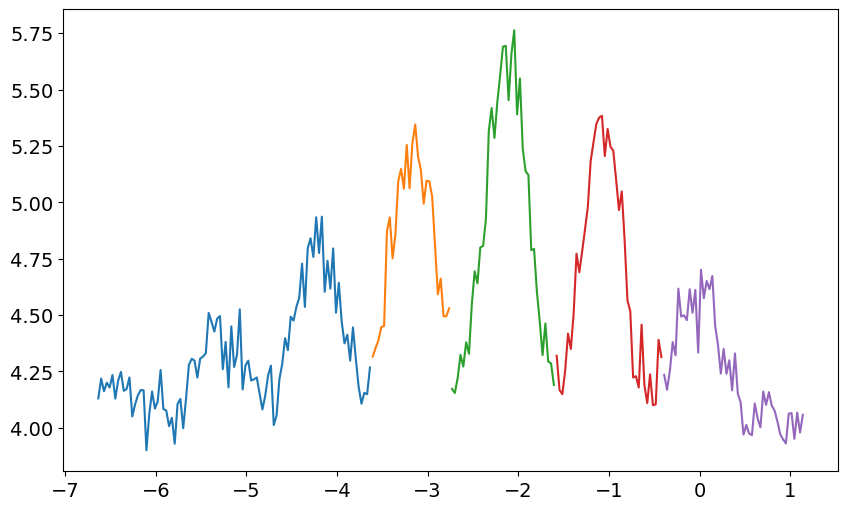

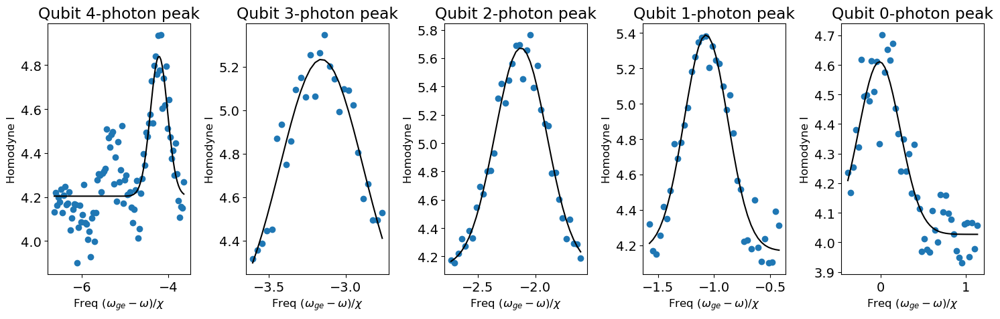

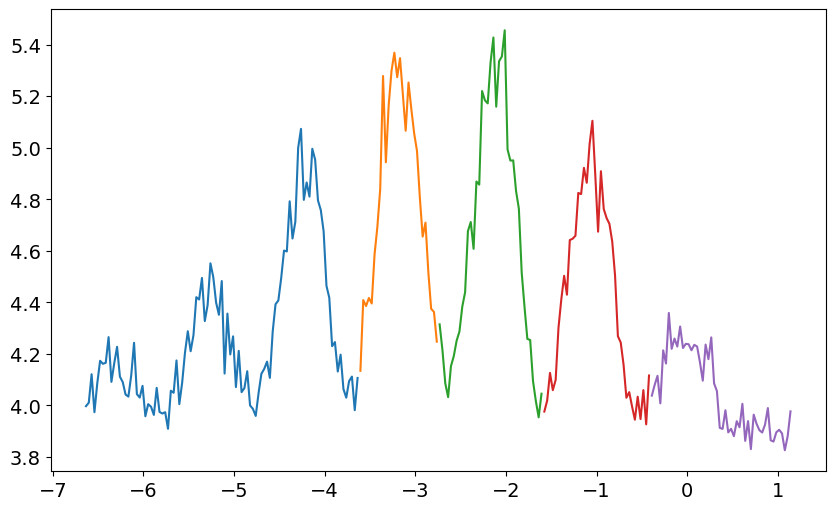

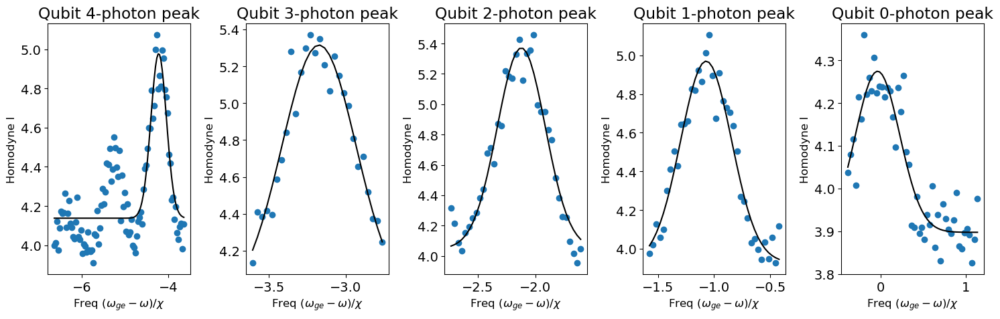

In [194]:
expt_name = 'qubit_spectroscopy_qubit0'
filelist = np.arange(127,142,1)
# filelist = np.array([111])
gain_list = np.arange(0,1500,100)
# gain_list = np.arange(0,4000,200)
qubit_ge = 3568.7888873838688
chi = 0.2562553500034

plt_data = True # Set to False if you don't want to plot stuff, to make the processing go faster when going over many files

peak_sweep = [] # SAVE the peak-voltage values for the STORAGE-GAIN SWEEP
freq_sweep = [] # SAVE the peak_freq values for the STORAGE-GAIN SWEEP

for ii, i in enumerate(filelist):
    filename = expt_path +'\\' + str(i).zfill(5) + "_"+expt_name.lower()+".h5"
    with File(filename,'r') as f:

        xdata = np.array(f['xpts'])
        ydata = np.array(f['avgi'])
        f.close()
    
    x_norm = []
    for ii in xdata:
        x_norm.append((ii-qubit_ge)/chi)
    x = np.array(x_norm)
    y = ydata 
    
    ## Separate the data
    separation_marker = [[0,97],[97,125],[125,162],[162,200],[200,len(x)]]
    phot_number = [4,3,2,1,0] # UPDATE: photon number corresponding to each window
    
    print(filename)
    if plt_data:
        plt.figure()
        for ii in separation_marker:
            plt.plot(x[ii[0]:ii[1]],y[ii[0]:ii[1]])
    
    N=1
    p1_saved = []
    p2_saved = []
    area_total = 0
    
    fig, ax = plt.subplots(1, len(separation_marker), figsize = (15,5))
    
    for ii in range(len(separation_marker)):
        xnow = x[separation_marker[ii][0]:separation_marker[ii][1]]
        ynow = y[separation_marker[ii][0]:separation_marker[ii][1]]
        fitparams = np.zeros(4)
        fitparams[0] = ynow[0]
        fitparams[1] = max(ynow)-fitparams[0]
        fitparams[2] = -(4-ii)
        fitparams[3] = 0.1
        
        " Fit the gaussian peaks "
        p1, p2 = fitgausssum_with_baseline(xnow, ynow, fitparams=fitparams)
        
        if plt_data:
            ax1 = ax[ii]
            ax1.set_title(f'Qubit {phot_number[ii]}-photon peak')
            ax1.plot(xnow, ynow, 'o', label='data')
            ax1.plot(xnow, gaussfuncsum_with_baseline(xnow, *p1), 'k', label='fit')

            ax1.set_ylabel('Homodyne I', fontsize = 12)
            ax1.set_xlabel(r'Freq $(\omega_{ge}-\omega) / \chi $', fontsize = 12)
            p1_saved.append(p1)
            p2_saved.append(p2)

            plt.tight_layout()
    
        
    peak_val, freq_val, peak_val_err, freq_val_err = fitamp_new(p1_saved, p2_saved)    
    print(peak_val)
    print(peak_val_err)
    # a, a_err = fitcoherentstate(peak_val)
    
    peak_sweep.append(peak_val)
    freq_sweep.append(freq_val)

peak_sweep = array(peak_sweep)
freq_sweep = array(freq_sweep)

In [195]:
peak_sweep

array([[ 3.64791264e-02,  3.75189940e-02,  4.45179191e-02,
        -2.92535625e-01,  5.69239976e+00],
       [ 9.46286010e-02, -8.09181172e-02,  7.35775140e-02,
        -2.22437752e-01,  5.69267437e+00],
       [ 4.51363075e+14,  9.10782235e-02,  7.76075985e-02,
         7.69108255e-01,  5.48396461e+00],
       [ 4.87006716e-02,  4.37736826e-01,  8.15116266e-02,
         9.54264819e-01,  5.16930946e+00],
       [ 4.50168191e-02,  1.45973362e-01,  2.74910209e-01,
         1.28060154e+00,  4.64620904e+00],
       [ 3.49871831e-02,  4.03561992e-02,  3.14126069e-01,
         1.66406890e+00,  4.13831248e+00],
       [-2.10378570e-02,  1.27582361e-01,  6.94544938e-01,
         2.03698532e+00,  3.57497412e+00],
       [ 4.29737685e-02,  6.10161553e+02,  8.77504954e-01,
         2.19777761e+00,  3.01984387e+00],
       [ 7.94050499e-02,  7.20279416e-01,  1.15185257e+00,
         2.25386293e+00,  2.44415241e+00],
       [ 1.28696052e-01,  1.01933021e+00,  1.35328836e+00,
         2.23889736e+00

In [196]:
peak_sweep = np.array([[ 3.64791264e-02,  3.75189940e-02,  4.45179191e-02,
        -2.92535625e-01,  5.69239976e+00],
       [ 9.46286010e-02, -8.09181172e-02,  7.35775140e-02,
        -2.22437752e-01,  5.69267437e+00],
       [ 4.51363075e+14,  9.10782235e-02,  7.76075985e-02,
         7.69108255e-01,  5.48396461e+00],
       [ 4.87006716e-02,  4.37736826e-01,  8.15116266e-02,
         9.54264819e-01,  5.16930946e+00],
       [ 4.50168191e-02,  1.45973362e-01,  2.74910209e-01,
         1.28060154e+00,  4.64620904e+00],
       [ 3.49871831e-02,  4.03561992e-02,  3.14126069e-01,
         1.66406890e+00,  4.13831248e+00],
       [-2.10378570e-02,  1.27582361e-01,  6.94544938e-01,
         2.03698532e+00,  3.57497412e+00],
       [ 4.29737685e-02,  6.10161553e+02,  8.77504954e-01,
         2.19777761e+00,  3.01984387e+00],
       [ 7.94050499e-02,  7.20279416e-01,  1.15185257e+00,
         2.25386293e+00,  2.44415241e+00],
       [ 1.28696052e-01,  1.01933021e+00,  1.35328836e+00,
         2.23889736e+00,  1.96912465e+00],
       [ 2.38484573e-01,  7.30206308e+02,  1.48164189e+00,
         2.17085659e+00,  1.52111233e+00],
       [ 3.73558537e-01,  1.56057471e+00,  1.60904785e+00,
         1.83034530e+00,  1.07619936e+00],
       [ 5.49802084e-01,  1.19541302e+00,  1.55913448e+00,
         1.61359048e+00,  7.99038582e-01],
       [ 6.35989082e-01,  1.25579757e+00,  1.54721036e+00,
         1.22136983e+00,  5.83443095e-01],
       [ 8.41327074e-01,  1.39618250e+00,  1.32497307e+00,
         1.04201002e+00,  3.76822305e-01]])

### plot gain vs. alpha

In [197]:
P0 = peak_sweep[:,4]
P1 = peak_sweep[:,3]
P2 = peak_sweep[:,2]
P3 = peak_sweep[:,1]
P4 = peak_sweep[:,0]
Pnorm = P0[1]

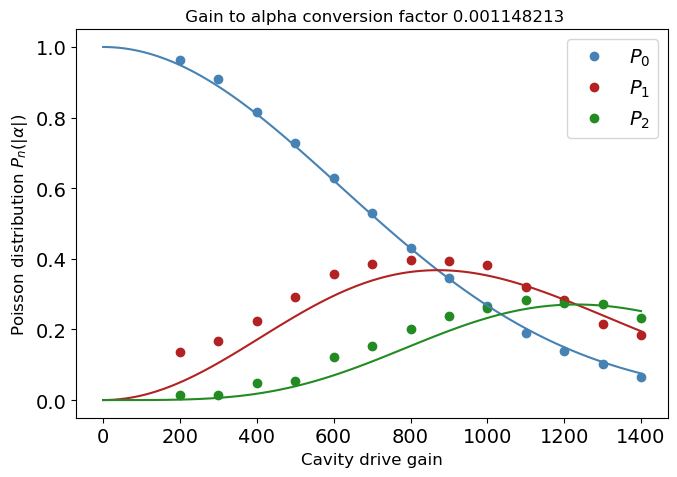

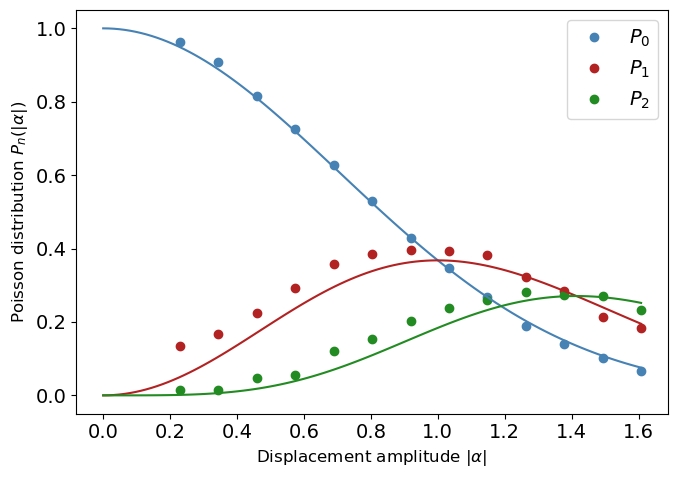

In [198]:
fig, ax = plt.subplots(figsize = [7,5])

plt.plot(gain_list[2::], P0[2::]/Pnorm, 'o', color = 'steelblue', markersize = 6, label = r'$P_0$')
plt.plot(gain_list[2::], P1[2::]/Pnorm, 'o', color = 'firebrick', markersize = 6, label = r'$P_1$')
plt.plot(gain_list[2::], P2[2::]/Pnorm, 'o', color = 'forestgreen', markersize = 6, label = r'$P_2$')
# plt.plot(gain_list[5::], P3[5::]/Pnorm, 'o', color = 'orange', markersize = 6, label = r'$P_3$')
# plt.plot(gain_list[5::], P4[5::]/Pnorm, 'o', color = 'indigo', markersize = 6, label = r'$P_4$')

plt.xlabel(r'Cavity drive gain', fontsize = 12)
plt.ylabel(r'Poisson distribution $P_n(|\alpha|)$', fontsize = 12)

plt.legend()

"""
Poisson distrib fitting
HELPS to rescale the gain by 1/1000, dealing with larger values of x makes curve ftting harder
"""
n=0
gain_rescale = 1e3
params_p0, covs =curve_fit(lambda x,c: Pn_poisson(x,c,n), gain_list/gain_rescale, P0/Pnorm)

V_to_alpha =  np.abs(params_p0[0]) / gain_rescale
gain_fit = np.linspace(gain_list[0], gain_list[-1], 101)
P0_fit = Pn_poisson(gain_fit, V_to_alpha, n=0)
P1_fit = Pn_poisson(gain_fit, V_to_alpha, n=1)
P2_fit = Pn_poisson(gain_fit, V_to_alpha, n=2)
# P3_fit = Pn_poisson(gain_fit, V_to_alpha, n=3)
# P4_fit = Pn_poisson(gain_fit, V_to_alpha, n=4)

plt.plot(gain_fit, P0_fit, '-', color = 'steelblue')
plt.plot(gain_fit, P1_fit, '-', color = 'firebrick')
plt.plot(gain_fit, P2_fit, '-', color = 'forestgreen')
# plt.plot(gain_fit, P3_fit, '-', color = 'orange')
# plt.plot(gain_fit, P4_fit, '-', color = 'indigo')

plt.title(f' Gain to alpha conversion factor {round(V_to_alpha,9)}', fontsize = 12)
plt.tight_layout()

fig, ax = plt.subplots(figsize = [7,5])

plt.plot(gain_list[2::]*V_to_alpha, P0[2::]/Pnorm, 'o', color = 'steelblue', markersize = 6, label = r'$P_0$')
plt.plot(gain_list[2::]*V_to_alpha, P1[2::]/Pnorm, 'o', color = 'firebrick', markersize = 6, label = r'$P_1$')
plt.plot(gain_list[2::]*V_to_alpha, P2[2::]/Pnorm, 'o', color = 'forestgreen', markersize = 6, label = r'$P_2$')
# plt.plot(gain_list[5::]*V_to_alpha, P3[5::]/Pnorm, 'o', color = 'orange', markersize = 6, label = r'$P_3$')
# plt.plot(gain_list[5::]*V_to_alpha, P4[5::]/Pnorm, 'o', color = 'indigo', markersize = 6, label = r'$P_4$')

plt.plot(gain_fit*V_to_alpha, P0_fit, '-', color = 'steelblue')
plt.plot(gain_fit*V_to_alpha, P1_fit, '-', color = 'firebrick')
plt.plot(gain_fit*V_to_alpha, P2_fit, '-', color = 'forestgreen')
# plt.plot(gain_fit*V_to_alpha, P3_fit, '-', color = 'orange')
# plt.plot(gain_fit*V_to_alpha, P4_fit, '-', color = 'indigo')

plt.xlabel(r'Displacement amplitude $|\alpha|$', fontsize = 12)
plt.ylabel(r'Poisson distribution $P_n(|\alpha|)$', fontsize = 12)

plt.legend()
plt.tight_layout()

# ECD

### Manipulate 1

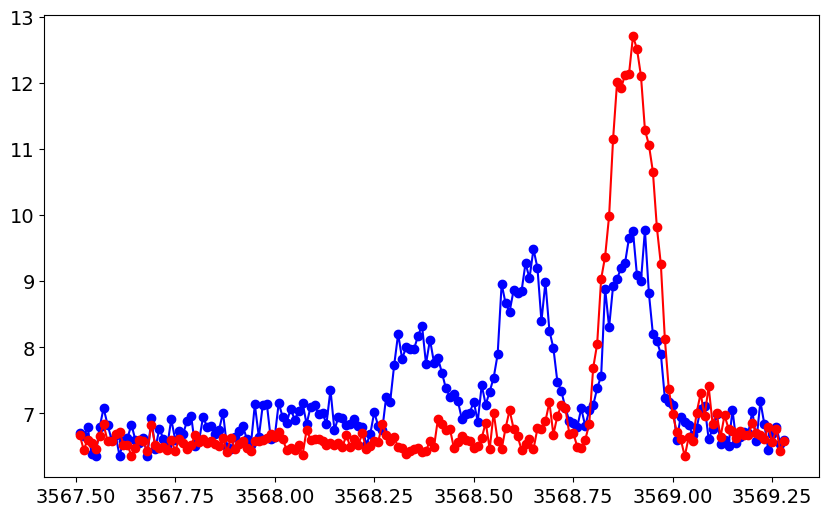

In [54]:
temp_data1, attr1 = prev_data(expt_path, '00035_ECDExperiment.h5')  # |g>
temp_data2, attr2 = prev_data(expt_path, '00037_ECDExperiment.h5')  # |g>
xpts1 = temp_data1['xpts'][1:-1]
xpts2 = temp_data2['xpts'][1:-1]
plt.plot(xpts1, temp_data1["avgi"][1:-1],'o-', color='b')
plt.plot(xpts2, temp_data2["avgi"][1:-1],'o-', color='r')


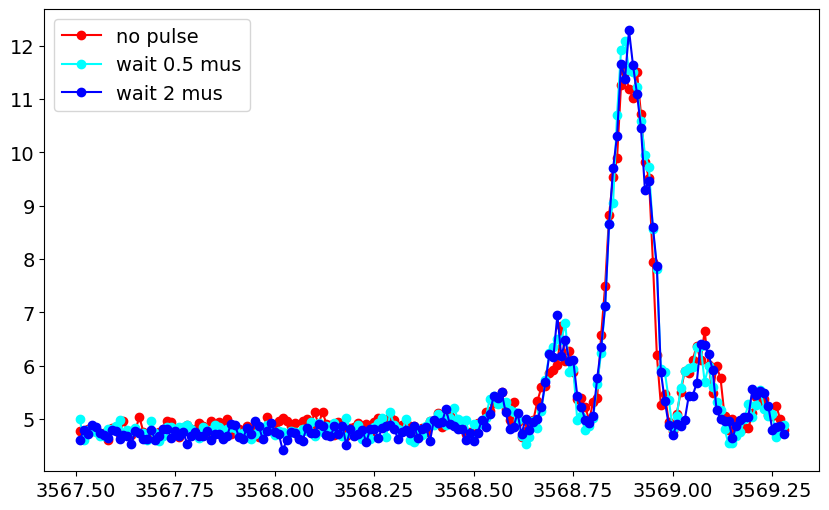

In [56]:
temp_data1, attr1 = prev_data(expt_path, '00049_ECDExperiment.h5')  # |g>
temp_data5, attr5 = prev_data(expt_path, '00051_ECDExperiment.h5')  # |g>
temp_data6, attr6 = prev_data(expt_path, '00052_ECDExperiment.h5')  # |g>
temp_data2, attr2 = prev_data(expt_path, '00047_ECDExperiment.h5')  # |g>
temp_data3, attr3 = prev_data(expt_path, '00048_ECDExperiment.h5')  # |g>
temp_data4, attr4 = prev_data(expt_path, '00050_ECDExperiment.h5')  # |g>
xpts1 = temp_data1['xpts'][1:-1]
xpts2 = temp_data2['xpts'][1:-1]
plt.plot(xpts1, temp_data6["avgi"][1:-1],'o-', color='red', label = 'no pulse')
plt.plot(xpts1, temp_data5["avgi"][1:-1],'o-', color='cyan', label = 'wait 0.5 mus')
plt.plot(xpts1, temp_data1["avgi"][1:-1],'o-', color='b', label = 'wait 2 mus')
# plt.plot(xpts2, temp_data2["avgi"][1:-1],'o-', color='r', label = 'coherent state a = 1.5 + 1.5j')
# plt.plot(xpts2, temp_data4["avgi"][1:-1],'o-', color='black', label = 'coherent state a = 1.5 + 1.5j, wait 1mus')
# plt.plot(xpts2, temp_data3["avgi"][1:-1],'o-', color='g', label = 'coherent state a = 1.5 + 1.5j, wait 3mus')
plt.legend()

Found peak in amps at [MHz] 3568.7189371599184, HWHM 0.41110002540475016
Found peak in I at [MHz] 3568.704340149007, HWHM 0.5169184841463714
Found peak in Q at [MHz] 3567.640987456452, HWHM 0.00995112891478475


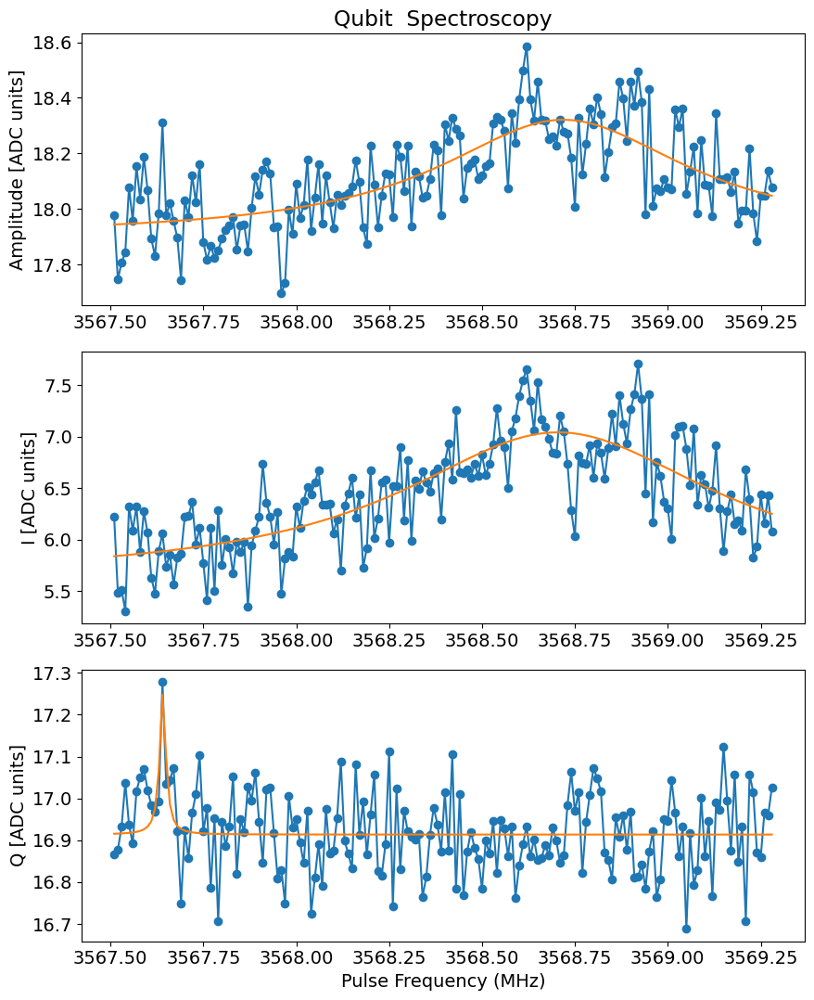

In [77]:
temp_data, attr = prev_data(expt_path, '00070_ECDExperiment.h5')  # |g>
plot_pulse_spectroscopy(data = temp_data)


Found peak in amps at [MHz] 3568.496152986567, HWHM 0.2847108471160313
Found peak in I at [MHz] 3568.878897829511, HWHM 0.1855984159110282
Found peak in Q at [MHz] 3568.870561203871, HWHM 0.1865455270195955


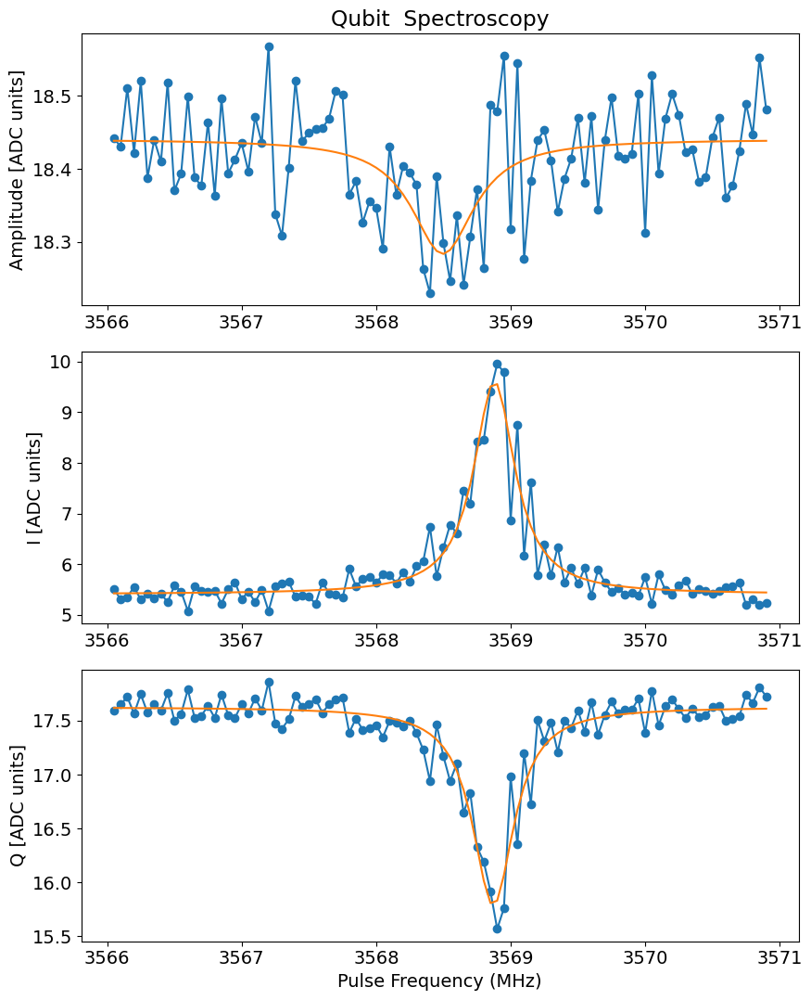

In [127]:

temp_data, attr = prev_data(expt_path, '00005_PulseProbeSpectroscopyExperiment.h5')  # |g>
plot_pulse_spectroscopy(data = temp_data)

### ECD Readout spectroscopy version

[8057.1, 5000, 1000, 0, 12.977431253445276, 13.137245019806869, -0.45348989568894543]
Attempted to init fitparam 0 to 8057.1, which is out of bounds 746.0 to 750.975. Instead init to 748.4875
[ 7.48351851e+02 -3.62456116e+02  5.75868687e+02  2.20940877e+00
  7.78878028e+00  2.65183014e+01  3.23120726e-01]
f0 at |g>: 748.3518508844028
[748.4875, 5000, 1000, 0, 12.977431253445276, 13.137245019806869, -0.45348989568894543]
[ 7.48351056e+02 -3.62392968e+02  5.76935434e+02  2.20818298e+00
  7.83229327e+00  2.65134861e+01  3.22827449e-01]
f0 at |e>: 748.3510555915157


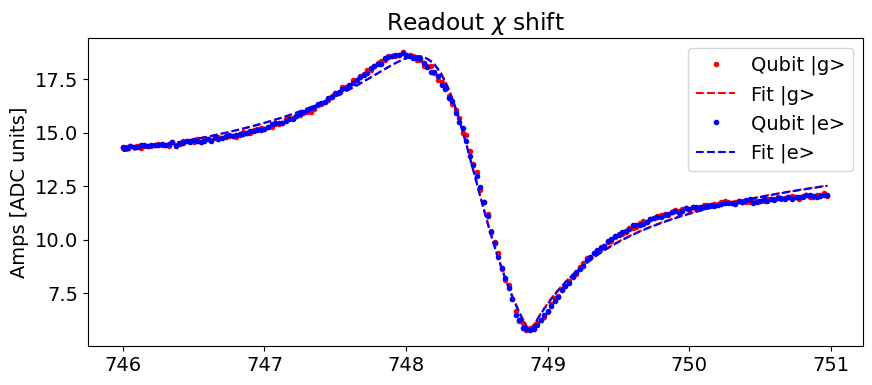

In [42]:
temp_data1, attrs1 = prev_data(expt_path, '00004_ECDReadSpecExperiment.h5')  # |g>
temp_data2, attrs2 = prev_data(expt_path, '00002_ECDReadSpecExperiment.h5')  # |e>
plot_spectroscopy(temp_data1['xpts'], temp_data1['amps'], e_data=temp_data2['amps'], title="Readout $\chi$ shift", fitparams=[8057.1, None, None, None, None, None, None])

[748.4875, 1000, 1000, 0, 12.959756607075526, 13.120901982892772, -0.45341384142641866]
[7.48435453e+02 2.31639238e+10 9.66104044e+02 1.14675782e+00
 1.21126657e+01 1.34449703e+00 3.69920236e-01]
f0 at |g>: 748.4354525547499


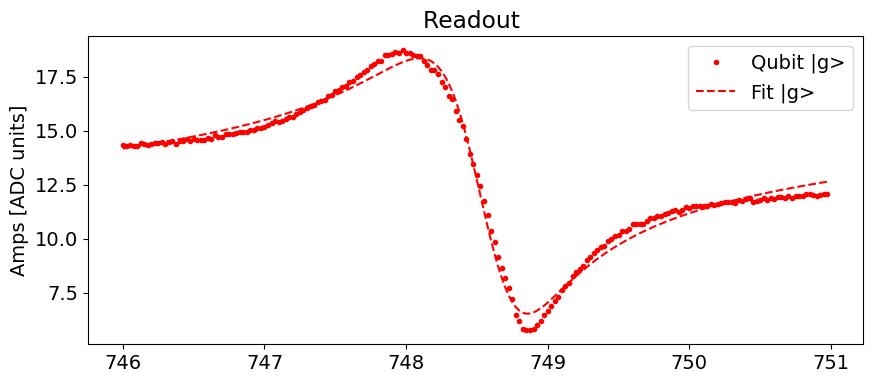

In [36]:

temp_data1, attr = prev_data(expt_path, '00002_ECDReadSpecExperiment.h5')  # |g>
plot_spectroscopy(temp_data1['xpts'], temp_data1['amps'], e_data=None, title="Readout ", fitparams=[None, 1000, 1000, None, None, None, None])

[748.4875, 1000, 1000, 0, 12.977431253445276, 13.137245019806869, -0.45348989568894543]
[7.48435956e+02 1.49281794e+10 9.69149820e+02 1.15158997e+00
 1.20809408e+01 1.37959696e+00 3.71162997e-01]
f0 at |g>: 748.4359562130907


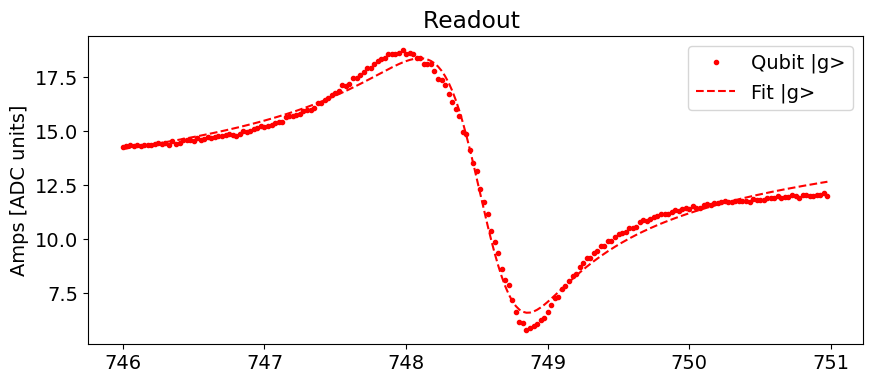

In [40]:

temp_data1, attr = prev_data(expt_path, '00004_ECDReadSpecExperiment.h5')  # |g>
plot_spectroscopy(temp_data1['xpts'], temp_data1['amps'], e_data=None, title="Readout ", fitparams=[None, 1000, 1000, None, None, None, None])